Note :
You need to be careful as this phase is whole state/ut wise analysis (not district-wise).

It is up to you which columns you want to keep or delete to make proper analysis

2.1	Analysis of Literacy Rate vs Total Crimes.

2.2	 Analysis of the type of crime vs each state vs Literacy rate

2.3	Analysis of year-on-year total crime rate.

2.4	 Analysis of area vs overall crime

2.5	 Analysis of Population vs overall Crime

2.6	Each state crime report. There is no fixed format to write a report, you can write a report inside the notebook itself based on what you have analyzed in the above points.


In [20]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [21]:
# Analysis of Literacy Rate vs Total Crimes.
# Consideration : - Crime against children
df = pd.read_csv(r"C:\Users\pradu\Downloads\children_crime_case.csv")
df

,STATE/UT,Year,Murder,Rape,Kidnapping and Abduction,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,...,Total,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban
0,ANDHRA PRADESH,2001,35,84,57,0,7,22,12,0,...,270,70.300000,50.400000,60.500000,191792.000000,3.828681e+07,3.744073e+07,7.621001e+07,5.540107e+07,2.080894e+07
1,ANDHRA PRADESH,2002,43,137,86,0,13,5,9,1,...,333,63.800000,43.500000,54.300000,83743.000000,5.739510e+05,5.171660e+05,1.091117e+06,8.700870e+05,2.278810e+05
2,ANDHRA PRADESH,2003,119,383,373,0,3,36,46,0,...,1463,71.300000,54.600000,63.300000,78438.000000,1.378780e+07,1.285061e+07,2.665553e+07,2.321629e+07,3.439240e+06
3,ANDHRA PRADESH,2004,71,363,396,0,2,26,60,0,...,1328,59.700000,33.100000,47.000000,94163.000000,4.315396e+07,3.972483e+07,8.299851e+07,7.431671e+07,8.681800e+06
4,ANDHRA PRADESH,2005,57,315,332,1,4,99,48,9,...,950,77.400000,51.900000,64.700000,135191.000000,1.045243e+07,1.034353e+07,2.083380e+07,1.664806e+07,4.185747e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407,WEST BENGAL,2008,19,129,196,1,0,1,53,2,...,513,78.609286,60.885061,69.630584,84876.539647,1.511960e+07,1.410235e+07,3.403327e+07,2.110402e+07,8.163175e+06
408,WEST BENGAL,2009,20,109,199,0,0,0,41,2,...,484,78.616063,60.886321,69.632741,85078.567023,1.515813e+07,1.413832e+07,3.412026e+07,2.115758e+07,8.184223e+06
409,WEST BENGAL,2010,16,73,332,0,3,0,200,48,...,880,78.606235,60.877194,69.622696,84961.737327,1.511628e+07,1.409494e+07,3.404680e+07,2.112183e+07,8.134093e+06
410,WEST BENGAL,2011,46,252,660,0,3,1,298,0,...,1450,78.600017,60.868044,69.613405,85155.180801,1.515130e+07,1.412751e+07,3.412692e+07,2.116980e+07,8.153803e+06


In [22]:
df.columns

Index(['STATE/UT', 'Year', 'Murder', 'Rape', 'Kidnapping and Abduction',
       'Foeticide', 'Abetment of suicide', 'Exposure and abandonment',
       'Procuration of minor girls', 'Buying of girls for prostitution',
       'Selling of girls for prostitution',
       'Prohibition of child marriage act', 'Other Crimes', 'Total',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban'],
      dtype='object')

In [23]:
df1=df[['STATE/UT','Year','Total',' LITERACY RATE %   (Male)',' LITERACY RATE % Female',' LITERACY RATE %  Average']]

In [24]:
df1

,STATE/UT,Year,Total,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average
0,ANDHRA PRADESH,2001,270,70.300000,50.400000,60.500000
1,ANDHRA PRADESH,2002,333,63.800000,43.500000,54.300000
2,ANDHRA PRADESH,2003,1463,71.300000,54.600000,63.300000
3,ANDHRA PRADESH,2004,1328,59.700000,33.100000,47.000000
4,ANDHRA PRADESH,2005,950,77.400000,51.900000,64.700000
...,...,...,...,...,...,...
407,WEST BENGAL,2008,513,78.609286,60.885061,69.630584
408,WEST BENGAL,2009,484,78.616063,60.886321,69.632741
409,WEST BENGAL,2010,880,78.606235,60.877194,69.622696
410,WEST BENGAL,2011,1450,78.600017,60.868044,69.613405


In [25]:
trend = df1.groupby('Year').sum().reset_index()[['Year','Total']]

In [26]:
trend

,Year,Total
0,2001,9313
1,2002,9563
2,2003,11117
3,2004,13595
4,2005,14022
5,2006,16807
6,2007,18391
7,2008,22500
8,2009,24159
9,2010,26694


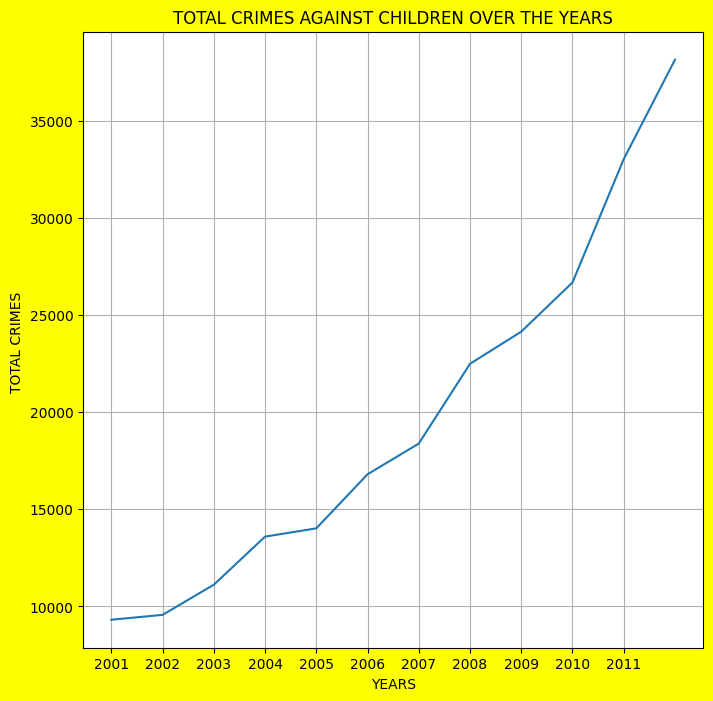

In [27]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.lineplot(x=trend['Year'],y=trend['Total'])
plt.xticks([x for x in range(2001,2012)])
plt.xlabel("YEARS")
plt.ylabel("TOTAL CRIMES ")
plt.title("TOTAL CRIMES AGAINST CHILDREN OVER THE YEARS")
plt.grid()
plt.show()

`Note`:
1. Total crimes increased drastically over the years.

In [28]:
res=trend['Total'].to_list()
percentage=[]
for i in range(len(res)):
    if(i==0):
        percentage.append(0)
    else:
        percentage.append(round((res[i]-res[i-1])/res[i]*100,2))
percentage

[0, 2.61, 13.98, 18.23, 3.05, 16.57, 8.61, 18.26, 6.87, 9.5, 19.23, 13.42]

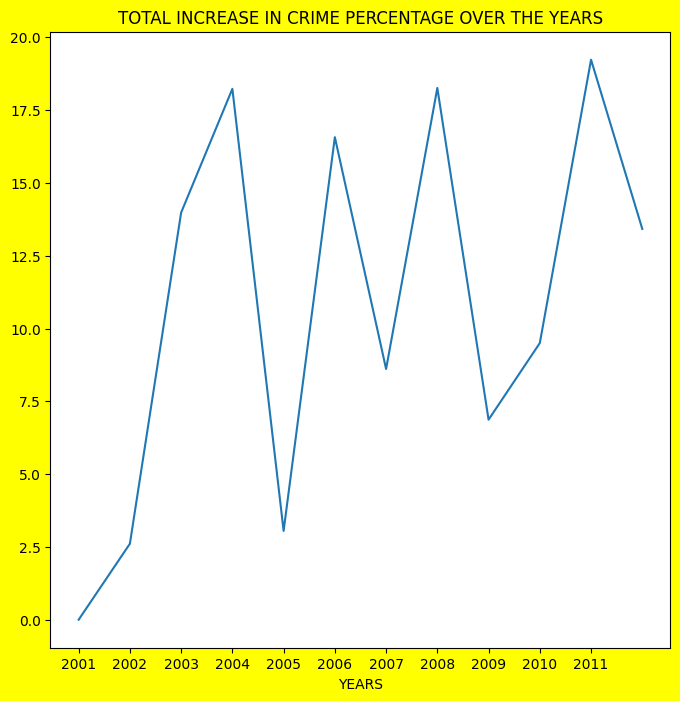

In [29]:
plt.figure(figsize=(8, 8), facecolor='Yellow')
sns.lineplot(x='Year', y= percentage, data=trend)  # Pass data as a DataFrame
plt.xticks([x for x in range(2001, 2012)])
plt.xlabel("YEARS")
plt.title("TOTAL INCREASE IN CRIME PERCENTAGE OVER THE YEARS")
plt.show()

`Note`:
Crimes Against Children in India: A Look at Trends

The data suggests a significant decrease in crimes against children between 2004 and 2005. This positive trend could be linked to:

Strengthened Legal Protections: The implementation of the Juvenile Justice (Care and Protection of Children) Act in 2005 might have provided a stronger legal framework for child safety and rehabilitation.
Increased Awareness: Campaigns by the government and NGOs to raise awareness of child abuse and promote child protection may have contributed to the decrease.
However, the data also shows a rise in crimes against children from 2005 to 2006. This increase could be due to several factors:

Shifting Societal Attitudes: Changes in societal views towards child abuse might have led to decreased social stigma and more reporting of crimes.
Social and Economic Factors: Breakdown in family structures, economic hardship, or changes in community support systems could be contributing factors.
High-Profile Cases: Media coverage of sensational cases of child abuse or trafficking may have led to a temporary surge in reported crimes.
It's important to note that without access to the actual data, it's difficult to pinpoint the exact causes of these trends. Further research is needed to understand the complex factors influencing crimes against children in India.

In [30]:
# Analysis of the type of crime vs each state vs Literacy rate
df2=df1.groupby('STATE/UT').sum().reset_index().sort_values(by='Total',ascending=False)

In [31]:
df2

,STATE/UT,Year,Total,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average
19,MADHYA PRADESH,24078,45385,924.500000,726.300000,819.500000
32,UTTAR PRADESH,24078,36002,998.294897,795.692782,902.565983
20,MAHARASHTRA,24078,31301,965.600000,764.300000,858.400000
9,DELHI,10050,17035,360.600000,258.500000,310.400000
1,ANDHRA PRADESH,24078,16579,885.300000,619.400000,761.000000
6,CHHATTISGARH,22077,13160,815.000000,569.000000,700.500000
11,GUJARAT,24078,11175,938.400000,751.600000,835.000000
28,RAJASTHAN,24078,11094,935.400000,762.700000,828.800000
4,BIHAR,24078,9863,948.600000,786.200000,846.500000
17,KERALA,24078,6941,953.500000,753.000000,846.400000


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


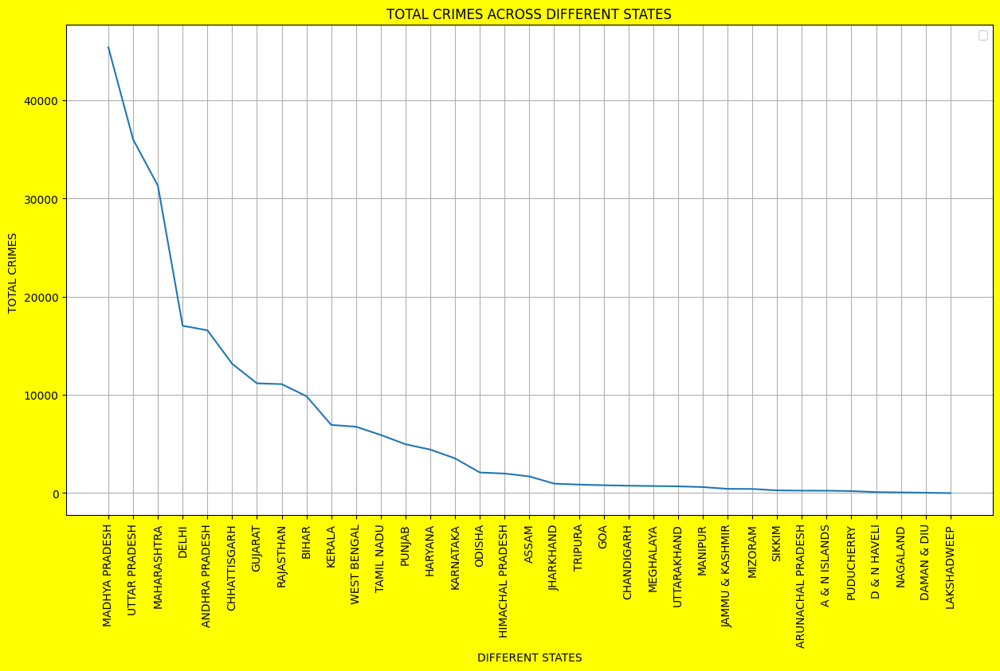

In [32]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=df2['STATE/UT'],y=df2['Total'])
plt.xticks(rotation=90)
plt.xlabel("DIFFERENT STATES")
plt.ylabel("TOTAL CRIMES ")
plt.title("TOTAL CRIMES ACROSS DIFFERENT STATES")
plt.legend()
plt.grid()
plt.show()

`Note`:
State Trends in Crimes Against Children (2001-2011)

Madhya Pradesh, Uttar Pradesh, and Maharashtra consistently reported the highest number of crimes against children over the period 2001 to 2011.
Lakshadweep, due to its small population, had the fewest recorded crimes against children among all Union Territories.
It's noteworthy that Delhi is the only Union Territory with a higher number of reported crimes compared to other Union Territories.

In [33]:
df4=df1.groupby('STATE/UT').mean().reset_index().sort_values(by=' LITERACY RATE %  Average',ascending=False)

In [34]:
df4

,STATE/UT,Year,Total,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average
32,UTTAR PRADESH,2006.500000,3000.166667,83.191241,66.307732,75.213832
23,MIZORAM,2006.500000,35.250000,81.866667,64.241667,73.725000
2,ARUNACHAL PRADESH,2006.500000,20.833333,81.908333,64.200000,73.675000
5,CHANDIGARH,2006.500000,62.750000,81.908333,64.200000,73.675000
8,DAMAN & DIU,2006.500000,3.166667,81.908333,64.200000,73.675000
26,PUDUCHERRY,2006.500000,17.083333,81.908333,64.200000,73.675000
29,SIKKIM,2006.500000,23.083333,80.475000,62.458333,72.100000
20,MAHARASHTRA,2006.500000,2608.416667,80.466667,63.691667,71.533333
0,A & N ISLANDS,2006.500000,20.416667,79.050000,65.516667,70.541667
4,BIHAR,2006.500000,821.916667,79.050000,65.516667,70.541667


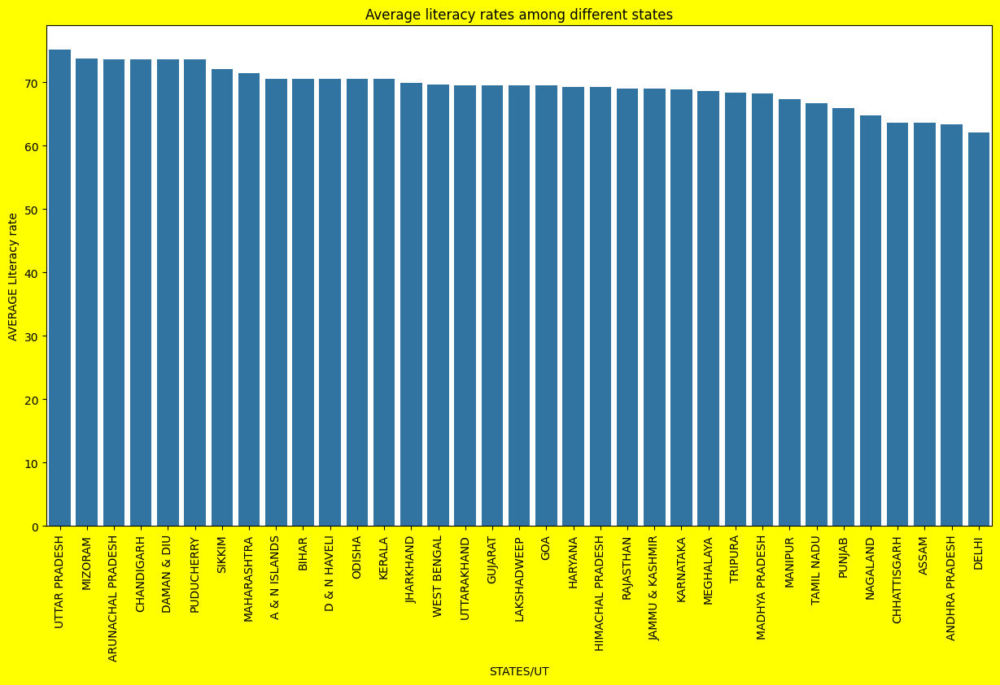

In [35]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=df4['STATE/UT'],y=df4[' LITERACY RATE %  Average'],)
plt.xticks(rotation=90)
plt.xlabel("STATES/UT")
plt.ylabel("AVERAGE LIteracy rate")
plt.title("Average literacy rates among different states")
plt.show()

`Note`:
Literacy Rates in India

Kerala, Mizoram, and Lakshadweep boast the highest average literacy rates in India.
Bihar currently has the lowest literacy rate in the country.
Challenges to Education in Bihar

Several factors may contribute to Bihar's lower literacy rates, including:

Limited infrastructure for education
Poverty and economic hardship
Lack of awareness about the importance of education
Prevalence of child labor
Addressing these challenges is crucial for improving educational opportunities and overall development in Bihar.

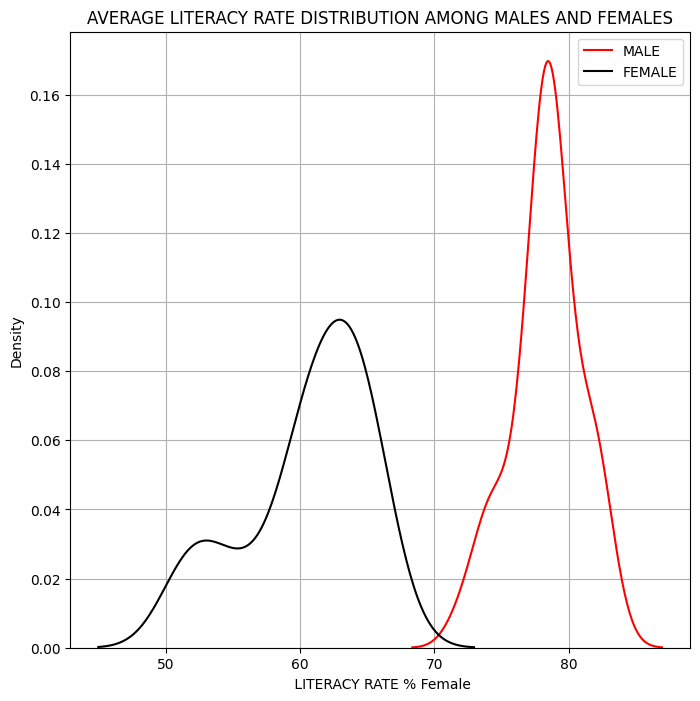

In [36]:
plt.figure(figsize=(8,8))
sns.distplot(df4[' LITERACY RATE %   (Male)'],hist=False,color='Red',label="MALE")
sns.distplot(df4[' LITERACY RATE % Female'],hist=False,color='Black',label="FEMALE")
plt.title("AVERAGE LITERACY RATE DISTRIBUTION AMONG MALES AND FEMALES")
plt.legend()
plt.grid()
plt.show()

`Note`:
Literacy Rates in India: A Gender Gap

Data shows a significant gender gap in literacy rates in India, with males generally having higher literacy rates than females.

Several factors contribute to this disparity:

Early Marriage and Childbearing: In some regions, girls are married young and may start families soon after. This can disrupt their education and make it challenging to attend school regularly, especially in areas with limited access to childcare or healthcare.
Gender-Based Violence: Higher rates of gender-based violence can create a safety concern for girls attending school, particularly when traveling alone. This fear may also discourage parents from allowing their daughters to pursue education.

### Relation b/w the total crimes and average literacy rate

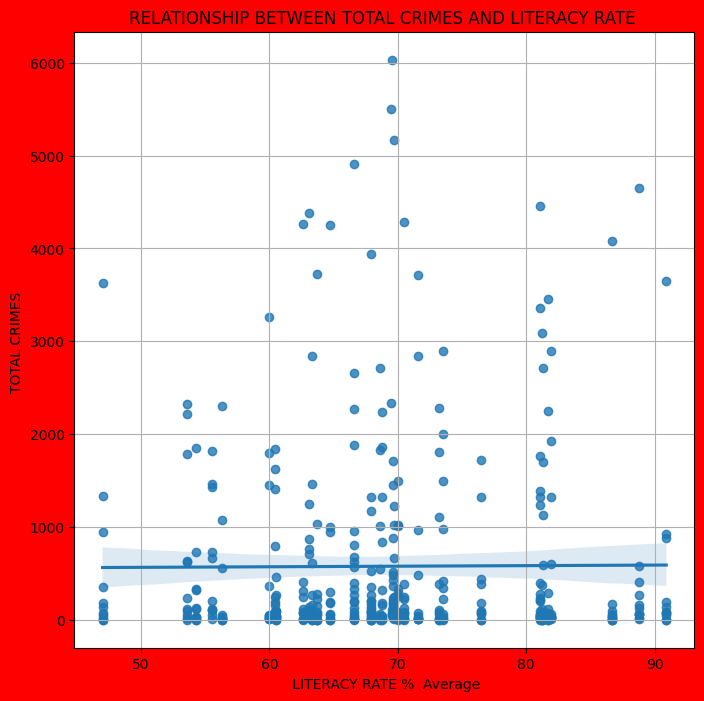

In [37]:
plt.figure(figsize=(8,8),facecolor='Red')
sns.regplot(x=df[' LITERACY RATE %  Average'],y=df['Total'])
plt.ylabel("TOTAL CRIMES ")
plt.title("RELATIONSHIP BETWEEN TOTAL CRIMES AND LITERACY RATE ")
plt.grid()
plt.show()

`Note`:
The scatter plot does not indicate a strong relationship between the two features. While there appears to be a weak negative correlation, more data or a different analysis may be needed to confirm this.

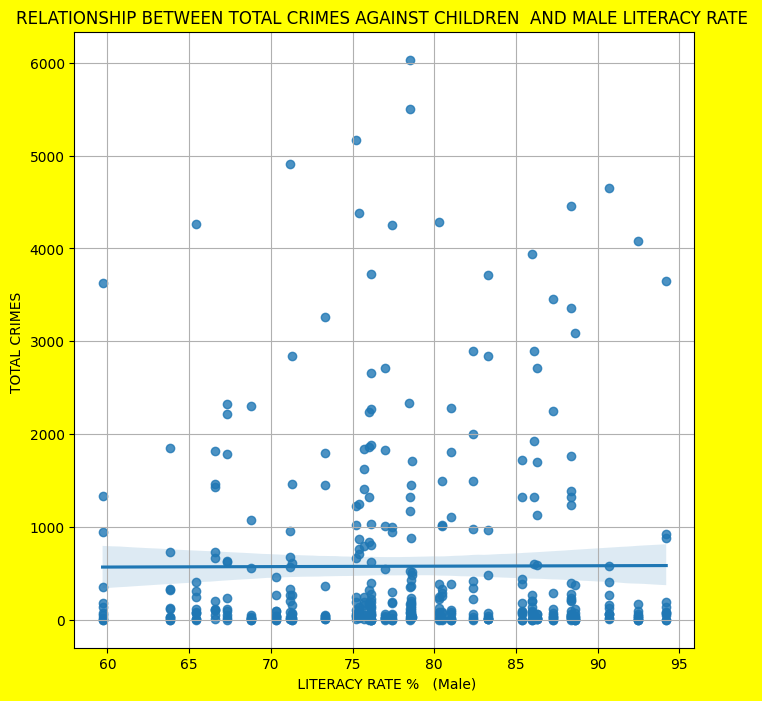

In [38]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df[' LITERACY RATE %   (Male)'],y=df['Total'])
plt.ylabel("TOTAL CRIMES ")
plt.title("RELATIONSHIP BETWEEN TOTAL CRIMES AGAINST CHILDREN  AND MALE LITERACY RATE ")
plt.grid()
plt.show()

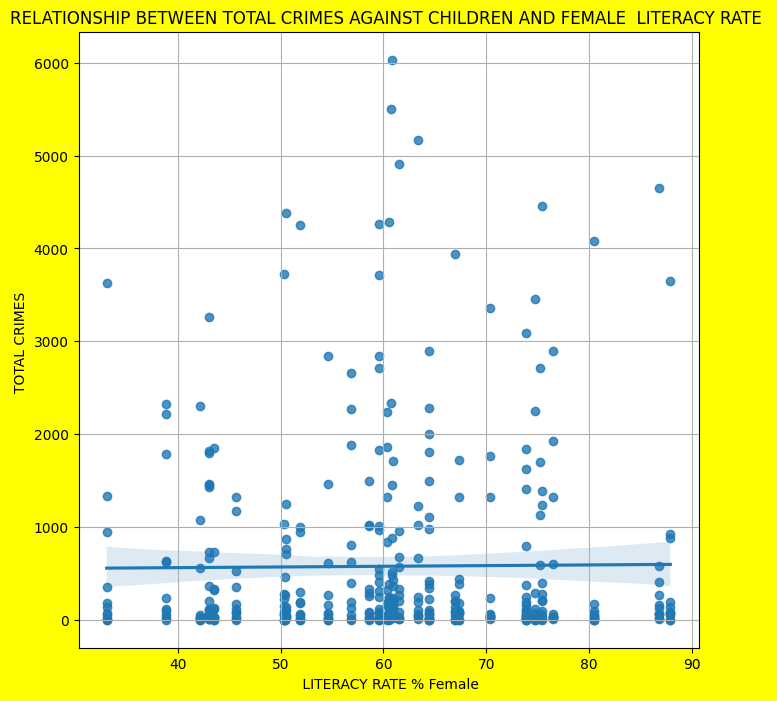

In [39]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df[' LITERACY RATE % Female'],y=df['Total'])
plt.ylabel("TOTAL CRIMES ")
plt.title("RELATIONSHIP BETWEEN TOTAL CRIMES AGAINST CHILDREN AND FEMALE  LITERACY RATE ")
plt.grid()
plt.show()

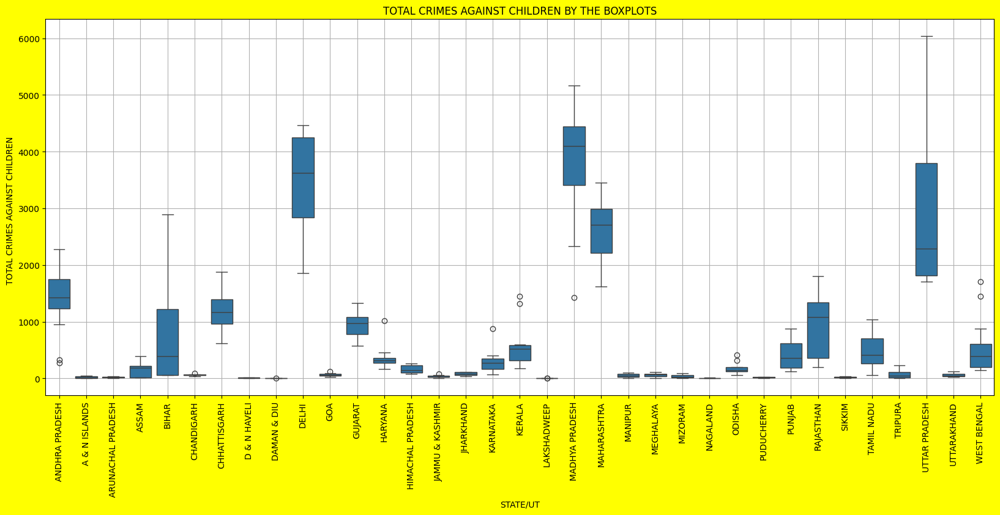

In [40]:
plt.figure(figsize=(20,8),facecolor='Yellow')
sns.boxplot(x=df['STATE/UT'],y=df['Total'])
plt.title("TOTAL CRIMES AGAINST CHILDREN BY THE BOXPLOTS")
plt.ylabel("TOTAL CRIMES AGAINST CHILDREN  ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [41]:
df1

,STATE/UT,Year,Total,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average
0,ANDHRA PRADESH,2001,270,70.300000,50.400000,60.500000
1,ANDHRA PRADESH,2002,333,63.800000,43.500000,54.300000
2,ANDHRA PRADESH,2003,1463,71.300000,54.600000,63.300000
3,ANDHRA PRADESH,2004,1328,59.700000,33.100000,47.000000
4,ANDHRA PRADESH,2005,950,77.400000,51.900000,64.700000
...,...,...,...,...,...,...
407,WEST BENGAL,2008,513,78.609286,60.885061,69.630584
408,WEST BENGAL,2009,484,78.616063,60.886321,69.632741
409,WEST BENGAL,2010,880,78.606235,60.877194,69.622696
410,WEST BENGAL,2011,1450,78.600017,60.868044,69.613405


### Year wise Analysis on TOTAL CRIMES 

In [42]:
year=[x for x in range(2001,2013)]

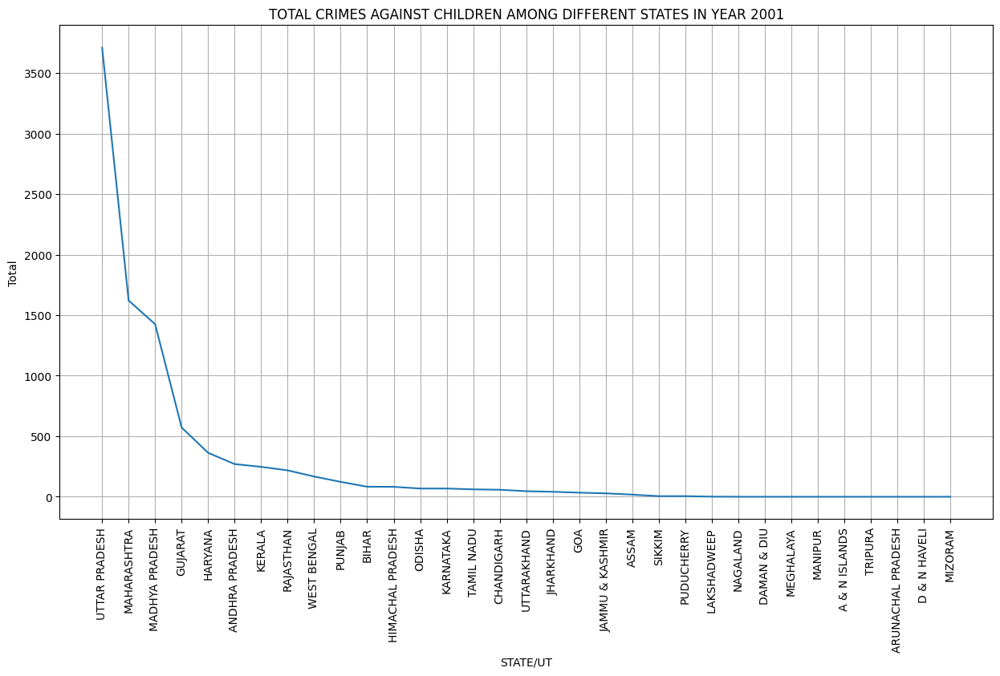

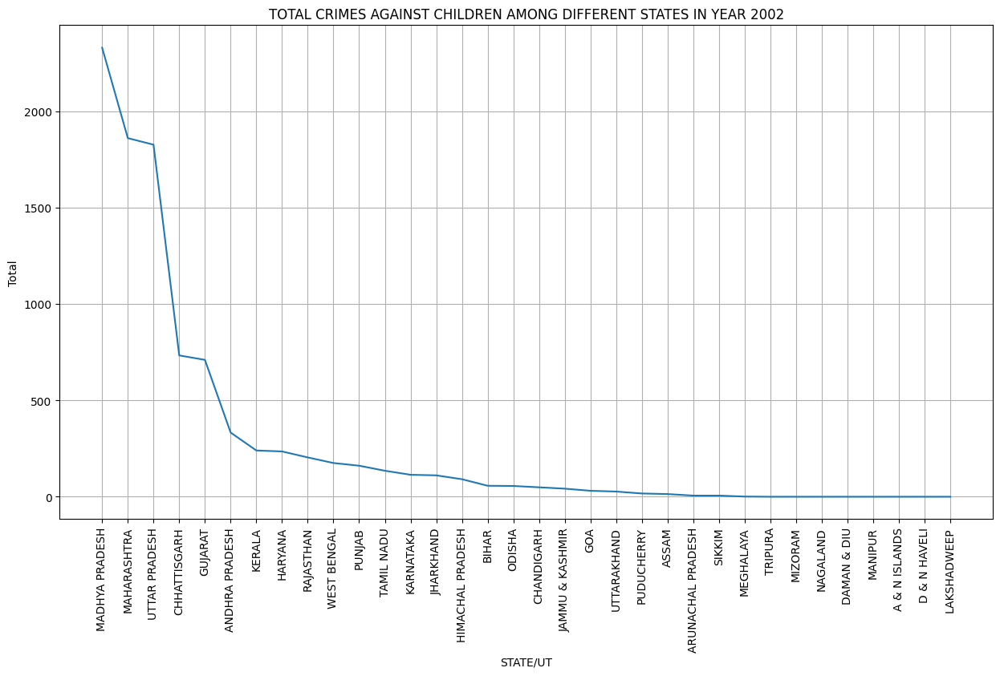

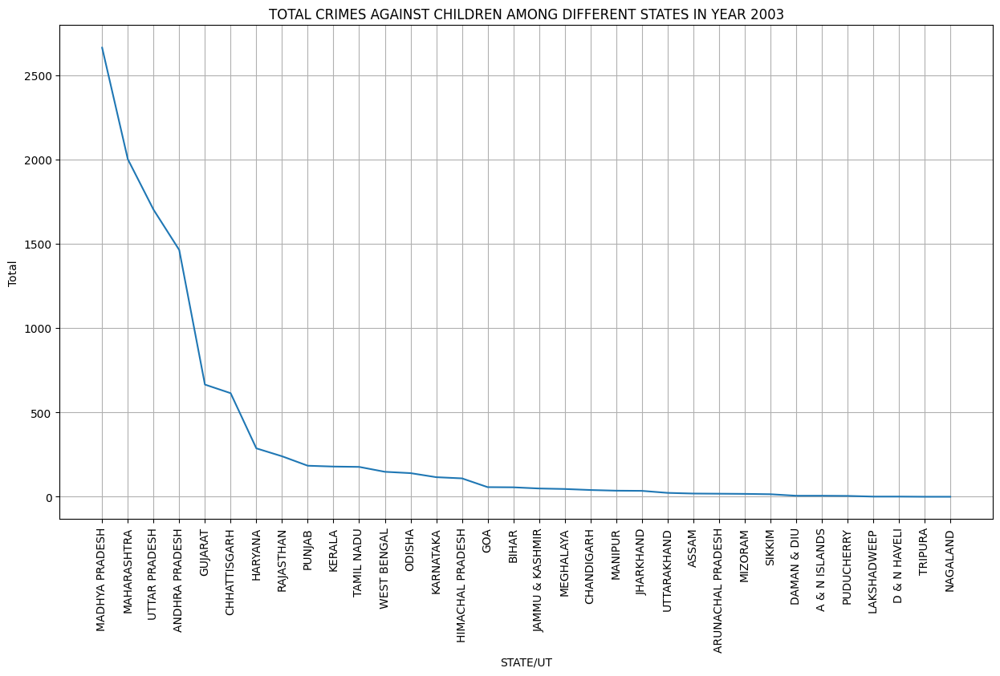

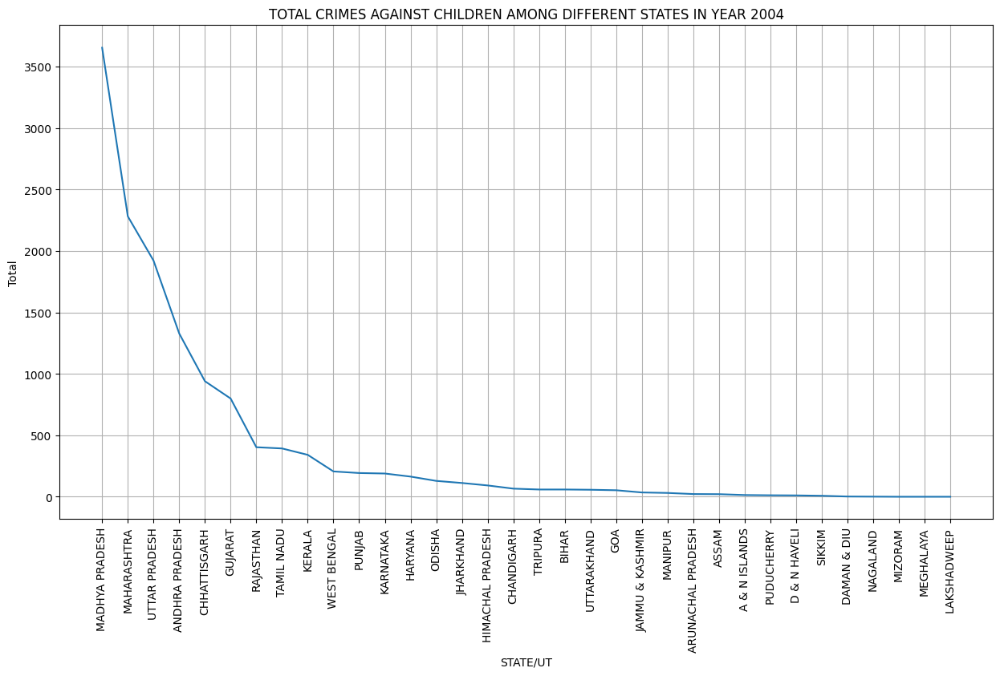

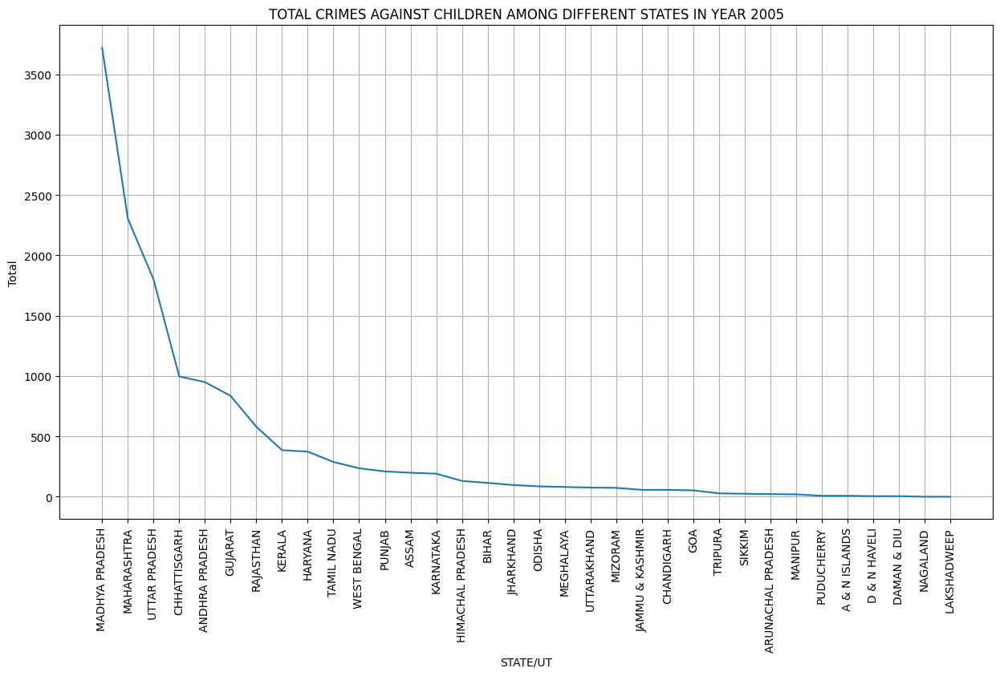

...

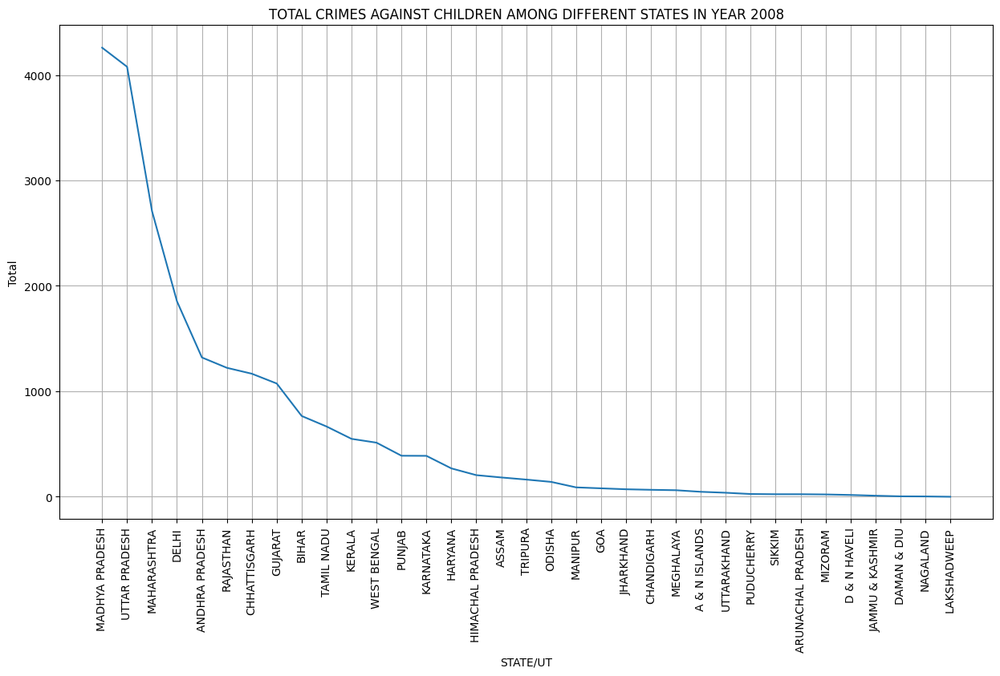

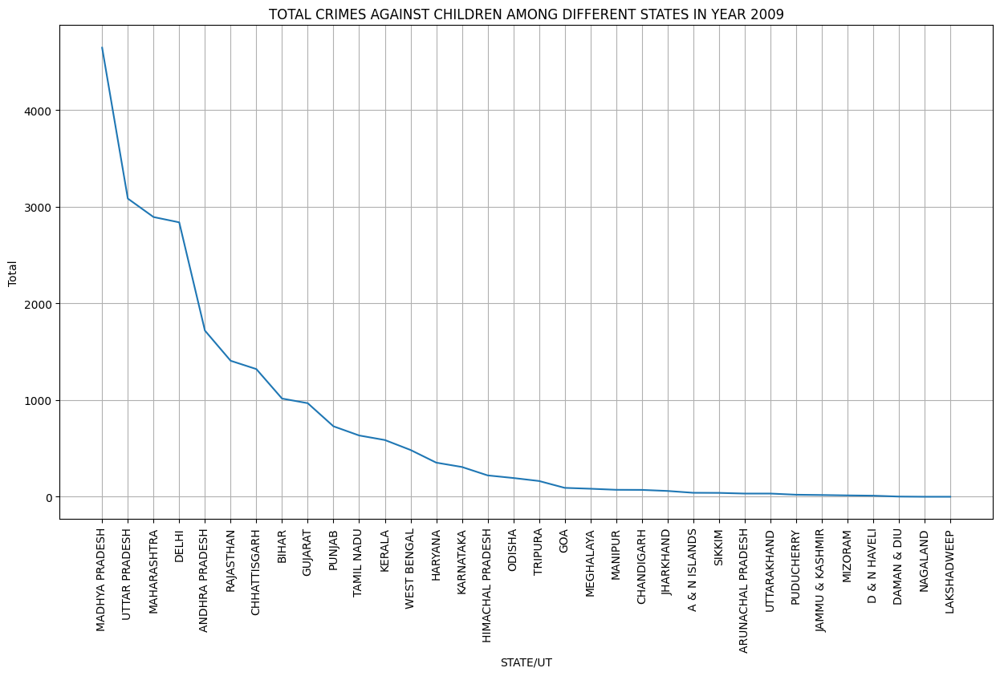

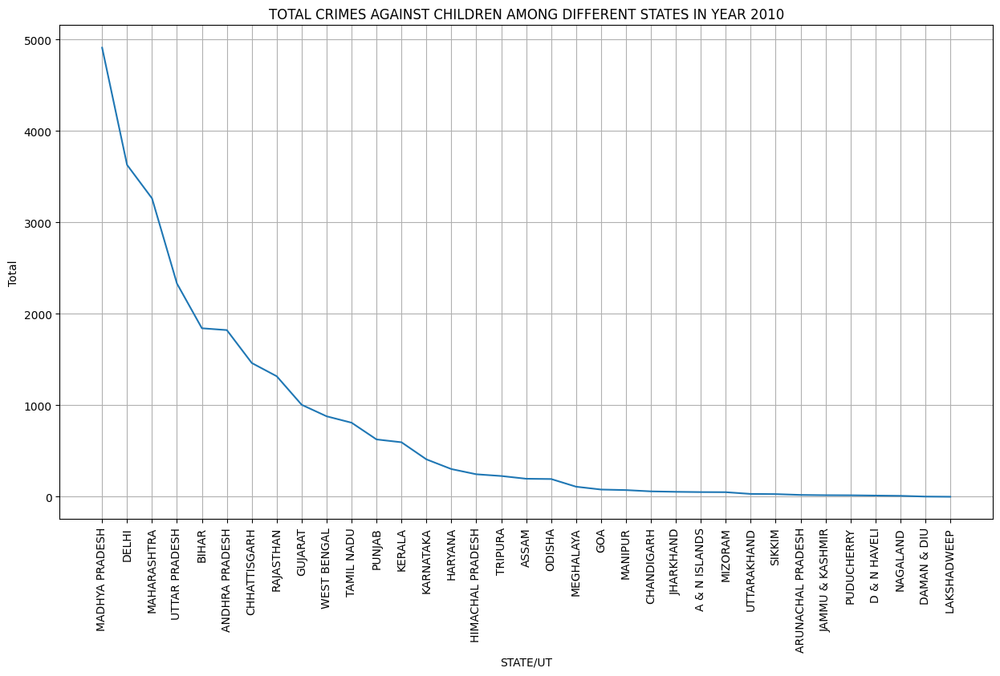

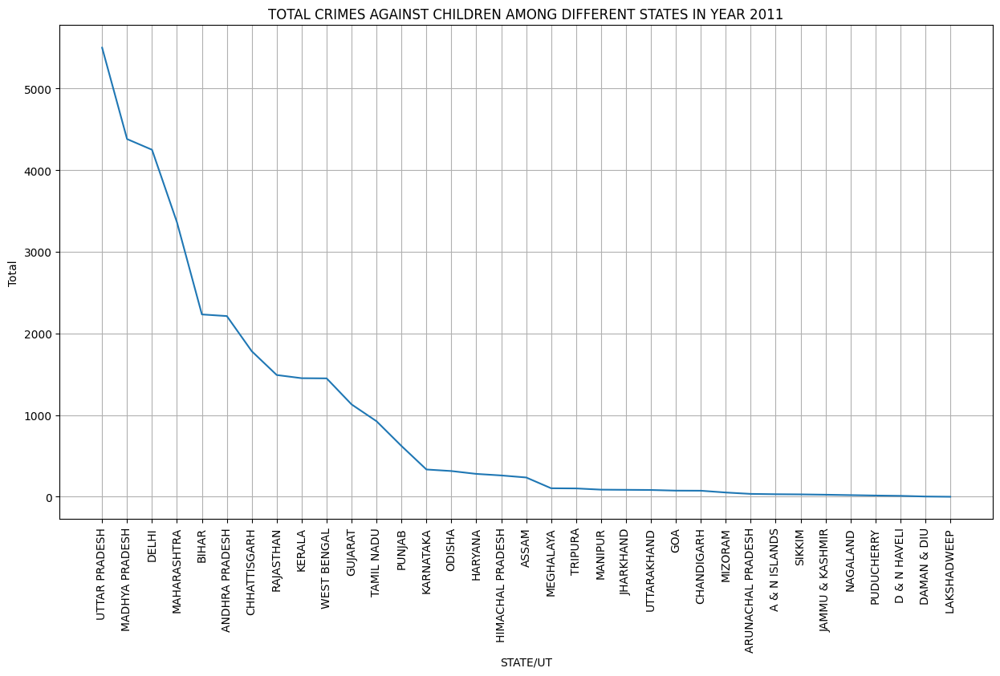

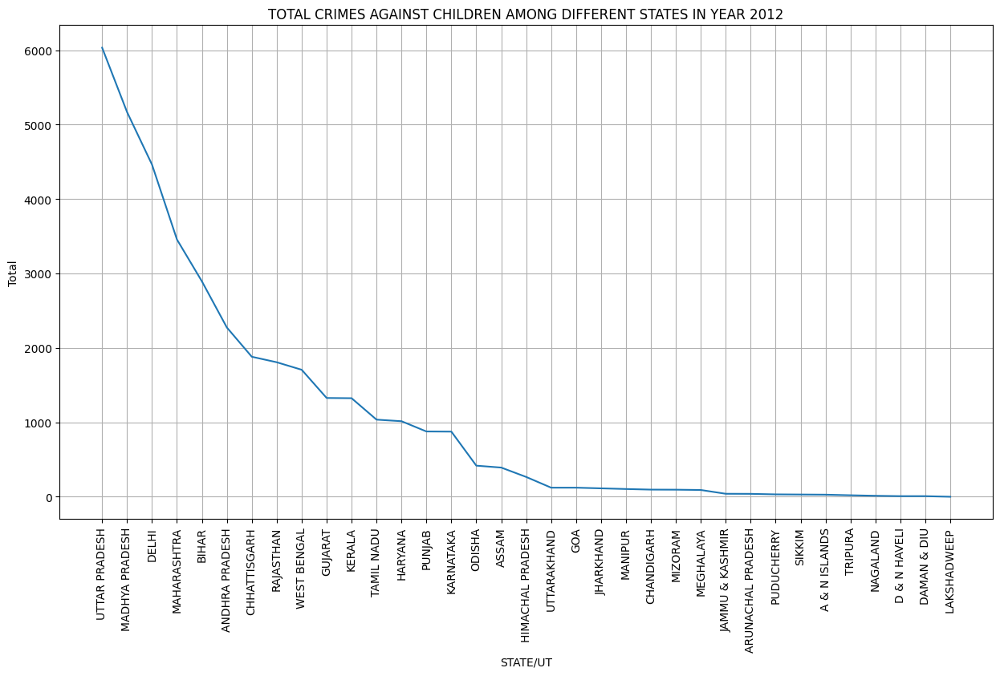

In [43]:
for i in year:
    plt.figure(figsize=(15,8))
    test=df1[df1['Year']==i].sort_values(by='Total',ascending=False)
    sns.lineplot(x=test['STATE/UT'],y=test['Total'])
    plt.xticks(rotation=90)
    plt.title("TOTAL CRIMES AGAINST CHILDREN AMONG DIFFERENT STATES IN YEAR {}".format(i))
    plt.grid()
    plt.show()

`Note`:
State Trends in Crimes Against Children (2001-2011)

Uttar Pradesh, Madhya Pradesh, and Maharashtra consistently ranked among the top 3 states with the highest number of crimes against children over the period. Their positions within the top 3 may have fluctuated slightly year-to-year.
In contrast, Nagaland, Mizoram, and Lakshadweep consistently reported the fewest crimes against children, with the "safest" state/UT title likely shifting between them throughout the decade.
Manipur experienced a significant rise in reported crimes from 2005 to 2006, jumping from 28th to 21st in the national ranking (when states are arranged by decreasing crime rates).
Possible Explanations:

Low Crime Rates in Lakshadweep: The low number of crimes against children in Lakshadweep could be attributed to several factors, including:

Unique social structure: Lakshadweep's traditionally matriarchal society with high social status for women might deter crimes against children, particularly those by men.
Close-knit community: The tight-knit nature of the island communities, where everyone knows each other, could discourage potential offenders.
Low population density: With a small population spread across multiple islands, there might be fewer opportunities for crimes to go unnoticed.
Increase in Manipur: Inadequate law enforcement infrastructure and a lack of awareness about child protection laws in Manipur could have led to ineffective prosecution of offenders, contributing to the rise in reported crimes.

### Year wise Analysis on average literacy rates

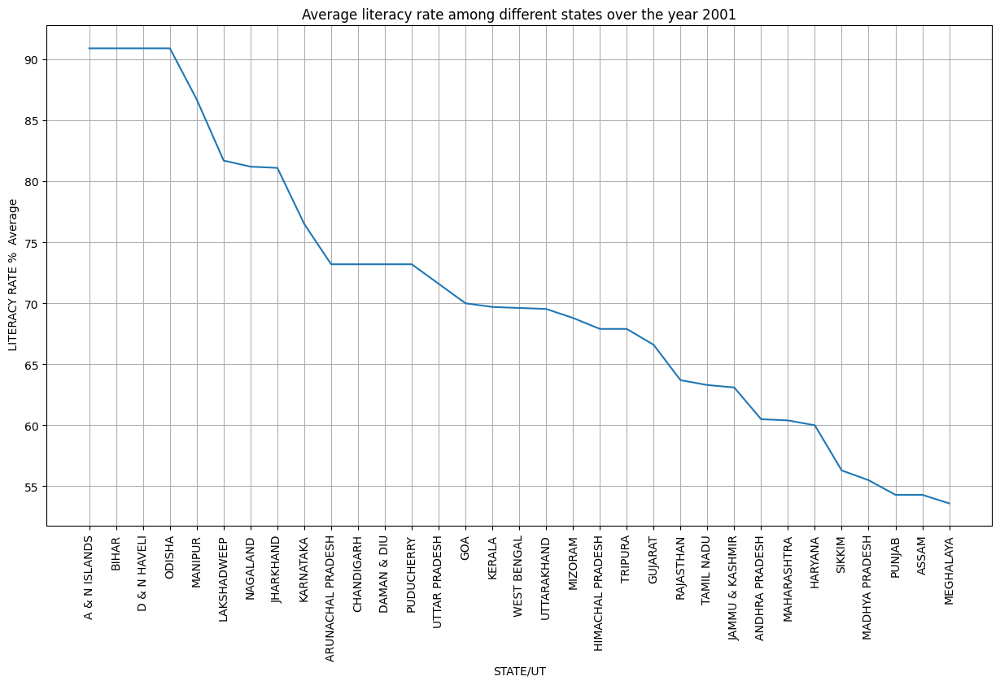

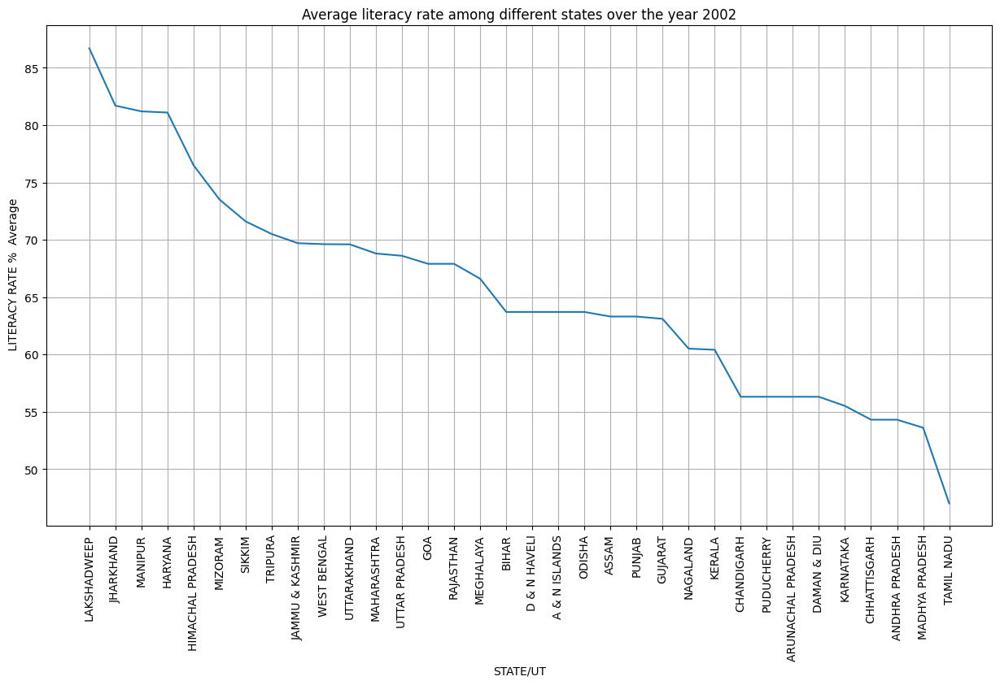

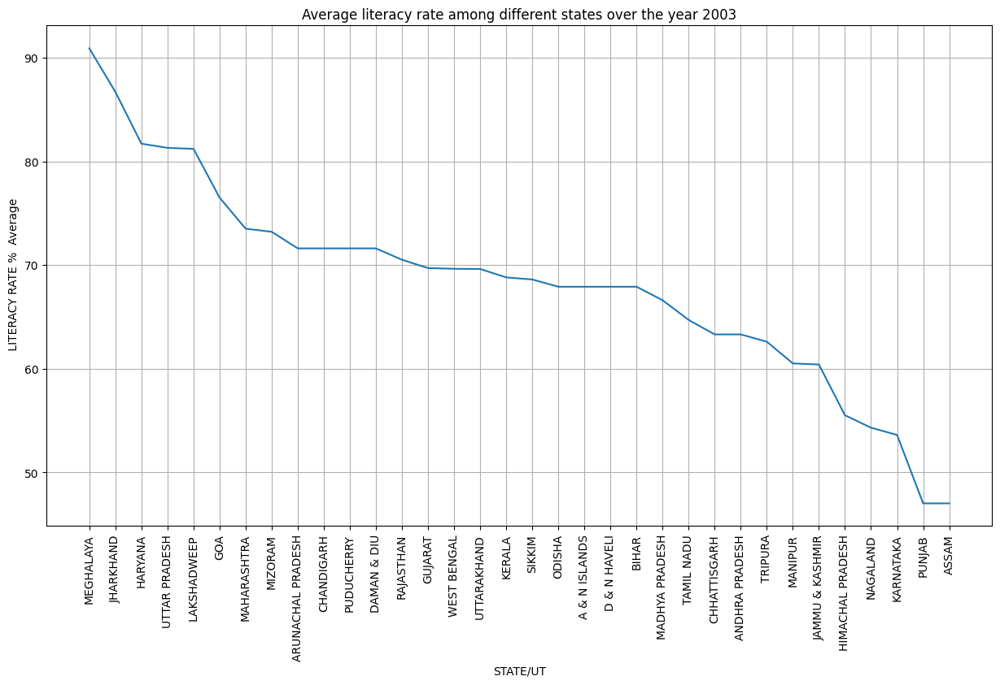

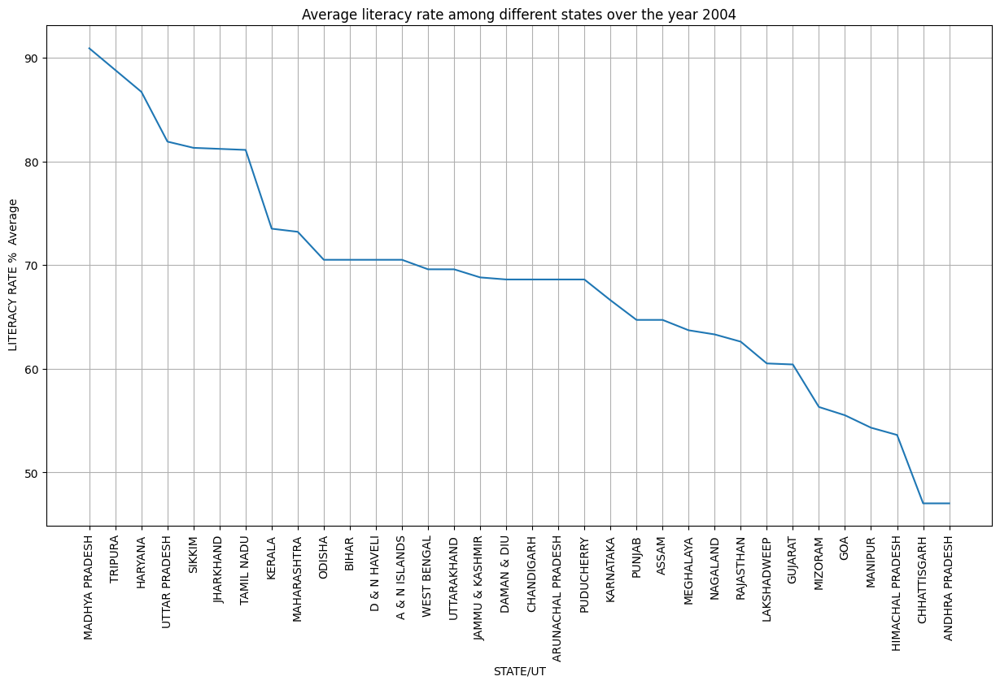

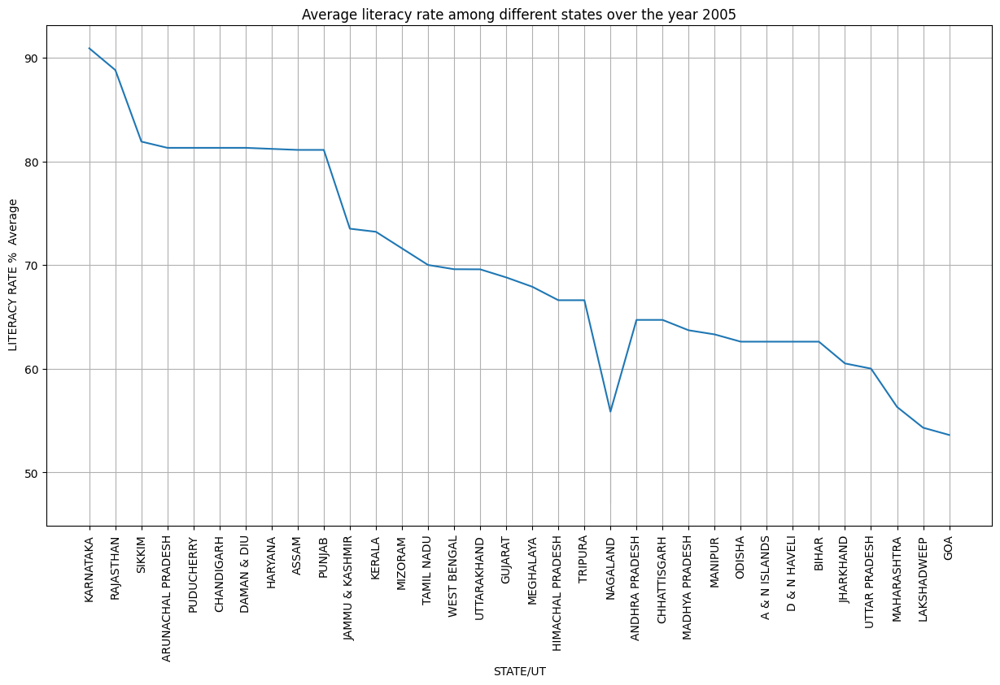

...

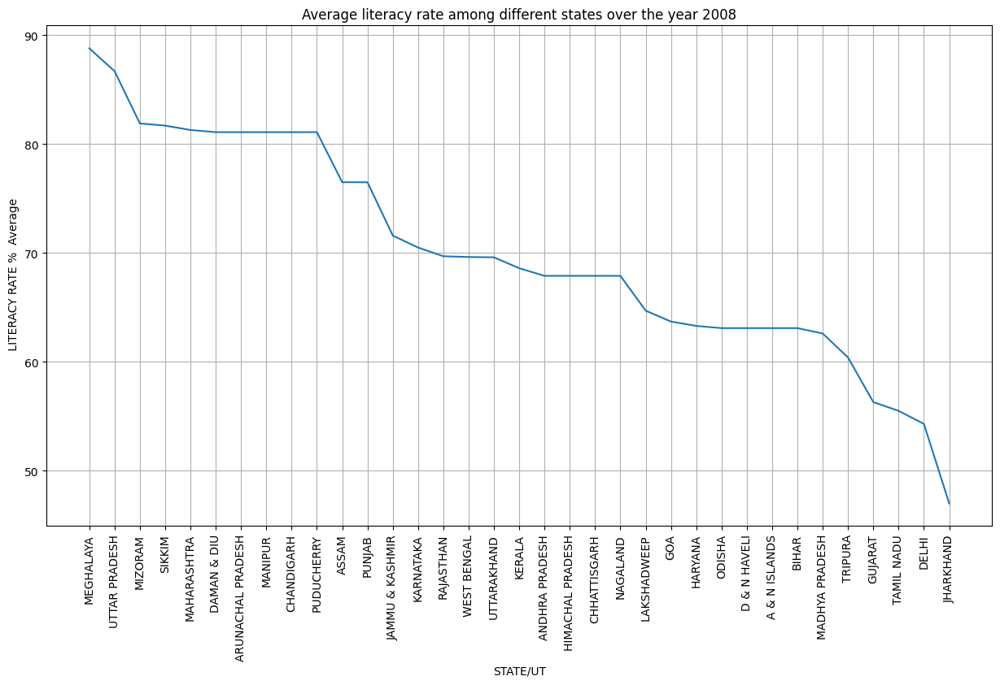

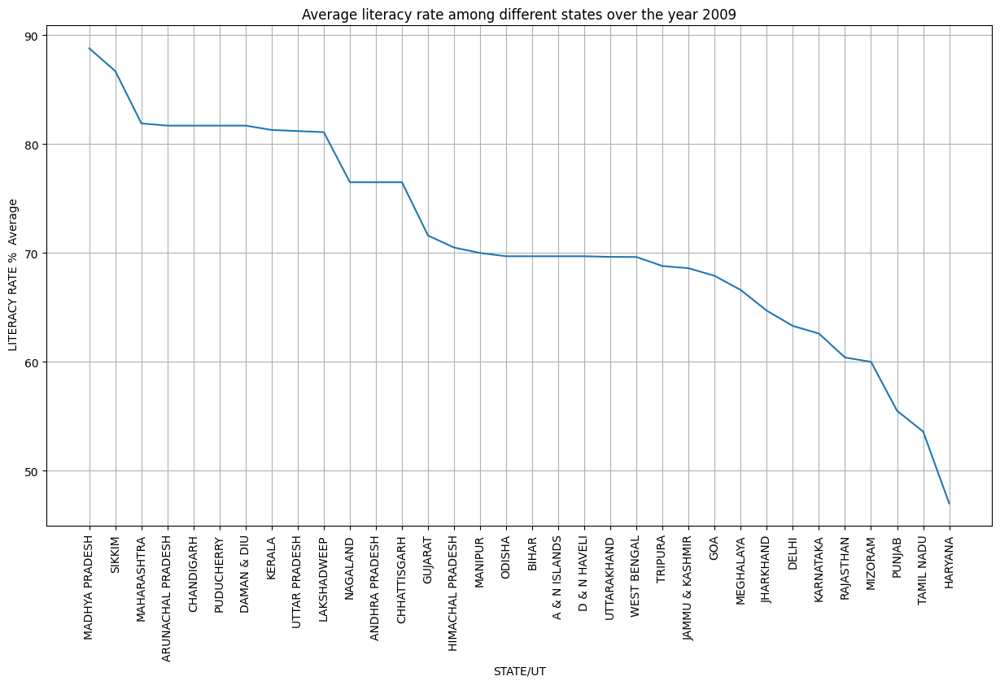

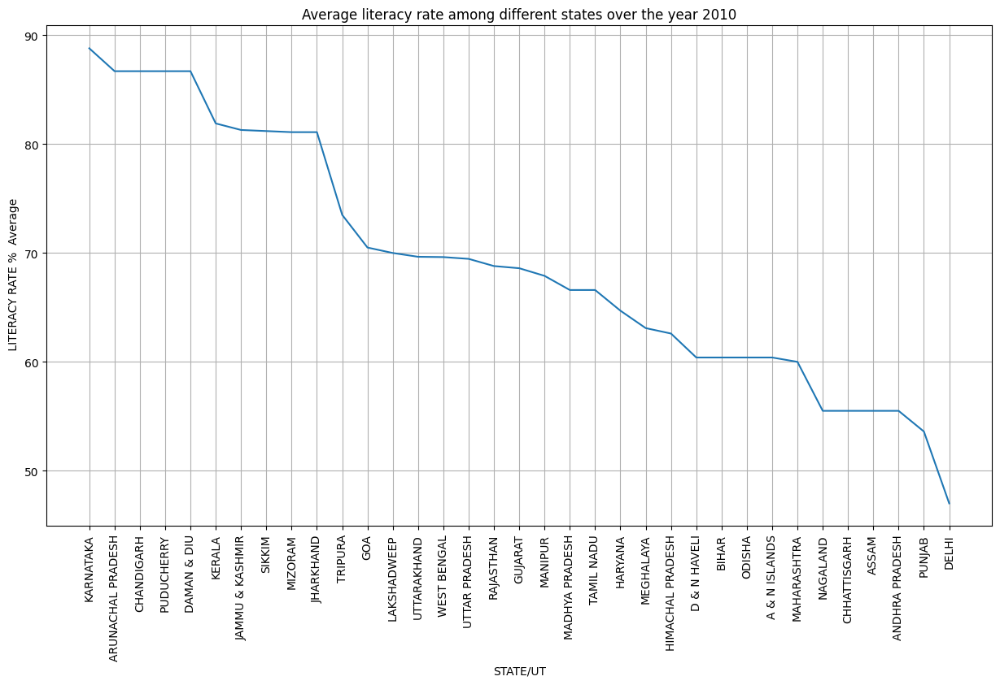

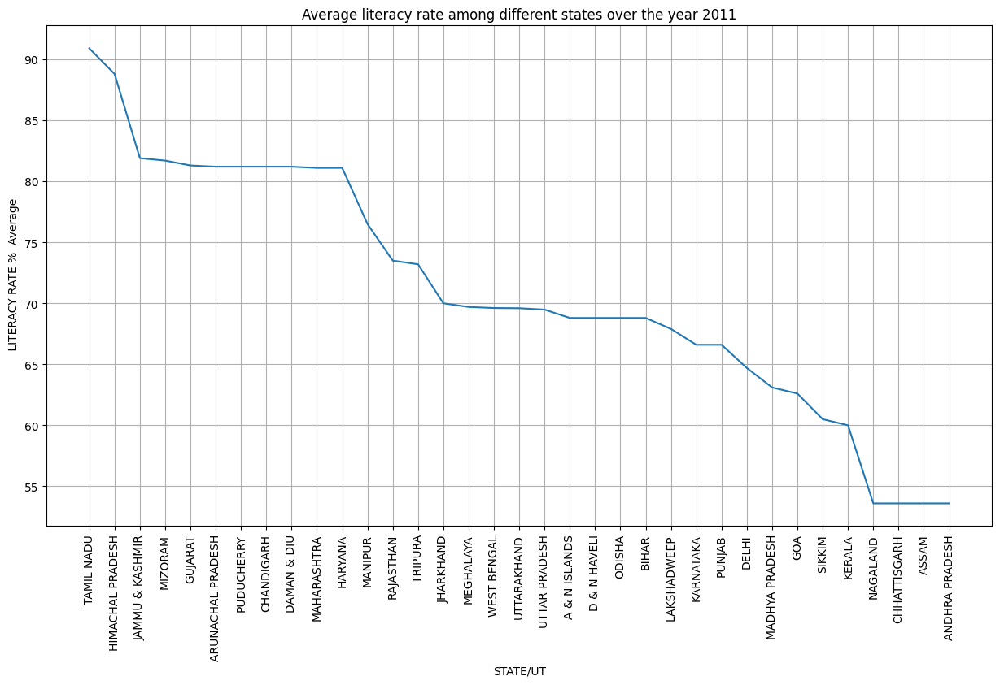

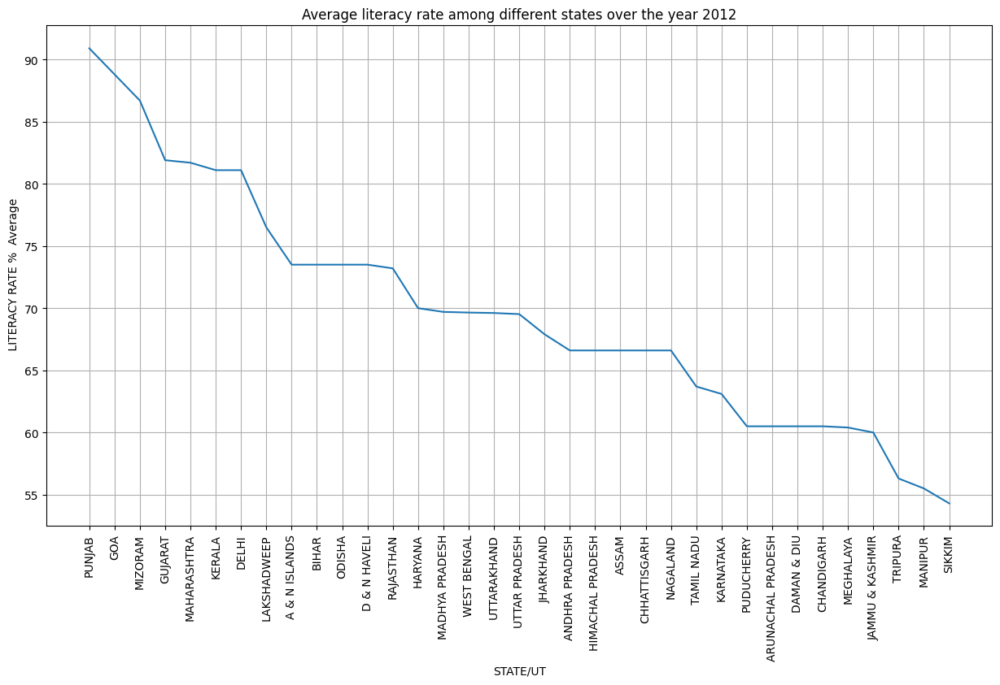

In [44]:
for i in year:
    plt.figure(figsize=(15,8))
    test=df1[df1['Year']==i].sort_values(by=' LITERACY RATE %  Average',ascending=False)
    sns.lineplot(x=test['STATE/UT'],y=test[' LITERACY RATE %  Average'])
    plt.xticks(rotation=90)
    plt.title("Average literacy rate among different states over the year {}".format(i))
    plt.grid()
    plt.show()

`Note`:
Literacy Leaders and Laggards (2001-2011)

Kerala, Mizoram, and Lakshadweep consistently held the top positions for literacy rates throughout the period 2001 to 2011.
Bihar, on the other hand, remained at the bottom of the literacy rankings during this time.
Challenges to Literacy in Bihar:

Several factors likely contribute to Bihar's lower literacy rates:

Poverty: Being one of India's poorest states, with a significant population below the poverty line, Bihar faces challenges in affording education for children. This poverty may force children to drop out of school and contribute to the family income.
Infrastructure Issues: Providing adequate infrastructure like schools, teachers, and learning materials has been a hurdle for Bihar. Understaffed schools with inadequate facilities hinder the quality of education.
High Student-Teacher Ratio: Bihar's high population density, particularly in rural areas, leads to a large student-teacher ratio. This makes it difficult for teachers to provide proper individual attention to each student.
Lakshadweep's Success:

In contrast, Lakshadweep stands out for its achievements in both literacy and low crime rates against children. Further research into Lakshadweep's specific social and educational structures could offer valuable insights.

### Difference b/w male and female literacy rates among different states over the years b/w 2001 to 2012

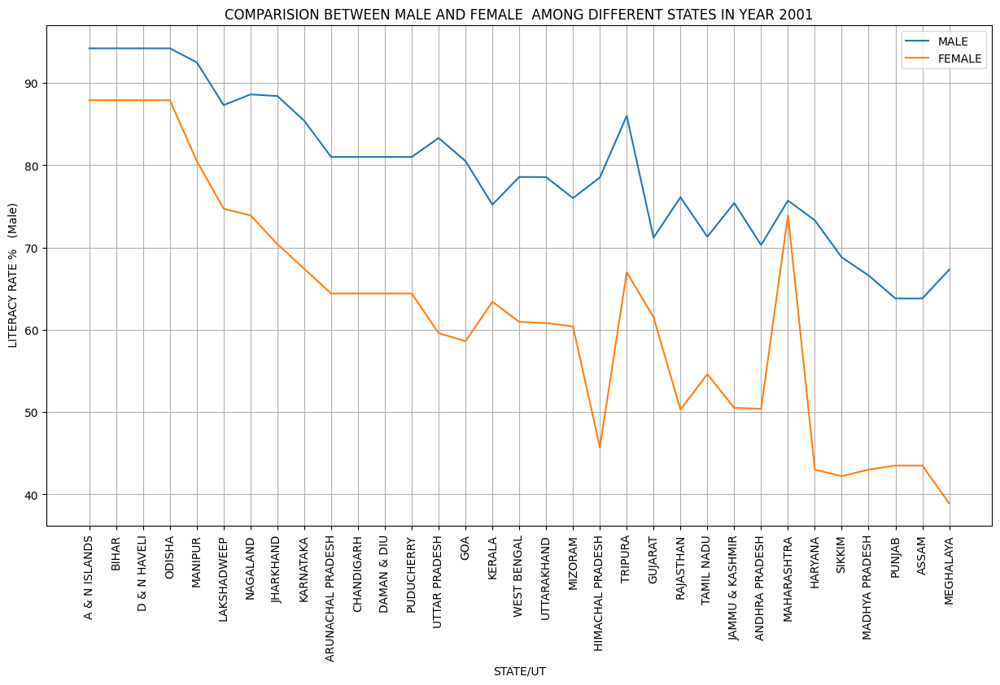

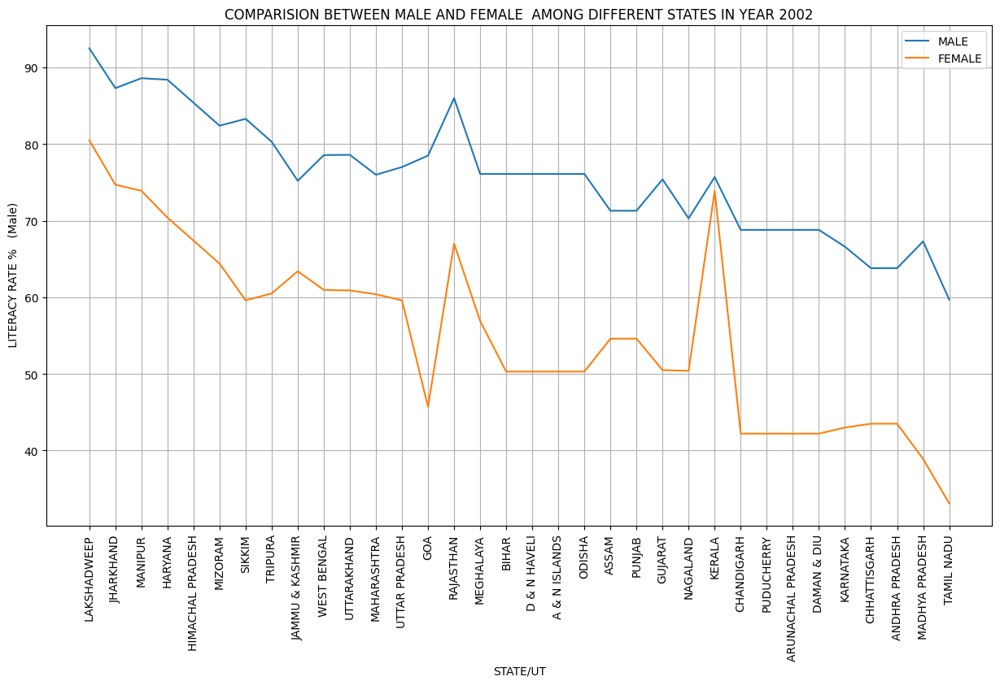

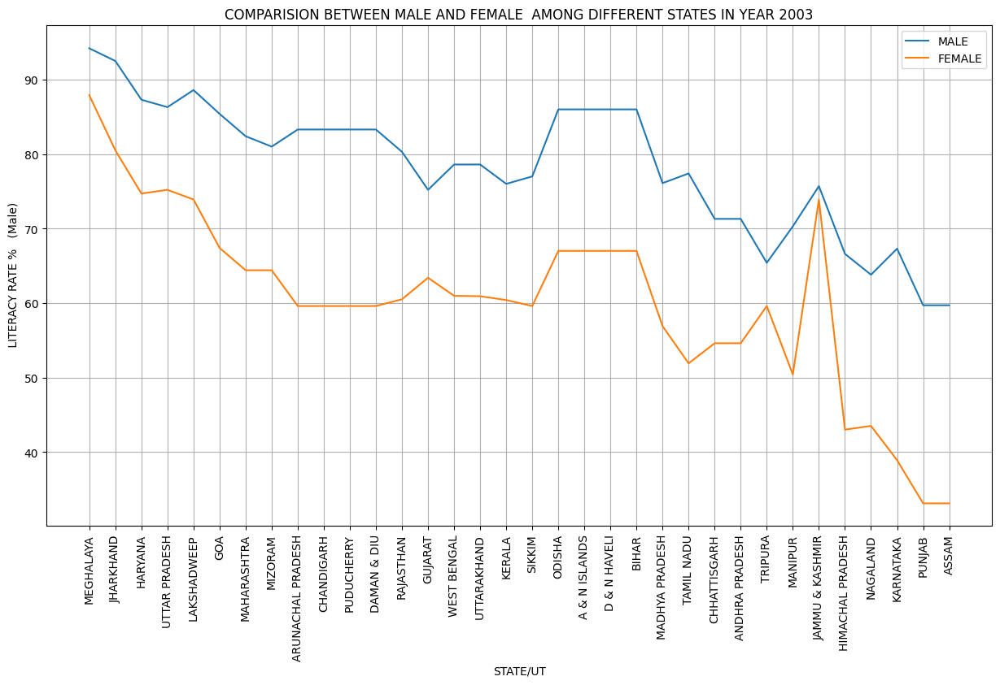

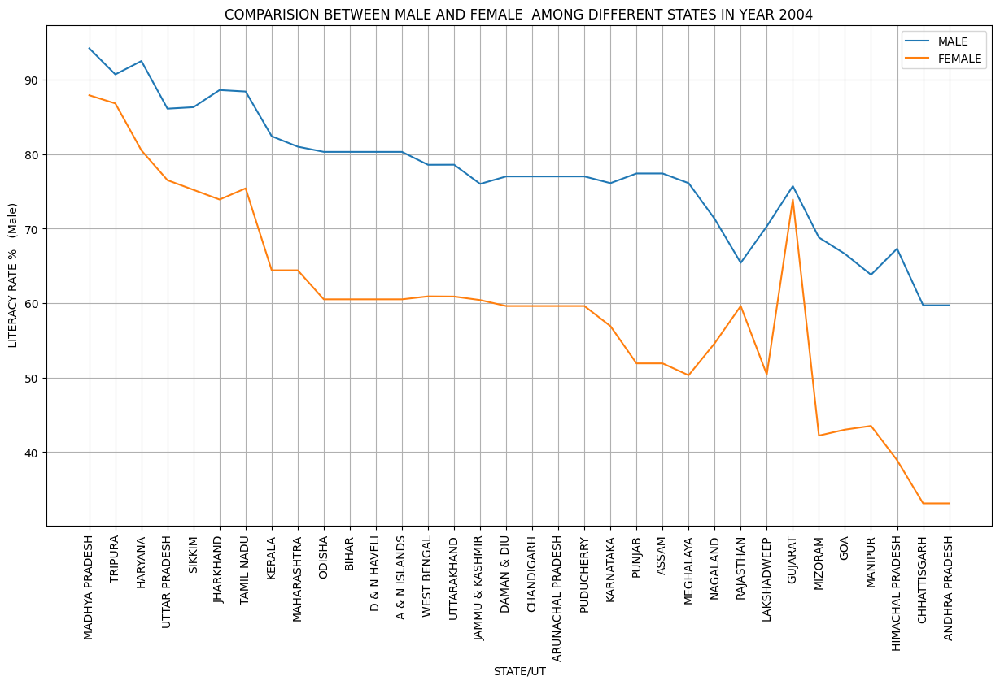

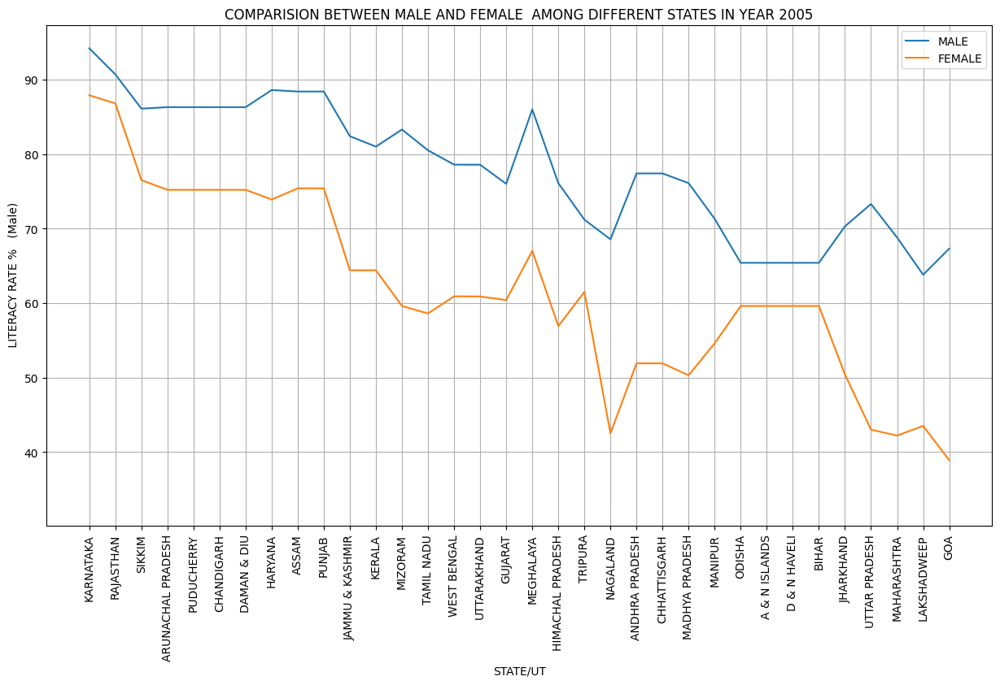

...

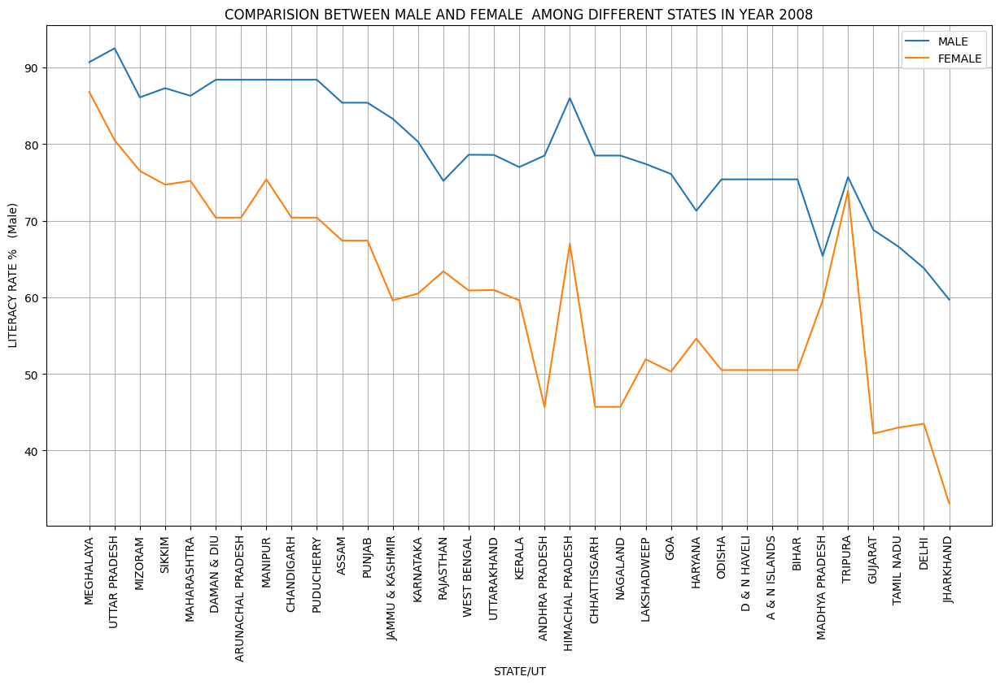

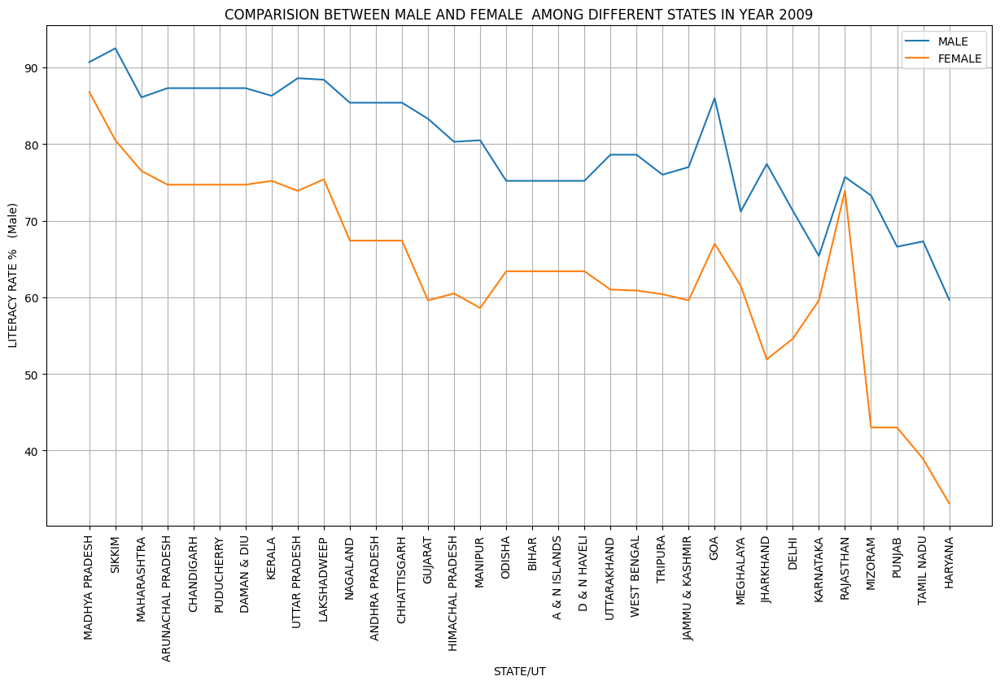

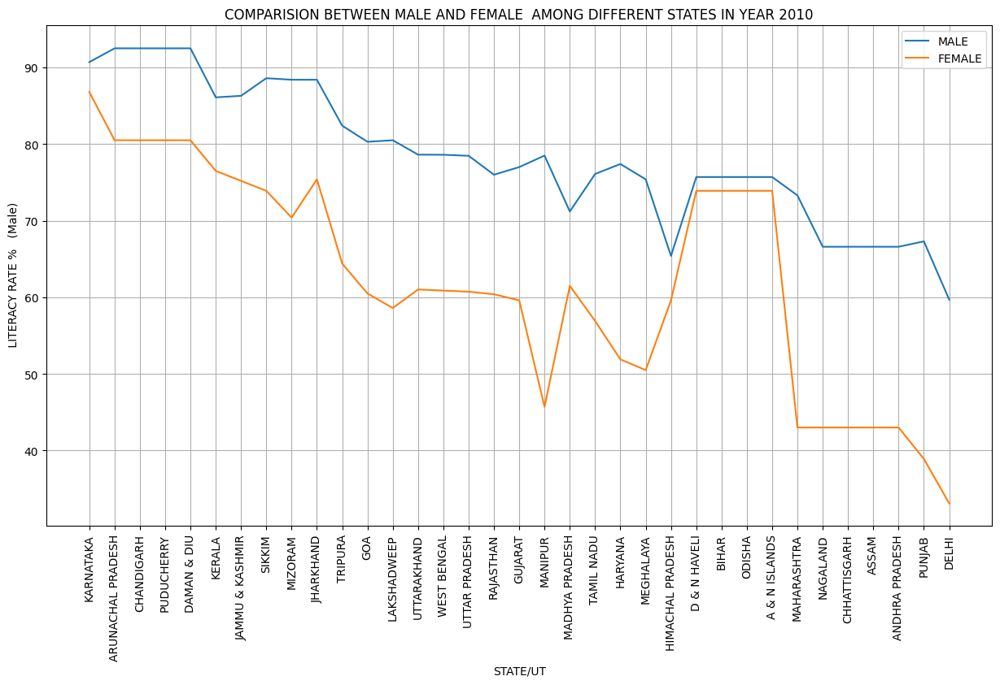

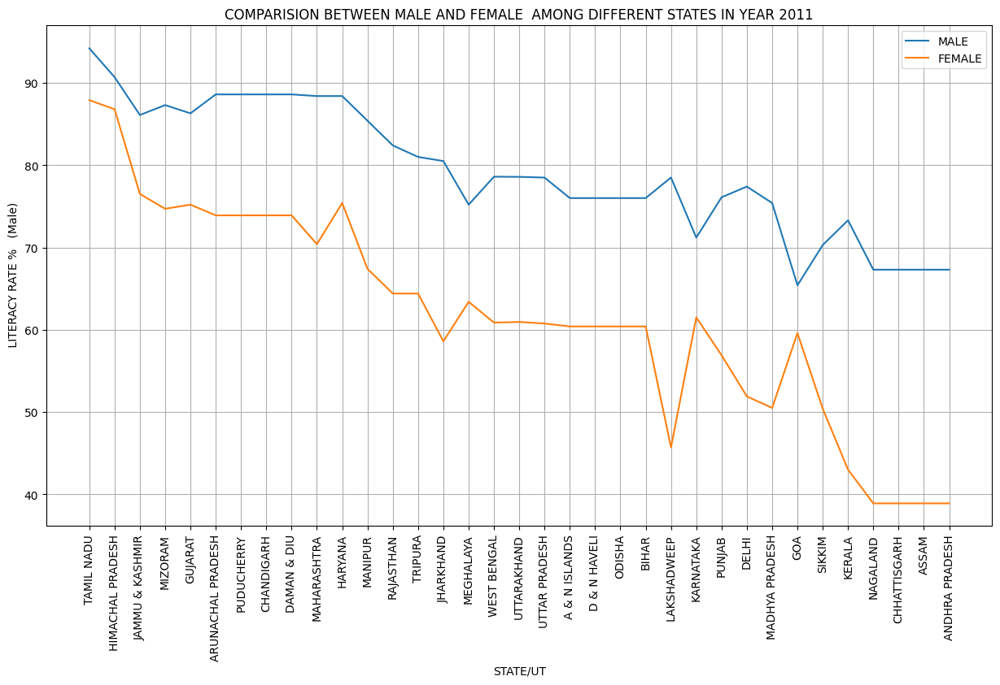

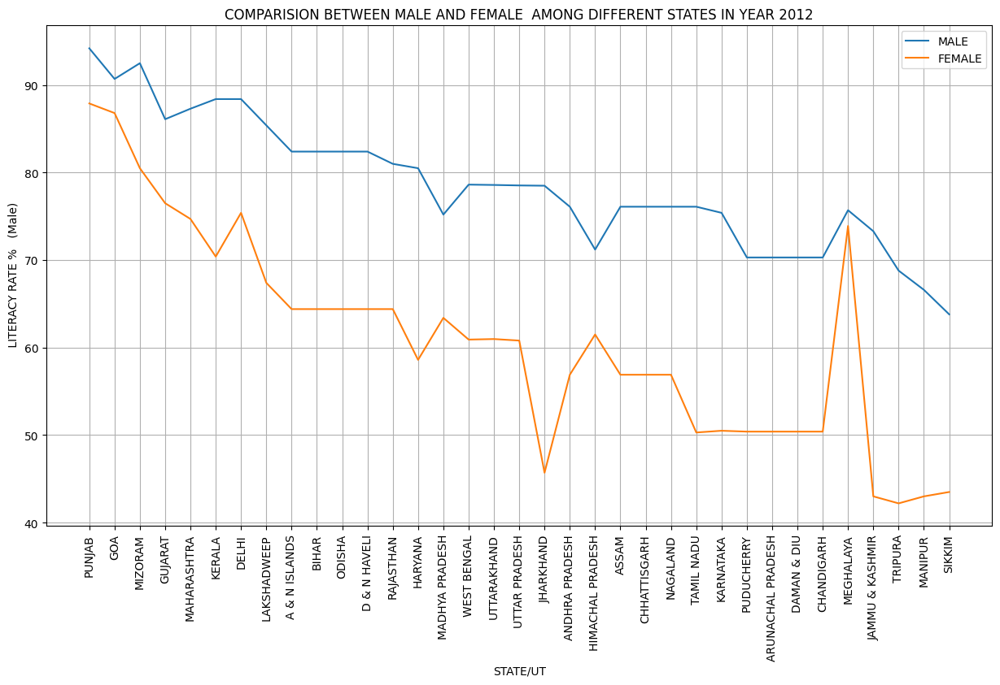

In [45]:
for i in year:
    plt.figure(figsize=(15,8))
    test=df1[df1['Year']==i].sort_values(by=" LITERACY RATE %  Average",ascending=False)
    sns.lineplot(x=test['STATE/UT'],y=test[' LITERACY RATE %   (Male)'],label="MALE")
    sns.lineplot(x=test['STATE/UT'],y=test[' LITERACY RATE % Female'],label="FEMALE")
    plt.xticks(rotation=90)
    plt.title("COMPARISION BETWEEN MALE AND FEMALE  AMONG DIFFERENT STATES IN YEAR {}".format(i))
    plt.grid()
    plt.legend()
    plt.show()

`Note`:
Literacy Rates: A Tale of Two States

Rajasthan: This state shows promising signs of progress towards gender equality in education. Here, male and female literacy rates are approaching parity, indicating a decline in gender bias and a social environment that promotes education for both genders. This suggests Rajasthan has successfully created an infrastructure and social climate that overcomes traditional beliefs hindering women's education. Rajasthan could serve as a potential model for other states aiming to bridge the gender gap in literacy.
Bihar: In contrast, Bihar faces a significant challenge with the largest gender disparity in literacy rates. Social and cultural barriers persist, with some residents prioritizing male education as a future investment, leading to a lack of interest in girls' education. Poverty and limited infrastructure further exacerbate the issue. With scarce resources, allocating funds for girls' education becomes especially difficult, hindering opportunities for their advancement.

In [46]:
# STATEWISE TOTAL CASES REPORTED UNDER IPC FROM 2001 TO 2012 ANALYSIS 
df5 = pd.read_csv(r"C:\Users\pradu\Downloads\crimes.csv")
df5

,STATE/UT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,A & N ISLANDS,2001,13,0,0,3,0,3,2,2,...,50.400000,60.500000,191792.000000,3.828681e+07,3.744073e+07,7.621001e+07,5.540107e+07,2.080894e+07,1.790000,1.370000
1,A & N ISLANDS,2002,17,3,1,2,0,2,2,1,...,43.500000,54.300000,83743.000000,5.739510e+05,5.171660e+05,1.091117e+06,8.700870e+05,2.278810e+05,1.790000,1.370000
2,A & N ISLANDS,2003,21,4,1,2,0,2,2,2,...,54.600000,63.300000,78438.000000,1.378780e+07,1.285061e+07,2.665553e+07,2.321629e+07,3.439240e+06,1.790000,1.370000
3,A & N ISLANDS,2004,15,1,2,10,0,10,3,3,...,33.100000,47.000000,94163.000000,4.315396e+07,3.972483e+07,8.299851e+07,7.431671e+07,8.681800e+06,1.790000,1.370000
4,A & N ISLANDS,2005,14,3,3,4,0,4,2,1,...,51.900000,64.700000,135191.000000,1.045243e+07,1.034353e+07,2.083380e+07,1.664806e+07,4.185747e+06,1.790000,1.370000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,WEST BENGAL,2008,1811,1732,488,2263,0,2263,2332,1907,...,65.279495,74.591521,85455.246627,1.647477e+07,1.536594e+07,3.700765e+07,2.301288e+07,8.877176e+06,1.513925,1.289034
404,WEST BENGAL,2009,2068,2119,931,2336,0,2336,2750,2187,...,65.289312,74.612278,85634.145969,1.651486e+07,1.540339e+07,3.709861e+07,2.306838e+07,8.899343e+06,1.513208,1.288823
405,WEST BENGAL,2010,2398,2111,630,2311,0,2311,3345,2764,...,65.327726,74.642180,85452.138556,1.650941e+07,1.539640e+07,3.709937e+07,2.304703e+07,8.908128e+06,1.512489,1.288612
406,WEST BENGAL,2011,2109,2242,486,2363,0,2363,4285,3711,...,65.332733,74.655017,85543.281773,1.651862e+07,1.540697e+07,3.713246e+07,2.306508e+07,8.909805e+06,1.511768,1.288401


In [47]:
df5.columns

Index(['STATE/UT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
    

In [48]:
ipc=df5[['STATE/UT','YEAR','TOTAL IPC CRIMES',' LITERACY RATE %   (Male)',' LITERACY RATE % Female',' LITERACY RATE %  Average']]

In [49]:
ipc

,STATE/UT,YEAR,TOTAL IPC CRIMES,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average
0,A & N ISLANDS,2001,658,70.300000,50.400000,60.500000
1,A & N ISLANDS,2002,608,63.800000,43.500000,54.300000
2,A & N ISLANDS,2003,644,71.300000,54.600000,63.300000
3,A & N ISLANDS,2004,748,59.700000,33.100000,47.000000
4,A & N ISLANDS,2005,682,77.400000,51.900000,64.700000
...,...,...,...,...,...,...
403,WEST BENGAL,2008,105419,84.224618,65.279495,74.591521
404,WEST BENGAL,2009,113036,84.258448,65.289312,74.612278
405,WEST BENGAL,2010,129616,84.281457,65.327726,74.642180
406,WEST BENGAL,2011,143197,84.305045,65.332733,74.655017


In [50]:
dipc = ipc.groupby(by='STATE/UT').sum().reset_index()[['STATE/UT','TOTAL IPC CRIMES']].sort_values(by='TOTAL IPC CRIMES',ascending=False)

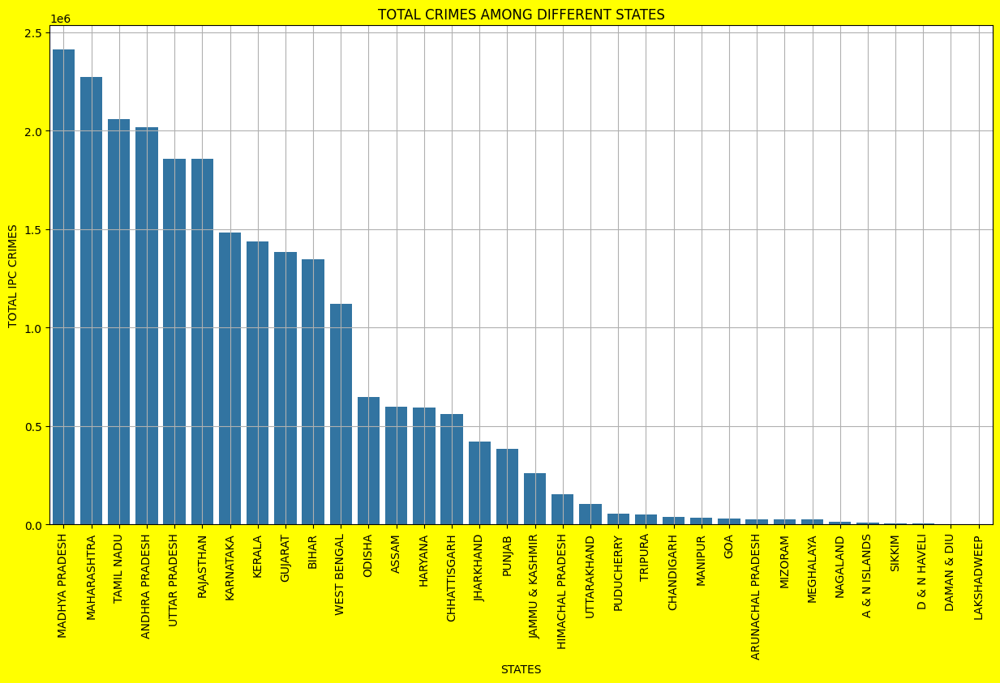

In [51]:
# State wise total ipc crimes over the years 2001 to 2012
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dipc['STATE/UT'],y=dipc['TOTAL IPC CRIMES'])
plt.xlabel("STATES")
plt.xticks(rotation=90)
plt.ylabel("TOTAL IPC CRIMES")
plt.title("TOTAL CRIMES AMONG DIFFERENT STATES")
plt.grid()
plt.show()

`Note`:
States with Highest and Lowest IPC Crimes

Madhya Pradesh, Maharashtra, and Tamil Nadu consistently recorded the highest number of IPC crimes among Indian states.
Lakshadweep stands out for having the fewest recorded IPC crimes throughout the analyzed period.

In [52]:
dipc=ipc.groupby(by='STATE/UT').mean().reset_index()[['STATE/UT','TOTAL IPC CRIMES',' LITERACY RATE %  Average',' LITERACY RATE %   (Male)',' LITERACY RATE % Female']].sort_values(by='TOTAL IPC CRIMES',ascending=False)

In [53]:
dipc

,STATE/UT,TOTAL IPC CRIMES,LITERACY RATE % Average,LITERACY RATE % (Male),LITERACY RATE % Female
18,MADHYA PRADESH,201147.500000,75.285833,85.443333,65.190833
19,MAHARASHTRA,189453.000000,75.331667,84.659167,67.806667
29,TAMIL NADU,171681.333333,76.480833,87.301667,64.105833
1,ANDHRA PRADESH,168248.416667,70.541667,79.050000,65.516667
31,UTTAR PRADESH,154839.500000,83.881667,93.145833,73.090833
27,RAJASTHAN,154659.666667,76.755833,86.588333,68.025833
15,KARNATAKA,123421.916667,73.640833,84.151667,63.345833
16,KERALA,119788.250000,74.986667,83.990833,67.860833
10,GUJARAT,115481.250000,71.594167,80.298333,64.836667
4,BIHAR,112191.083333,70.012500,79.018333,64.429167


In [54]:
dipc_new = dipc.copy()

In [55]:
def cre(x):
    if x>=50.233636 and x<68:
        return 'C'
    elif x>=68 and x<75:
        return 'B'
    else:
        return 'A'

In [56]:
dipc_new[' LITERACY RATE %  Average']=dipc_new[' LITERACY RATE %  Average'].apply(cre)

In [57]:
dipc_new

,STATE/UT,TOTAL IPC CRIMES,LITERACY RATE % Average,LITERACY RATE % (Male),LITERACY RATE % Female
18,MADHYA PRADESH,201147.500000,A,85.443333,65.190833
19,MAHARASHTRA,189453.000000,A,84.659167,67.806667
29,TAMIL NADU,171681.333333,A,87.301667,64.105833
1,ANDHRA PRADESH,168248.416667,B,79.050000,65.516667
31,UTTAR PRADESH,154839.500000,A,93.145833,73.090833
27,RAJASTHAN,154659.666667,A,86.588333,68.025833
15,KARNATAKA,123421.916667,B,84.151667,63.345833
16,KERALA,119788.250000,B,83.990833,67.860833
10,GUJARAT,115481.250000,B,80.298333,64.836667
4,BIHAR,112191.083333,B,79.018333,64.429167


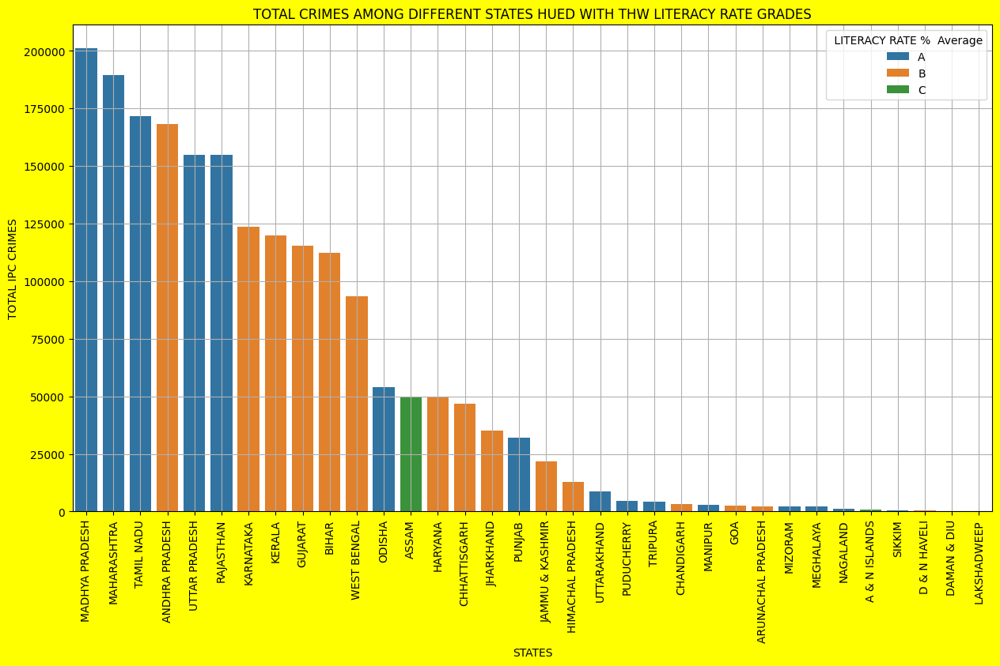

In [58]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dipc_new['STATE/UT'],y=dipc_new['TOTAL IPC CRIMES'],hue=dipc_new[' LITERACY RATE %  Average'])
plt.xlabel("STATES")
plt.xticks(rotation=90)
plt.ylabel("TOTAL IPC CRIMES")
plt.title("TOTAL CRIMES AMONG DIFFERENT STATES HUED WITH THW LITERACY RATE GRADES")
plt.grid()
plt.show()

`Note`:
Literacy and Crime Rates: A Complex Relationship

The data suggests a possible correlation between literacy rates and crime rates. States and UTs with lower literacy rates (categories B and C) tend to have higher numbers of crimes recorded under the IPC.

However, there seems to be an outlier: Tamil Nadu, boasting a high literacy rate (category A), ranks third in total crimes. This highlights the complexity of the relationship between literacy and crime.

On the other hand, several states and UTs with high literacy rates (category A) like Himachal Pradesh, Uttarakhand, Puducherry, Tripura, Chandigarh, and Goa record lower crime rates. This reinforces the potential connection between education and lower crime rates.

In [59]:
dipc_n=pd.DataFrame(pd.crosstab(dipc_new['STATE/UT'],dipc_new[' LITERACY RATE %  Average']).sum(axis=0).reset_index()).rename(columns={0:"TOTAL"})

In [60]:
dipc_n['PERCENTAGE']=dipc_n['TOTAL'].apply(lambda x: (x/dipc_n['TOTAL'].sum())*100)

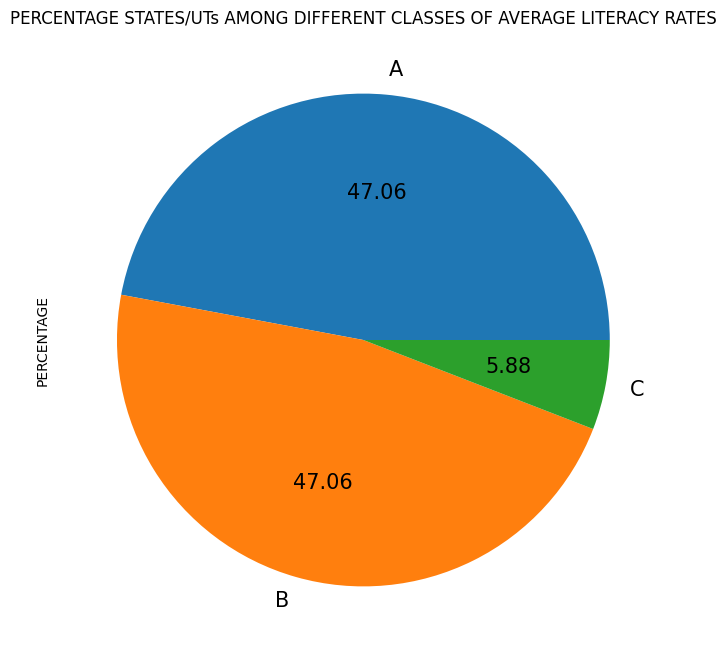

In [61]:
plt.figure(figsize=(8,8))
dipc_n['PERCENTAGE'].plot(kind='pie',labels=dipc_n[' LITERACY RATE %  Average'],autopct="%.2f",fontsize=15)
plt.title("PERCENTAGE STATES/UTs AMONG DIFFERENT CLASSES OF AVERAGE LITERACY RATES")
plt.show()

In [62]:
# Total crimes over the years among different states
dpy=ipc.groupby(by='YEAR').sum().reset_index()[['YEAR','TOTAL IPC CRIMES',' LITERACY RATE %  Average']].sort_values(by='TOTAL IPC CRIMES',ascending=False)

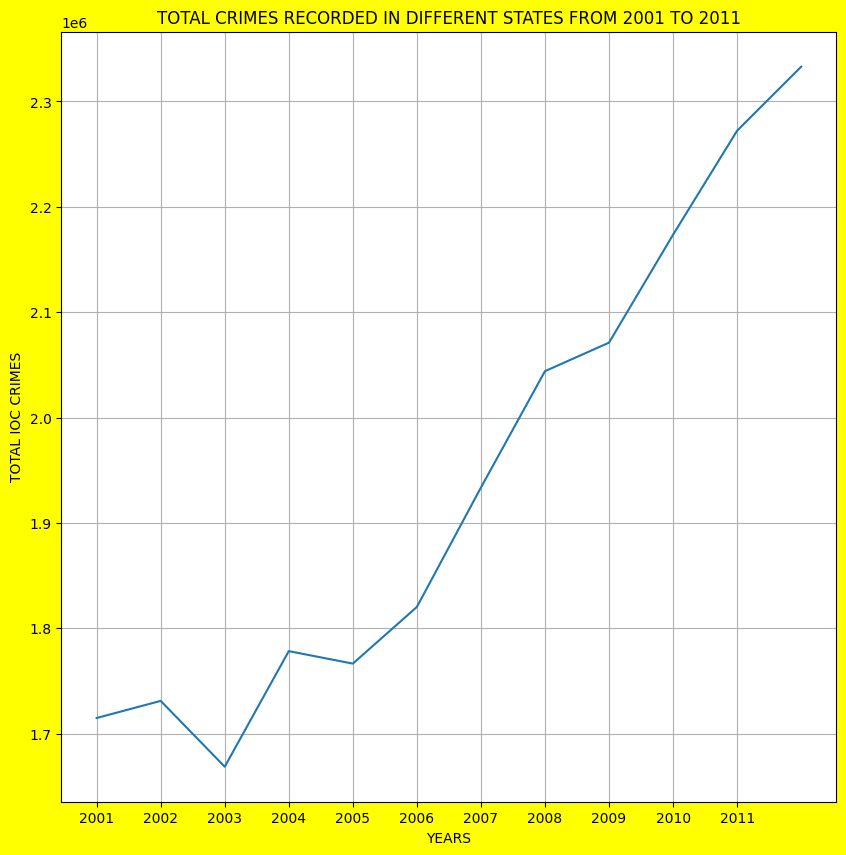

In [63]:
plt.figure(figsize=(10,10),facecolor='Yellow')
sns.lineplot(x=dpy['YEAR'],y=dpy['TOTAL IPC CRIMES'])
plt.xticks([x for x in range(2001,2012)])
plt.xlabel("YEARS")
plt.ylabel("TOTAL IOC CRIMES")
plt.title("TOTAL CRIMES RECORDED IN DIFFERENT STATES FROM 2001 TO 2011")
plt.grid()
plt.show()

`Note`:
Here's a rephrased version focusing on the trends observed in the crime data:

The data shows a noteworthy decrease in total crimes between 2002 and 2003.
However, a sharp rise in crimes is evident from 2006 to 2008, suggesting a significant increase over those years.
Overall, the plot suggests a general upward trend in crime rates over the analyzed period.

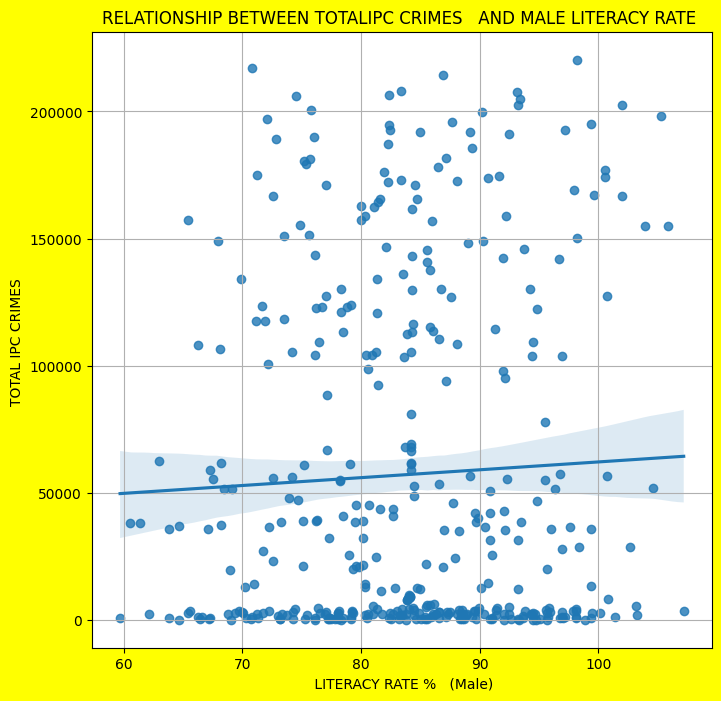

In [64]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df5[' LITERACY RATE %   (Male)'],y=df5['TOTAL IPC CRIMES'])
plt.ylabel("TOTAL IPC CRIMES ")
plt.title("RELATIONSHIP BETWEEN TOTALIPC CRIMES   AND MALE LITERACY RATE ")
plt.grid()
plt.show()

`Note`:
The scatter plot does not reveal a strong correlation between the two variables.

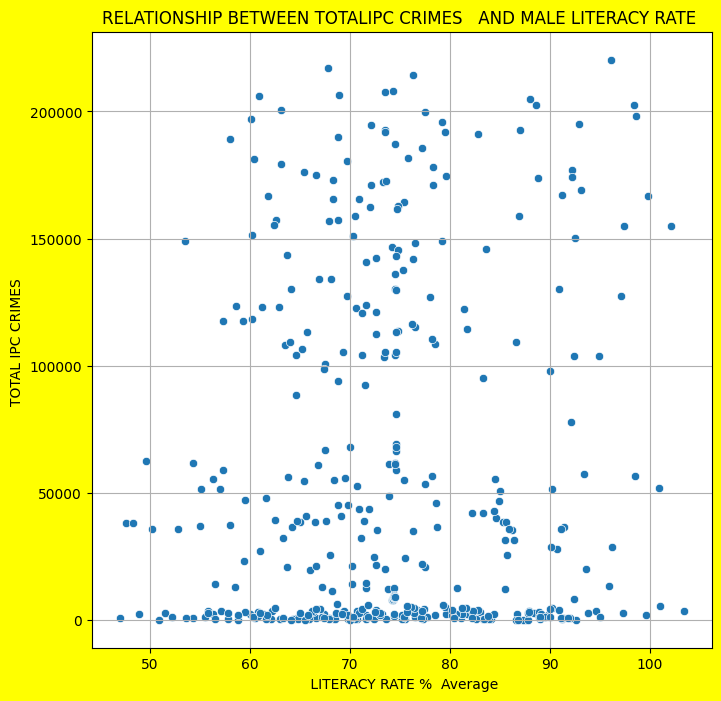

In [65]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.scatterplot(x=df5[' LITERACY RATE %  Average'],y=df5['TOTAL IPC CRIMES'])
plt.ylabel("TOTAL IPC CRIMES ")
plt.title("RELATIONSHIP BETWEEN TOTALIPC CRIMES   AND MALE LITERACY RATE ")
plt.grid()
plt.show()

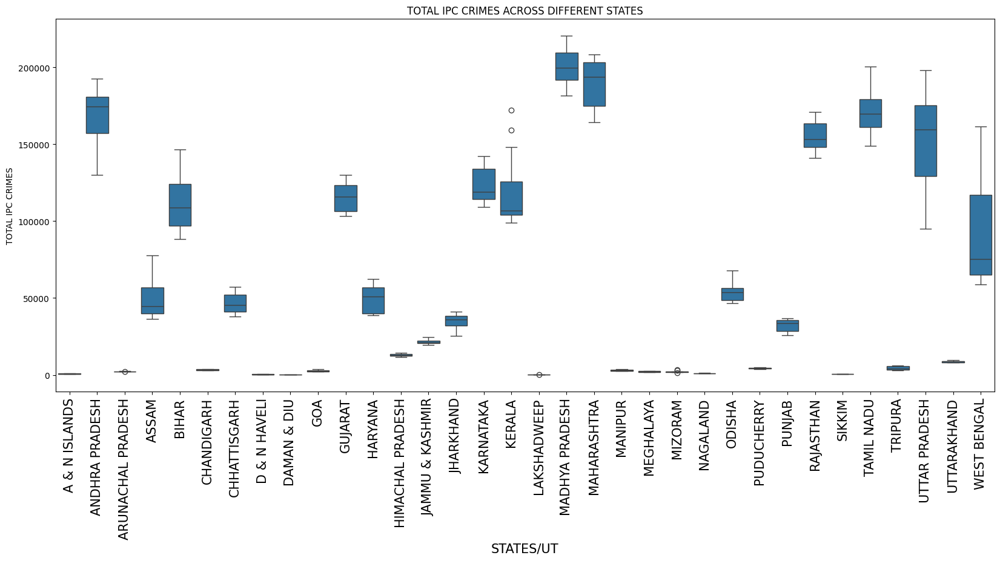

In [66]:
plt.figure(figsize=(20,8))
sns.boxplot(x=df5['STATE/UT'],y=df5['TOTAL IPC CRIMES'])
plt.xlabel("STATES/UT",fontsize=15)
plt.ylabel("TOTAL IPC CRIMES")
plt.xticks(rotation=90,size=15)
plt.title("TOTAL IPC CRIMES ACROSS DIFFERENT STATES")
plt.show()

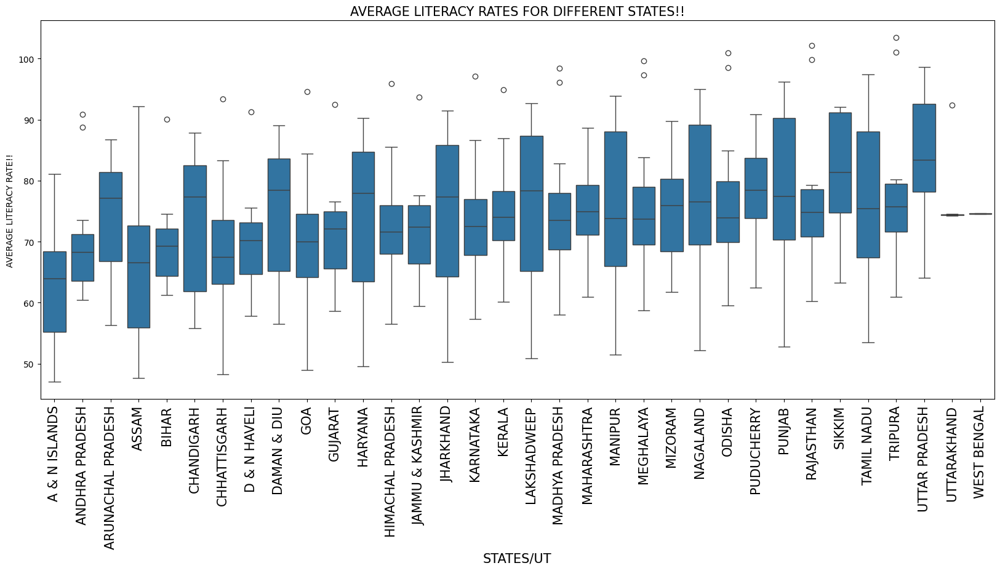

In [67]:
plt.figure(figsize=(20,8))
sns.boxplot(x=df5['STATE/UT'],y=df5[' LITERACY RATE %  Average'])
plt.xlabel("STATES/UT",fontsize=15)
plt.ylabel("AVERAGE LITERACY RATE!!")
plt.xticks(rotation=90,size=15)
plt.title("AVERAGE LITERACY RATES FOR DIFFERENT STATES!!",fontsize=15)
plt.show()

### 2.3) Analysis of year-on-year total crime rate.

In [68]:
df5.columns

Index(['STATE/UT', 'YEAR', 'MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES', 'TOTAL IPC CRIMES',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
    

In [69]:
# Murder
dm=df5.groupby('STATE/UT').sum().reset_index()[['STATE/UT','MURDER','ATTEMPT TO MURDER','CULPABLE HOMICIDE NOT AMOUNTING TO MURDER']].sort_values(by='MURDER',ascending=False)

In [70]:
dm

,STATE/UT,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER
31,UTTAR PRADESH,65443,60520,17266
4,BIHAR,41245,40919,3672
19,MAHARASHTRA,32767,20589,1409
1,ANDHRA PRADESH,31756,22420,1763
18,MADHYA PRADESH,28399,29458,1834
33,WEST BENGAL,21056,14693,6333
29,TAMIL NADU,20127,26597,343
15,KARNATAKA,19937,18512,857
14,JHARKHAND,19060,12270,1231
27,RAJASTHAN,15844,21342,889


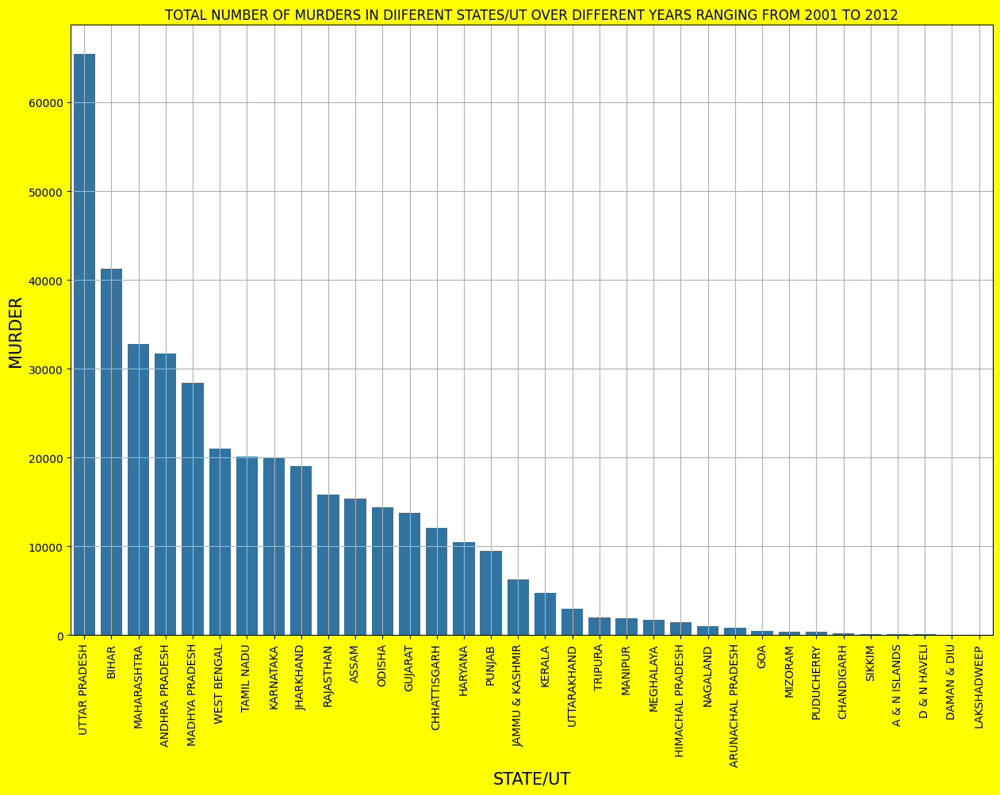

In [71]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dm['STATE/UT'],y=dm['MURDER'])
plt.xlabel("STATE/UT",fontsize=15)
plt.ylabel("MURDER",fontsize=15)
plt.title("TOTAL NUMBER OF MURDERS IN DIIFERENT STATES/UT OVER DIFFERENT YEARS RANGING FROM 2001 TO 2012")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:
High Murder Rates in Uttar Pradesh, Bihar, and Maharashtra

Several factors could be contributing to the high murder rates in Uttar Pradesh, Bihar, and Maharashtra:

Socioeconomic Issues: Rapid urbanization in these states has led to problems like slum growth, unemployment, and poverty. These factors can create a breeding ground for crime, including violent offenses like murder.
Political Instability: Frequent changes in government can lead to a lack of continuity in law enforcement policies and governance. This inconsistency may contribute to a breakdown of law and order in certain areas.
Law Enforcement Challenges: Criticisms regarding under-resourcing, corruption, and inefficiency within the police forces of these states could lead to a lack of deterrence for criminals and a low rate of successful prosecutions for crimes like murder.

In [72]:
dmm=df5.groupby('STATE/UT').mean().reset_index()[['STATE/UT','MURDER','ATTEMPT TO MURDER','CULPABLE HOMICIDE NOT AMOUNTING TO MURDER',' LITERACY RATE %   (Male)',' LITERACY RATE % Female',' LITERACY RATE %  Average']].sort_values(by=' LITERACY RATE %  Average',ascending=False)

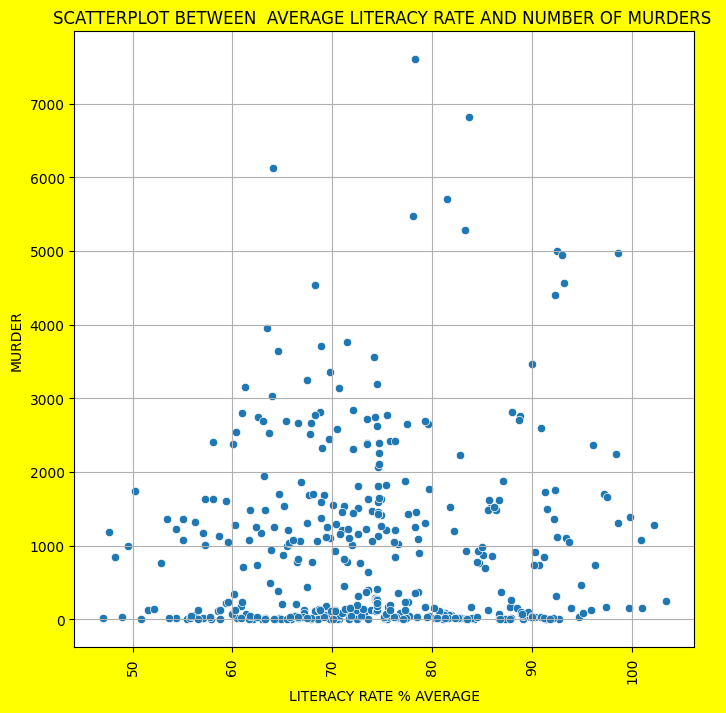

In [73]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.scatterplot(x=df5[' LITERACY RATE %  Average'],y=df5['MURDER'])
plt.xlabel("LITERACY RATE % AVERAGE",fontsize=10)
plt.ylabel("MURDER",fontsize=10)
plt.title("SCATTERPLOT BETWEEN  AVERAGE LITERACY RATE AND NUMBER OF MURDERS ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

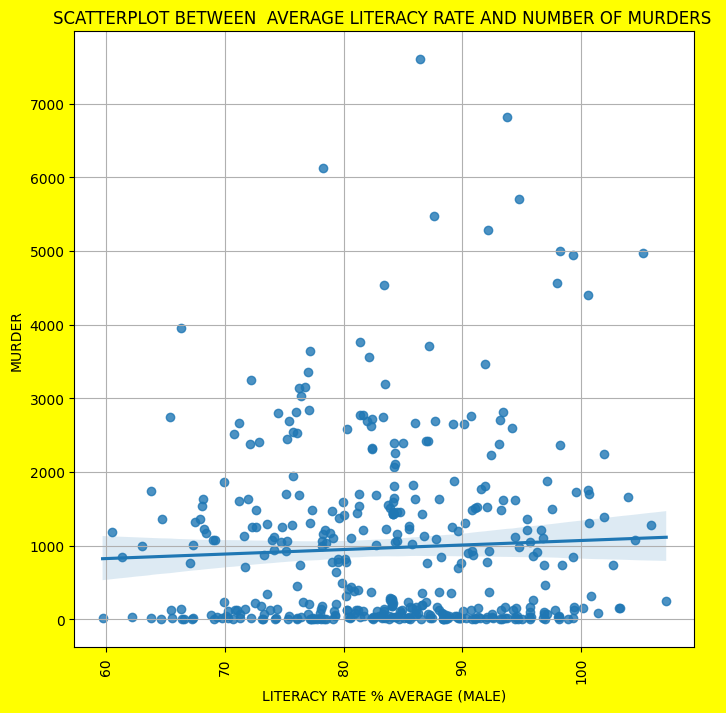

In [74]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df5[' LITERACY RATE %   (Male)'],y=df5['MURDER'])
plt.xlabel("LITERACY RATE % AVERAGE (MALE)",fontsize=10)
plt.ylabel("MURDER",fontsize=10)
plt.title("SCATTERPLOT BETWEEN  AVERAGE LITERACY RATE AND NUMBER OF MURDERS ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:
Literacy Rates and Murder Rates: A Potential Link

The scatter plot suggests a possible negative correlation between literacy rates and murder rates. In other words, states with higher literacy rates appear to have lower murder rates.

However, it's important to consider some key points:

Correlation vs. Causation: This observation doesn't necessarily mean that increased literacy directly causes a decrease in murders. Other factors might be influencing both variables.
Strength of the Relationship: The "slight" negative correlation suggests the link might be weak. More data or analysis might be needed to confirm its strength.


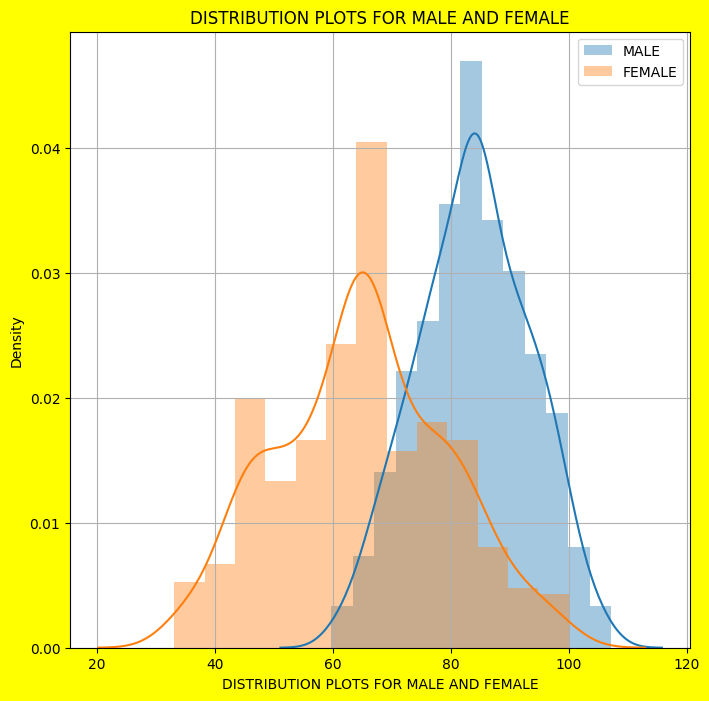

In [75]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.distplot(x=df5[' LITERACY RATE %   (Male)'],label="MALE")
sns.distplot(x=df5[' LITERACY RATE % Female'],label="FEMALE")
plt.xlabel("DISTRIBUTION PLOTS FOR MALE AND FEMALE",fontsize=10)
plt.title("DISTRIBUTION PLOTS FOR MALE AND FEMALE")
plt.legend()
plt.grid()
plt.show()

`Note`:
The data reveals a gender gap in literacy rates, with males generally showing higher literacy rates compared to females.

In [76]:
# Rape
dmr=df5.groupby('STATE/UT').sum().reset_index()[['STATE/UT','RAPE','CUSTODIAL RAPE','OTHER RAPE']].sort_values(by='RAPE',ascending=False)

In [77]:
dmr

,STATE/UT,RAPE,CUSTODIAL RAPE,OTHER RAPE
18,MADHYA PRADESH,36087,1,36086
33,WEST BENGAL,20787,0,20787
31,UTTAR PRADESH,19058,2,19056
19,MAHARASHTRA,17986,2,17984
3,ASSAM,16178,5,16173
27,RAJASTHAN,15798,0,15798
1,ANDHRA PRADESH,13479,2,13477
4,BIHAR,13124,2,13122
6,CHHATTISGARH,11838,0,11838
24,ODISHA,11430,0,11430


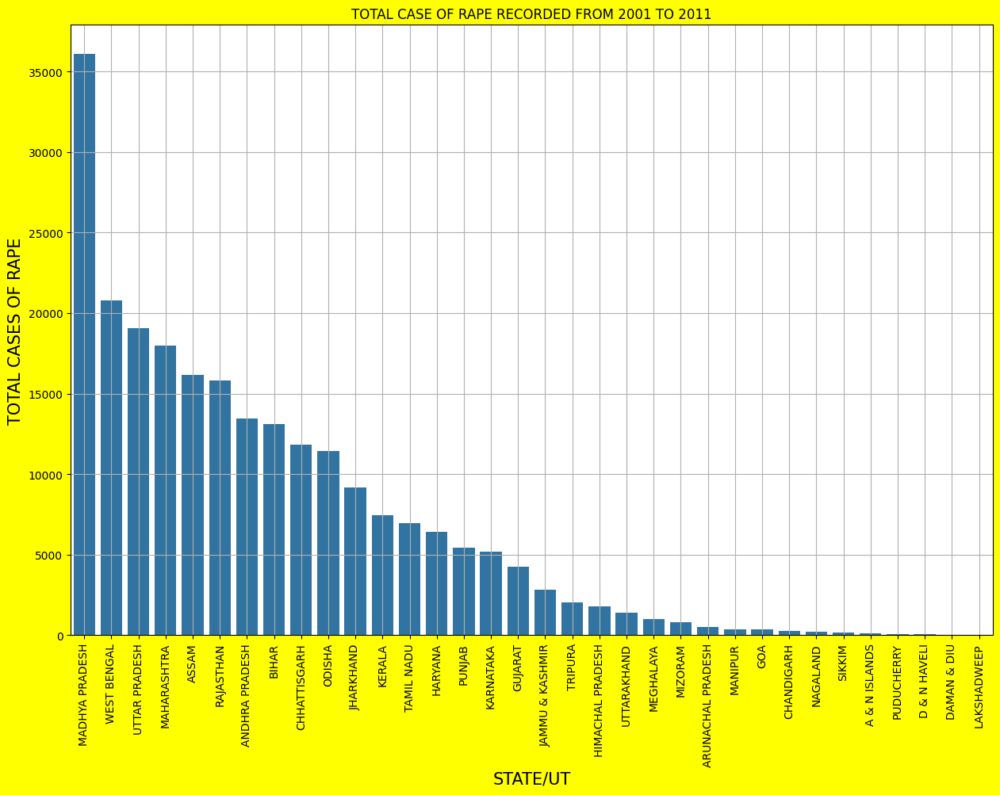

In [78]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dmr['STATE/UT'],y=dmr['RAPE'])
plt.xlabel("STATE/UT",fontsize=15)
plt.ylabel("TOTAL CASES OF RAPE",fontsize=15)
plt.title("TOTAL CASE OF RAPE RECORDED FROM 2001 TO 2011")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:
Possible Explanations for High Rape Cases in Madhya Pradesh (2001-2011)

Several factors might be contributing to the concerning number of reported rape cases in Madhya Pradesh from 2001 to 2011:

Inadequate Law Enforcement: Weak law enforcement infrastructure, including a lack of resources or sensitivity towards victims, could create an environment where perpetrators feel emboldened and crimes go unpunished.
Gender Inequality: A significant gender gap in Madhya Pradesh, where women face discrimination and violence, may make them more vulnerable to sexual assault.
Social and Cultural Influences: Deeply entrenched patriarchal norms, coupled with a lack of sex education and the stigmatization of victims, could create a breeding ground for sexual violence.
Economic Hardship: Poverty and limited economic opportunities may contribute to a rise in sexual violence, driven by desperation or frustration.

In [79]:
dym=df5.groupby('YEAR').sum().reset_index()[['YEAR','RAPE','CUSTODIAL RAPE','OTHER RAPE']].sort_values(by='RAPE',ascending=False)

In [80]:
dym

,YEAR,RAPE,CUSTODIAL RAPE,OTHER RAPE
11,2012,24217,1,24216
10,2011,23634,1,23633
9,2010,21665,6,21659
7,2008,21001,0,21001
8,2009,20928,2,20926
6,2007,20139,1,20138
5,2006,18725,2,18723
4,2005,17701,7,17694
3,2004,17682,2,17680
1,2002,15970,3,15967


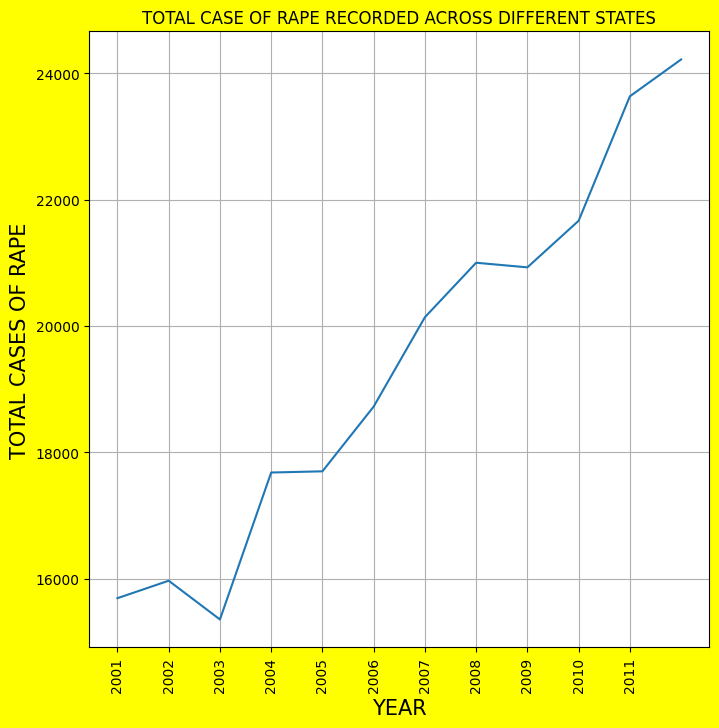

In [81]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.lineplot(x=dym['YEAR'],y=dym['RAPE'])
plt.xlabel("YEAR",fontsize=15)
plt.xticks([x for x in range(2001,2012)])
plt.ylabel("TOTAL CASES OF RAPE",fontsize=15)
plt.title("TOTAL CASE OF RAPE RECORDED ACROSS DIFFERENT STATES")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:
The data shows a general upward trend in the total number of cases from 2001 to 2011, with a brief decrease observed between 2002 and 2003.

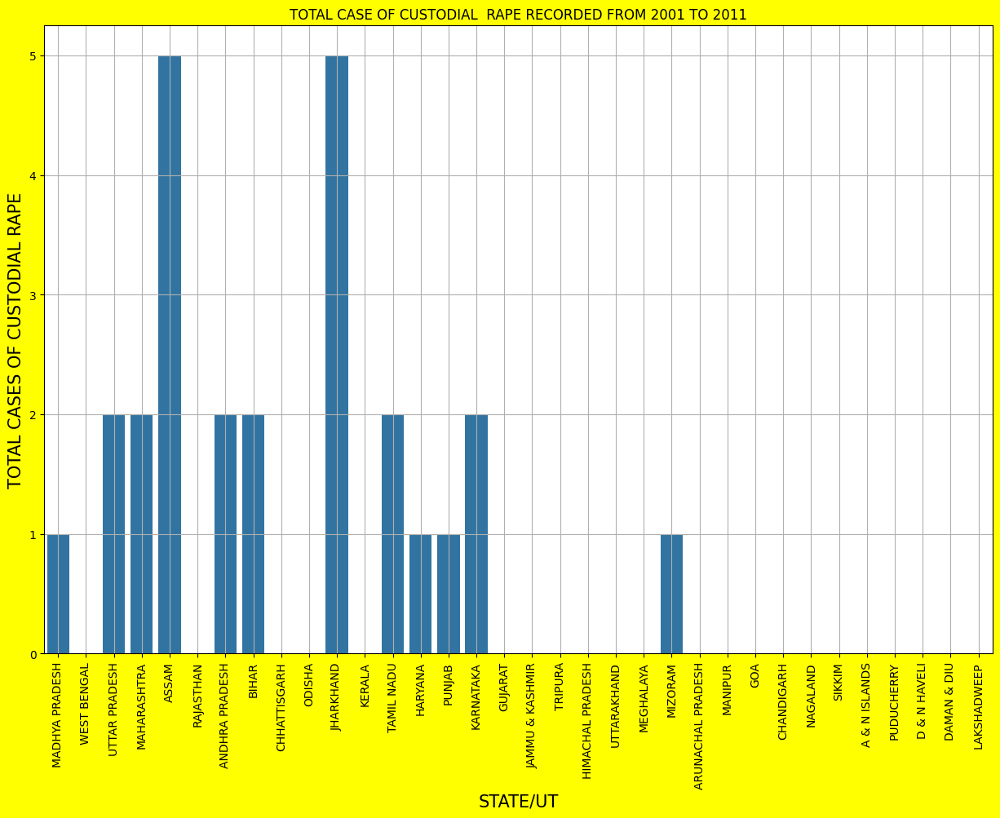

In [82]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dmr['STATE/UT'],y=dmr['CUSTODIAL RAPE'])
plt.xlabel("STATE/UT",fontsize=15)
plt.ylabel("TOTAL CASES OF CUSTODIAL RAPE",fontsize=15)
plt.title("TOTAL CASE OF CUSTODIAL  RAPE RECORDED FROM 2001 TO 2011")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:

`ASSAM AND JHARKHAND RECORDS MAXIMUM NUMBER OF CUSTODIAL RAPES CASES.`

In Assam, several cases of custodial rape have been reported in recent years. For example, in 2020, a police officer was arrested for allegedly raping a woman in custody in Dibrugarh district. Similarly, in 2018, a woman was allegedly raped by a police officer while in custody in Nagaon district. These incidents highlight the need for better monitoring and accountability of law enforcement officials to prevent such cases from happening.
In Jharkhand, custodial rape has also been reported. In 2019, a woman was allegedly raped by a police officer while in custody in Khunti district. In another incident in 2018, a minor girl was allegedly raped by a police officer in Dumka district. Such incidents not only violate the rights of the victim but also erode public trust in law enforcement agencies.

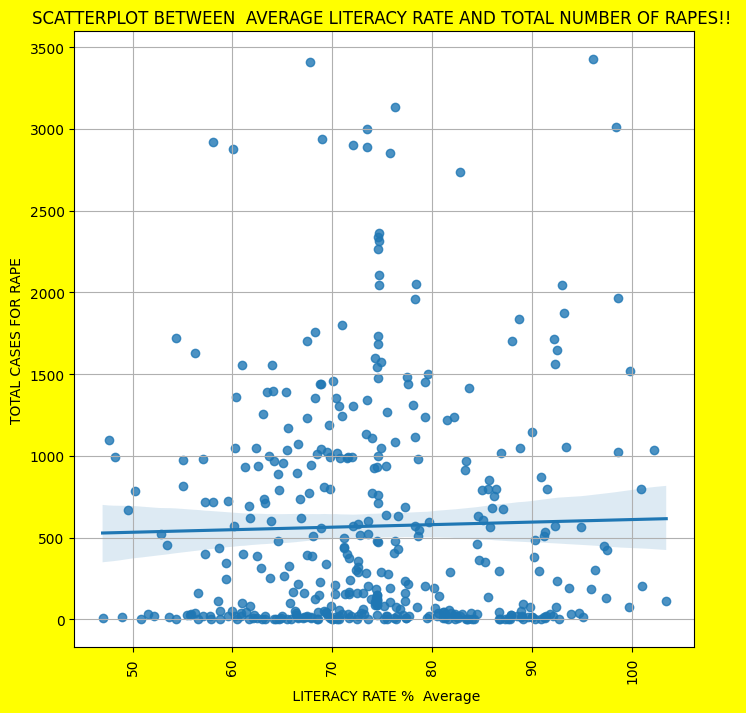

In [83]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df5[' LITERACY RATE %  Average'],y=df5['RAPE'])
plt.xlabel(" LITERACY RATE %  Average",fontsize=10)
plt.ylabel("TOTAL CASES FOR RAPE",fontsize=10)
plt.title("SCATTERPLOT BETWEEN  AVERAGE LITERACY RATE AND TOTAL NUMBER OF RAPES!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

`Note`:
Higher literacy rates are associated with a decrease in reported rape cases. This suggests that education plays a crucial role in reducing sexual violence. Here's how:

Knowledge is power: Literacy equips people with a better understanding of laws and rights, especially those concerning sexual assault. This empowers individuals to identify and report such crimes, and navigate the legal system effectively.
Empowering women: Education fosters assertiveness and confidence in women, allowing them to navigate interactions with more self-assurance. This can help prevent situations that might lead to harassment or assault.
Shifting societal norms: Literacy promotes progressive attitudes towards women's rights and gender equality. As societies become more educated, the tolerance for gender-based violence, including rape, tends to decrease.

In [84]:
# Kidnapping and abduction
dmkw=df5.groupby('STATE/UT').mean().reset_index()[['STATE/UT','KIDNAPPING & ABDUCTION','KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS','KIDNAPPING AND ABDUCTION OF OTHERS',' LITERACY RATE %  Average']].sort_values(by='KIDNAPPING & ABDUCTION',ascending=False)

In [85]:
dmkw

,STATE/UT,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,KIDNAPPING AND ABDUCTION OF OTHERS,LITERACY RATE % Average
31,UTTAR PRADESH,4938.833333,3965.833333,973.000000,83.881667
4,BIHAR,3101.666667,1615.750000,1485.916667,70.012500
27,RAJASTHAN,2560.583333,2055.916667,504.666667,76.755833
3,ASSAM,2328.250000,1910.000000,418.250000,66.853333
33,WEST BENGAL,2166.583333,1814.416667,352.166667,74.605135
1,ANDHRA PRADESH,1769.916667,1244.666667,525.250000,70.541667
29,TAMIL NADU,1275.250000,1036.333333,238.916667,76.480833
10,GUJARAT,1270.500000,1076.500000,194.000000,71.594167
19,MAHARASHTRA,1258.416667,904.416667,354.000000,75.331667
18,MADHYA PRADESH,996.500000,770.250000,226.250000,75.285833


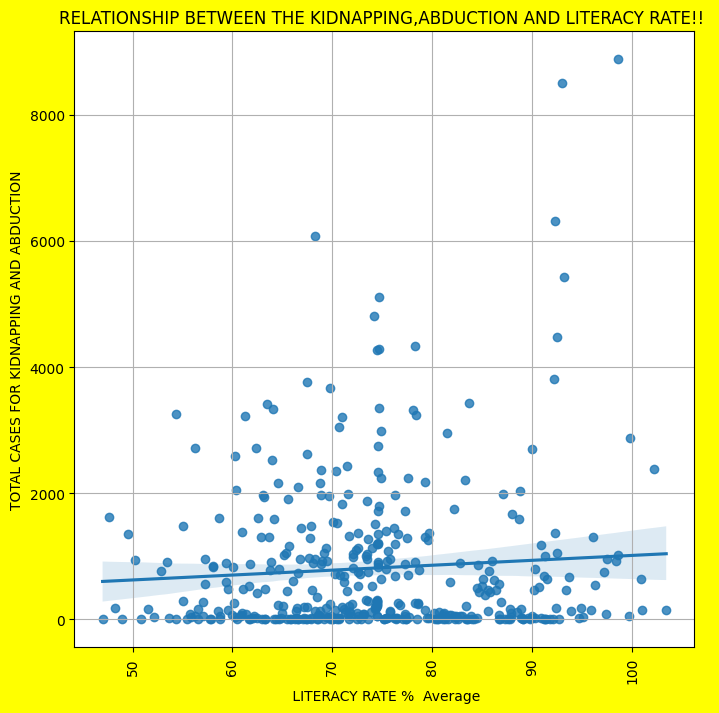

In [86]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df5[' LITERACY RATE %  Average'],y=df5['KIDNAPPING & ABDUCTION'])
plt.xlabel(" LITERACY RATE %  Average",fontsize=10)
plt.ylabel("TOTAL CASES FOR KIDNAPPING AND ABDUCTION",fontsize=10)
plt.title("RELATIONSHIP BETWEEN THE KIDNAPPING,ABDUCTION AND LITERACY RATE!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [87]:
# theft, Burgulary, Dacoity
dyd=df5.groupby('STATE/UT').sum().reset_index()[['STATE/UT','DACOITY','PREPARATION AND ASSEMBLY FOR DACOITY','ROBBERY', 'BURGLARY','THEFT','AUTO THEFT','OTHER THEFT']]

In [88]:
dyd.sort_values(by='ROBBERY',inplace=True,ascending=True)

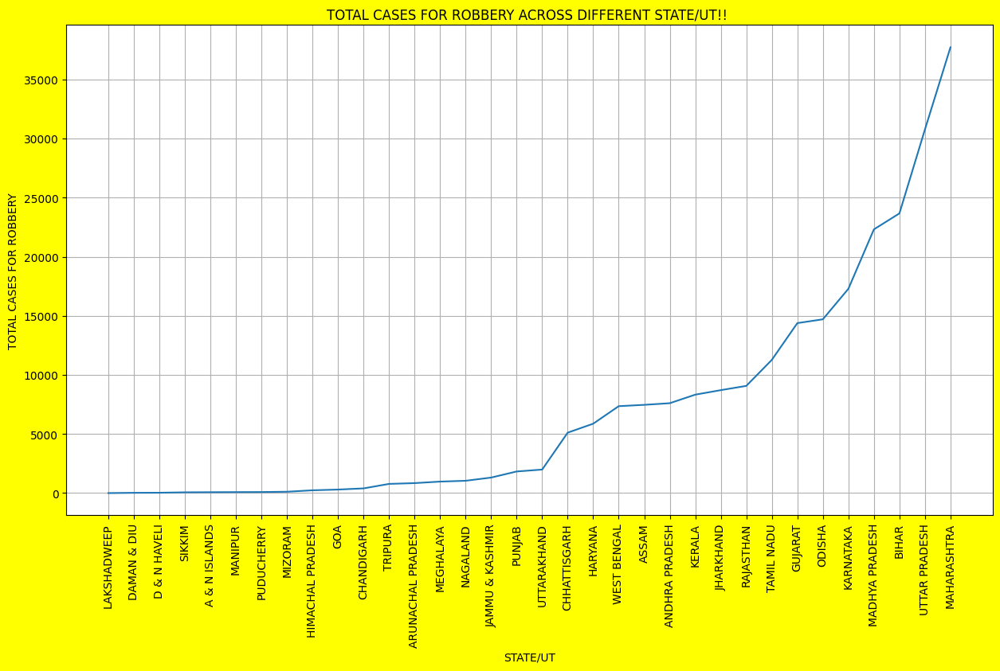

In [89]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dyd['STATE/UT'],y=dyd['ROBBERY'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR ROBBERY",fontsize=10)
plt.title("TOTAL CASES FOR ROBBERY ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [90]:
dyd.sort_values(by='THEFT',inplace=True,ascending=True)

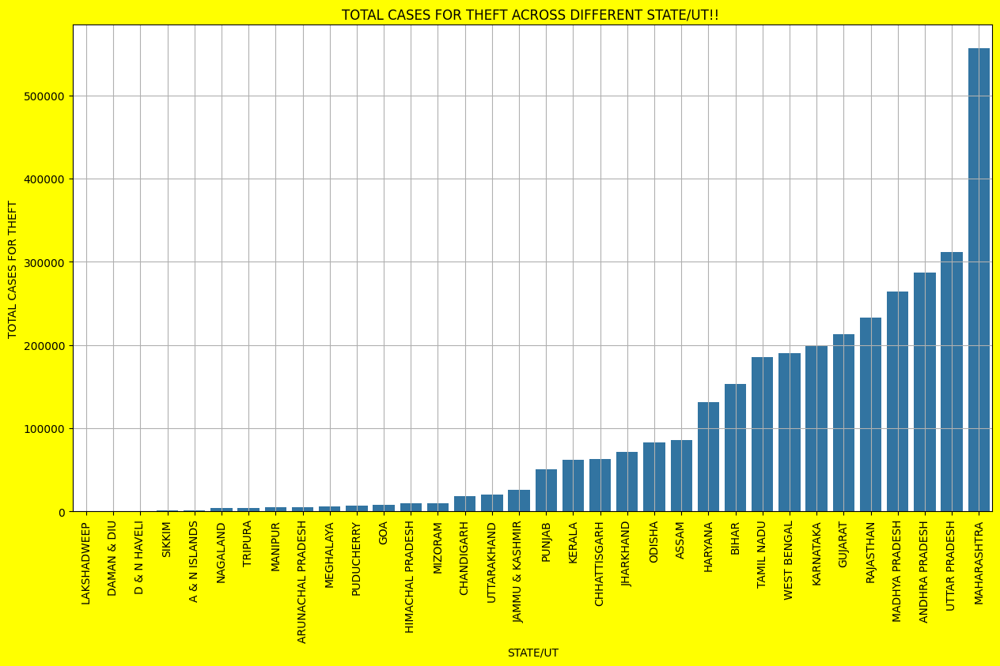

In [91]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dyd['STATE/UT'],y=dyd['THEFT'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR THEFT",fontsize=10)
plt.title("TOTAL CASES FOR THEFT ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [92]:
dyd.sort_values(by='DACOITY',inplace=True,ascending=False)

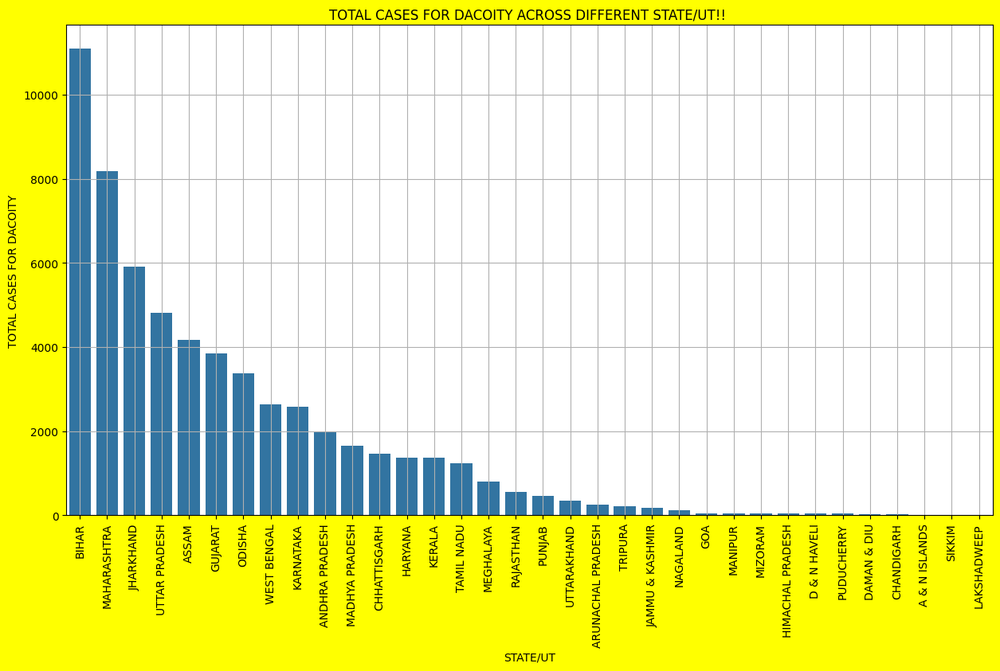

In [93]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dyd['STATE/UT'],y=dyd['DACOITY'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR DACOITY",fontsize=10)
plt.title("TOTAL CASES FOR DACOITY ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [94]:
df5['TOTAL THEFT/ROBBERY/BURGULARY CASES']=df5[['DACOITY','PREPARATION AND ASSEMBLY FOR DACOITY','ROBBERY', 'BURGLARY','THEFT','AUTO THEFT','OTHER THEFT']].sum(axis=1)

In [95]:
df6=df5.groupby('YEAR').sum().reset_index()[['YEAR','DACOITY','PREPARATION AND ASSEMBLY FOR DACOITY','ROBBERY', 'BURGLARY','THEFT','AUTO THEFT','OTHER THEFT']].sort_values(by='DACOITY',ascending=False)

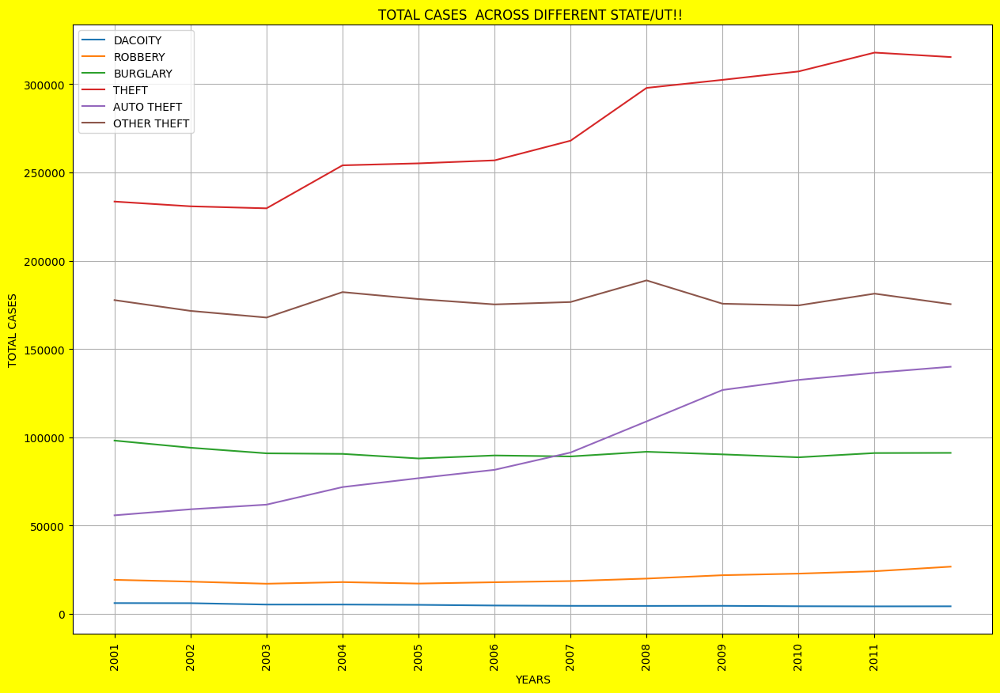

In [96]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.lineplot(x=df6['YEAR'],y=df6['DACOITY'],label="DACOITY")
sns.lineplot(x=df6['YEAR'],y=df6['ROBBERY'],label="ROBBERY")
sns.lineplot(x=df6['YEAR'],y=df6['BURGLARY'],label="BURGLARY")
sns.lineplot(x=df6['YEAR'],y=df6['THEFT'],label="THEFT")
sns.lineplot(x=df6['YEAR'],y=df6['AUTO THEFT'],label="AUTO THEFT")
sns.lineplot(x=df6['YEAR'],y=df6['OTHER THEFT'],label="OTHER THEFT")
plt.xlabel("YEARS",fontsize=10)
plt.xticks([x for x in range(2001,2012)])
plt.ylabel("TOTAL CASES",fontsize=10)
plt.title("TOTAL CASES  ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.legend()
plt.grid()
plt.show()

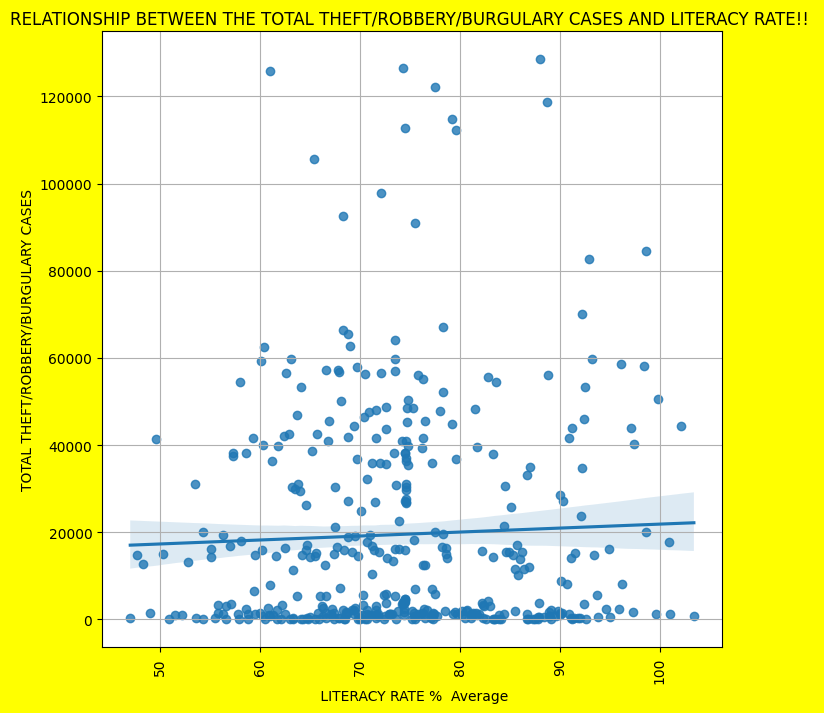

In [97]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.regplot(x=df5[' LITERACY RATE %  Average'],y=df5['TOTAL THEFT/ROBBERY/BURGULARY CASES'])
plt.xlabel(" LITERACY RATE %  Average",fontsize=10)
plt.ylabel("TOTAL THEFT/ROBBERY/BURGULARY CASES",fontsize=10)
plt.title("RELATIONSHIP BETWEEN THE TOTAL THEFT/ROBBERY/BURGULARY CASES AND LITERACY RATE!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [98]:
# RIOTS, CRIMINAL BREACH OF TRUST, ARSON
drca=df5.groupby('STATE/UT').sum().reset_index()[['STATE/UT','RIOTS','CRIMINAL BREACH OF TRUST','ARSON']].sort_values(by='RIOTS',ascending=False)

In [99]:
drca

,STATE/UT,RIOTS,CRIMINAL BREACH OF TRUST,ARSON
4,BIHAR,105096,15528,8509
16,KERALA,96274,4271,5580
19,MAHARASHTRA,90244,20766,14515
15,KARNATAKA,78421,5392,3711
31,UTTAR PRADESH,54110,38352,4554
33,WEST BENGAL,51154,8919,2364
29,TAMIL NADU,37368,3040,8149
27,RAJASTHAN,36073,9674,8312
3,ASSAM,34963,8402,7918
18,MADHYA PRADESH,31124,6533,10354


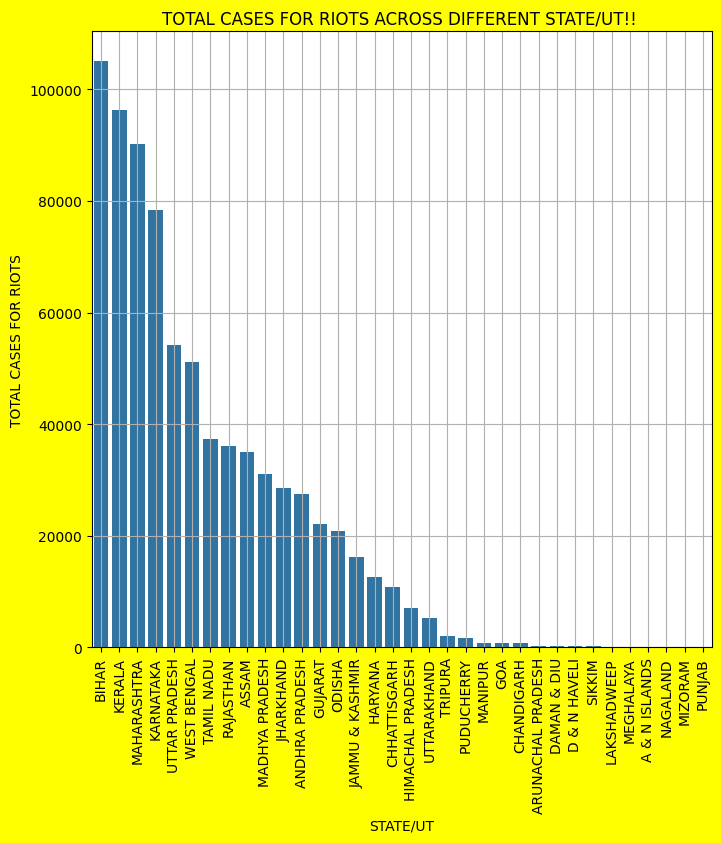

In [100]:
plt.figure(figsize=(8,8),facecolor='Yellow')
sns.barplot(x=drca['STATE/UT'],y=drca['RIOTS'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR RIOTS",fontsize=10)
plt.title("TOTAL CASES FOR RIOTS ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [101]:
drca.sort_values(by='ARSON',ascending=False,inplace=True)

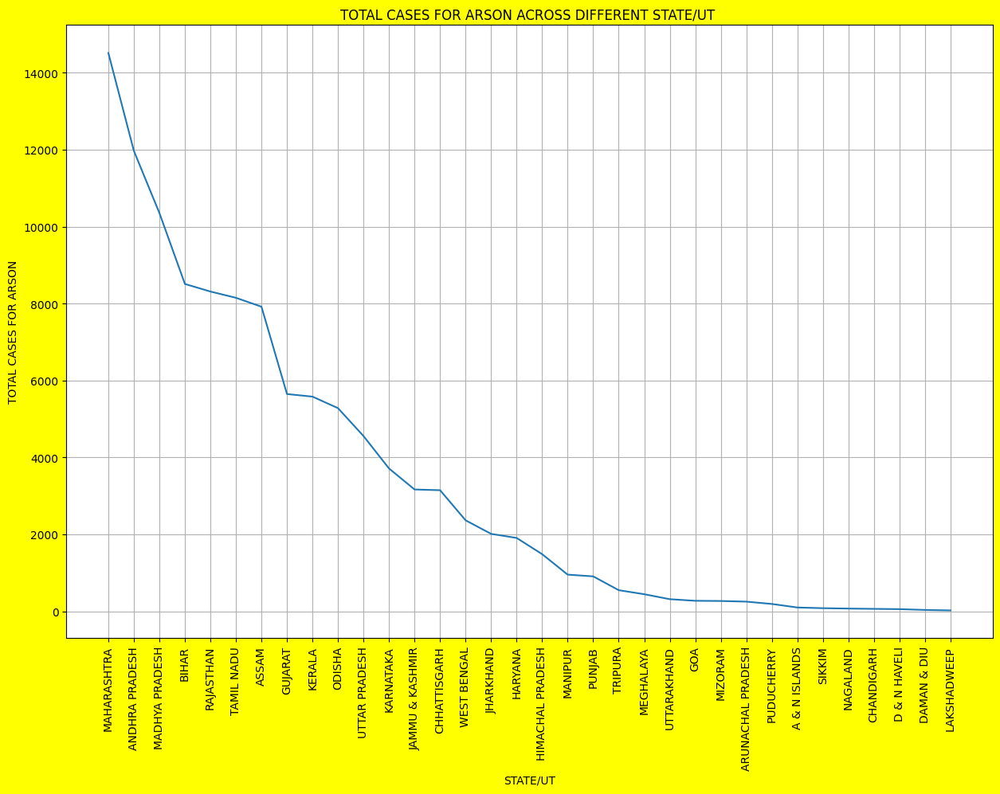

In [102]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.lineplot(x=drca['STATE/UT'],y=drca['ARSON'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR ARSON",fontsize=10)
plt.title("TOTAL CASES FOR ARSON ACROSS DIFFERENT STATE/UT ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

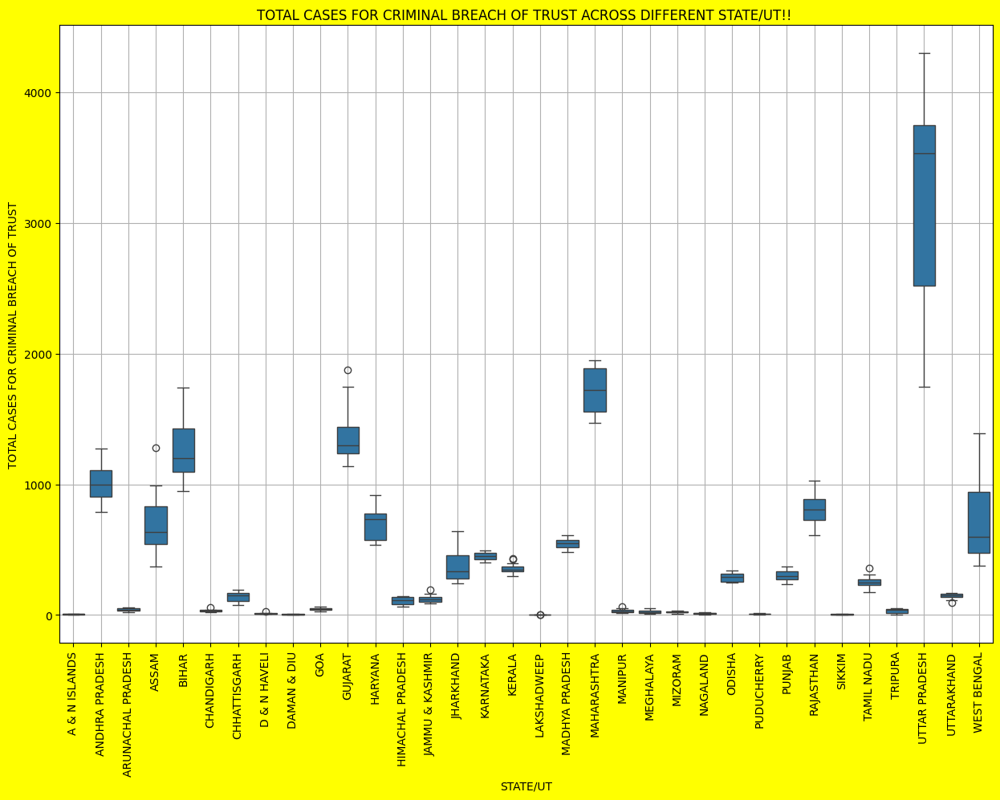

In [103]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.boxplot(x=df5['STATE/UT'],y=df5['CRIMINAL BREACH OF TRUST'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR CRIMINAL BREACH OF TRUST",fontsize=10)
plt.title("TOTAL CASES FOR CRIMINAL BREACH OF TRUST ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [104]:
dmdo=df5.groupby('YEAR').sum().reset_index()[['YEAR','RIOTS','CRIMINAL BREACH OF TRUST','ARSON']].sort_values(by='RIOTS',ascending=False)
dmdo

,YEAR,RIOTS,CRIMINAL BREACH OF TRUST,ARSON
0,2001,76057,14319,10484
11,2012,74554,17560,11757
1,2002,68806,13583,11763
10,2011,68450,17120,9022
9,2010,67518,16405,8456
7,2008,65947,16132,9208
8,2009,62885,15993,8702
3,2004,59904,13731,8599
6,2007,59828,15080,8993
2,2003,57254,13001,9305


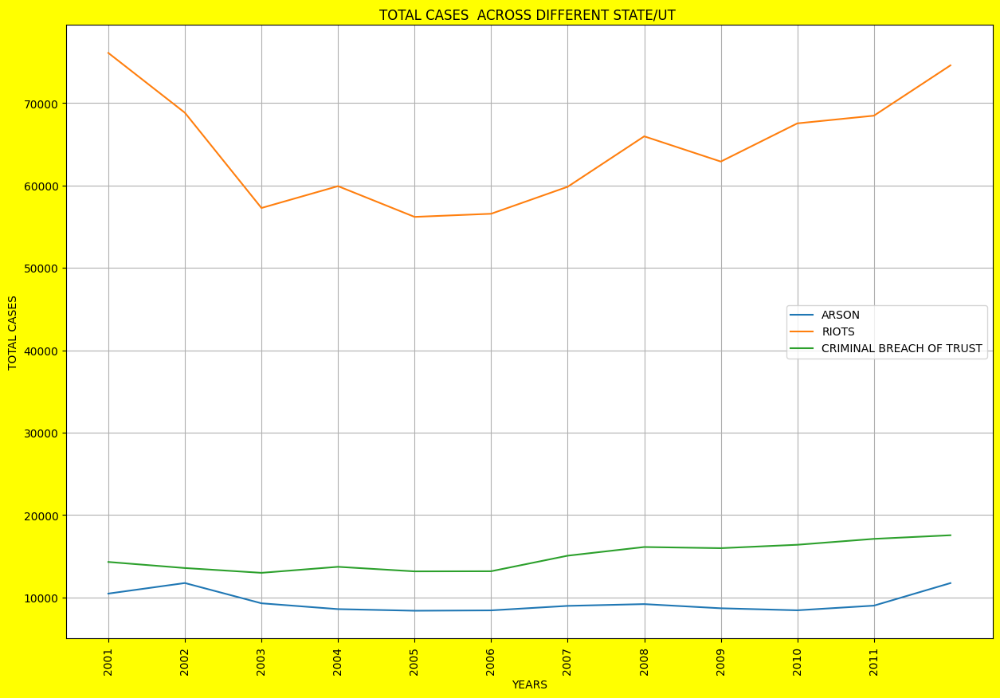

In [105]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.lineplot(x=dmdo['YEAR'],y=dmdo['ARSON'],label="ARSON")
sns.lineplot(x=dmdo['YEAR'],y=dmdo['RIOTS'],label="RIOTS")
sns.lineplot(x=dmdo['YEAR'],y=dmdo['CRIMINAL BREACH OF TRUST'],label="CRIMINAL BREACH OF TRUST")
plt.xlabel("YEARS",fontsize=10)
plt.xticks([x for x in range(2001,2012)])
plt.ylabel("TOTAL CASES",fontsize=10)
plt.title("TOTAL CASES  ACROSS DIFFERENT STATE/UT ")
plt.xticks(rotation=90)
plt.legend()
plt.grid()
plt.show()

In [106]:
# DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES
dwd=df5.groupby('STATE/UT').sum().reset_index()[['STATE/UT','DOWRY DEATHS','ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN','CRUELTY BY HUSBAND OR HIS RELATIVES']].sort_values(by='DOWRY DEATHS',ascending=False)

In [107]:
try:
    dmk = dmk.apply(pd.to_numeric, errors='coerce')  # Attempt numeric conversion
except:
    # Handle conversion errors (e.g., invalid strings)
    pass
dmk['TOTAL KIDNAPPINGS'] = dmk.sum(axis=1).astype(str)


NameError: name 'dmk' is not defined

In [ ]:
df5['AGAINST WOMEN']=df5[['DOWRY DEATHS','ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY','INSULT TO MODESTY OF WOMEN','CRUELTY BY HUSBAND OR HIS RELATIVES']].sum(axis=1)

In [ ]:
dwd

,STATE/UT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES
31,UTTAR PRADESH,23824,29698,26511,77617
4,BIHAR,13548,7576,226,25680
18,MADHYA PRADESH,9036,79878,9317,39969
1,ANDHRA PRADESH,6215,51999,36131,119007
33,WEST BENGAL,5172,22871,1554,130668
27,RAJASTHAN,5066,30853,354,100101
24,ODISHA,4555,29946,2939,18697
19,MAHARASHTRA,4249,39219,12110,80363
14,JHARKHAND,3291,3985,247,8409
11,HARYANA,3130,5323,8188,27112


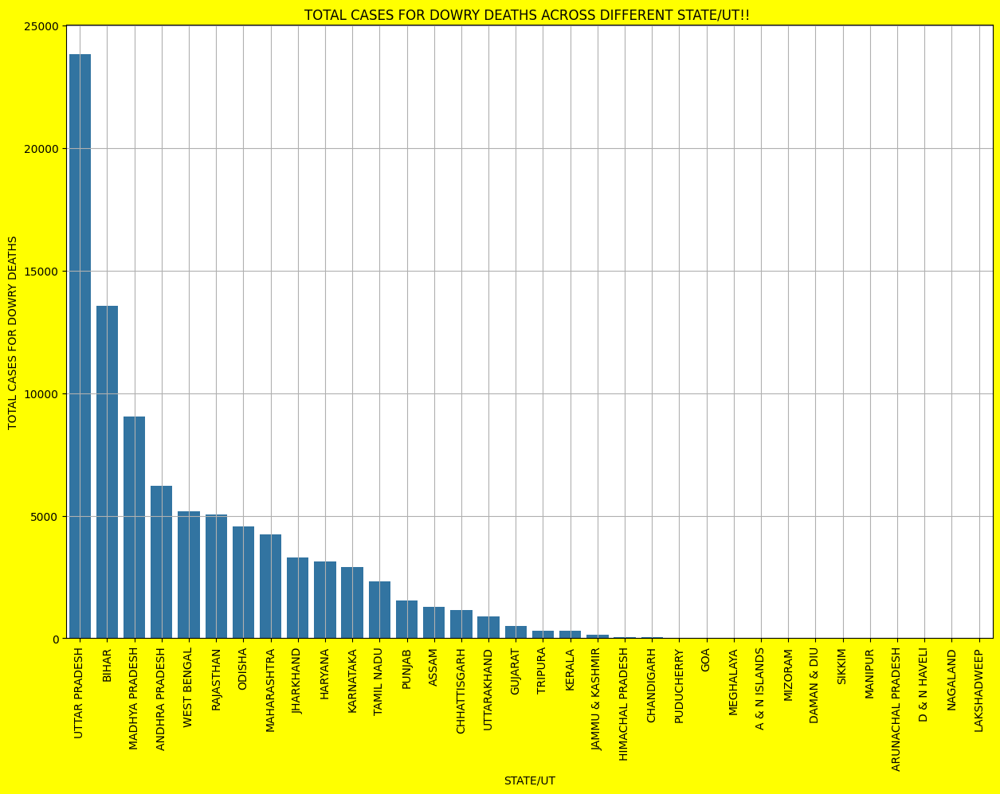

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dwd['STATE/UT'],y=dwd['DOWRY DEATHS'],)
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("TOTAL CASES FOR DOWRY DEATHS",fontsize=10)
plt.title("TOTAL CASES FOR DOWRY DEATHS ACROSS DIFFERENT STATE/UT!! ")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
dwd.sort_values(by='ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',ascending=False,inplace=True)

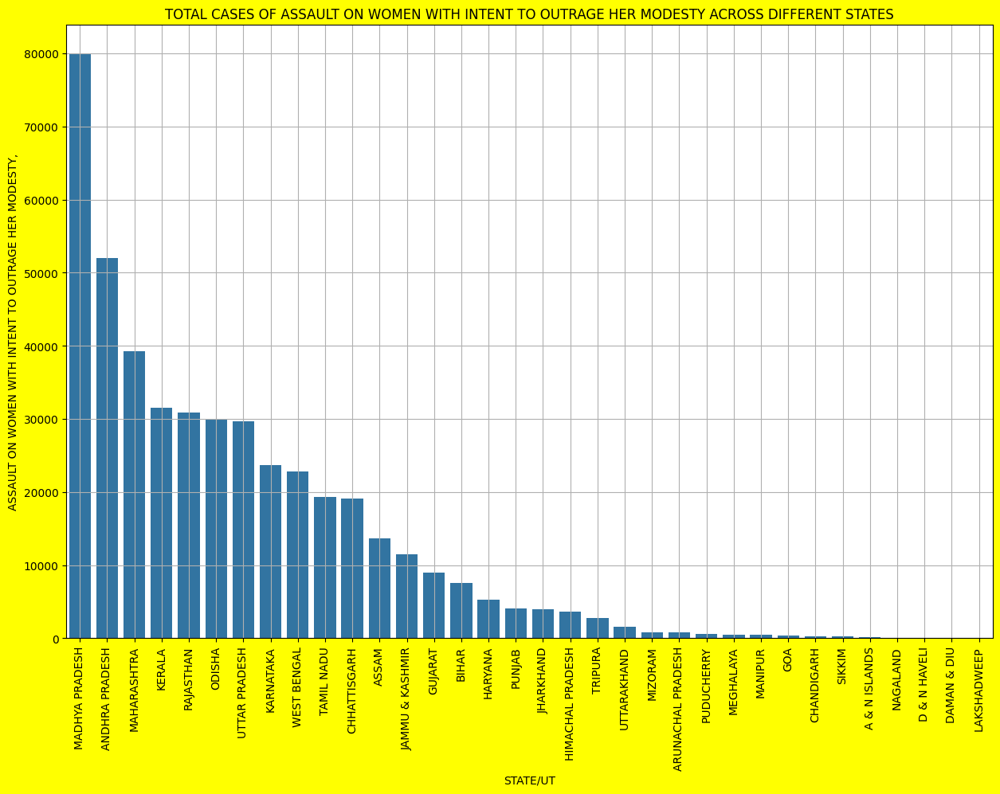

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dwd['STATE/UT'],y=dwd['ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,",fontsize=10)
plt.title("TOTAL CASES OF ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY ACROSS DIFFERENT STATES")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
dwd.sort_values(by='CRUELTY BY HUSBAND OR HIS RELATIVES',ascending=False,inplace=True)

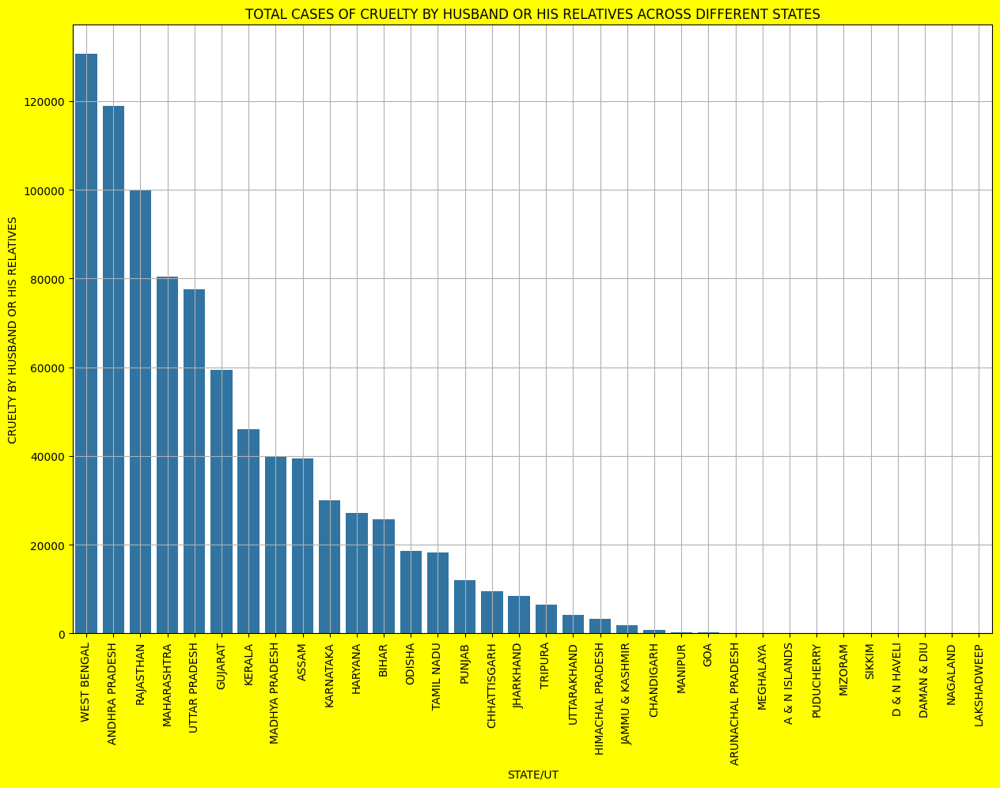

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dwd['STATE/UT'],y=dwd['CRUELTY BY HUSBAND OR HIS RELATIVES'])
plt.xlabel("STATE/UT",fontsize=10)
plt.ylabel("CRUELTY BY HUSBAND OR HIS RELATIVES",fontsize=10)
plt.title("TOTAL CASES OF CRUELTY BY HUSBAND OR HIS RELATIVES ACROSS DIFFERENT STATES")
plt.xticks(rotation=90)
plt.grid()
plt.show()

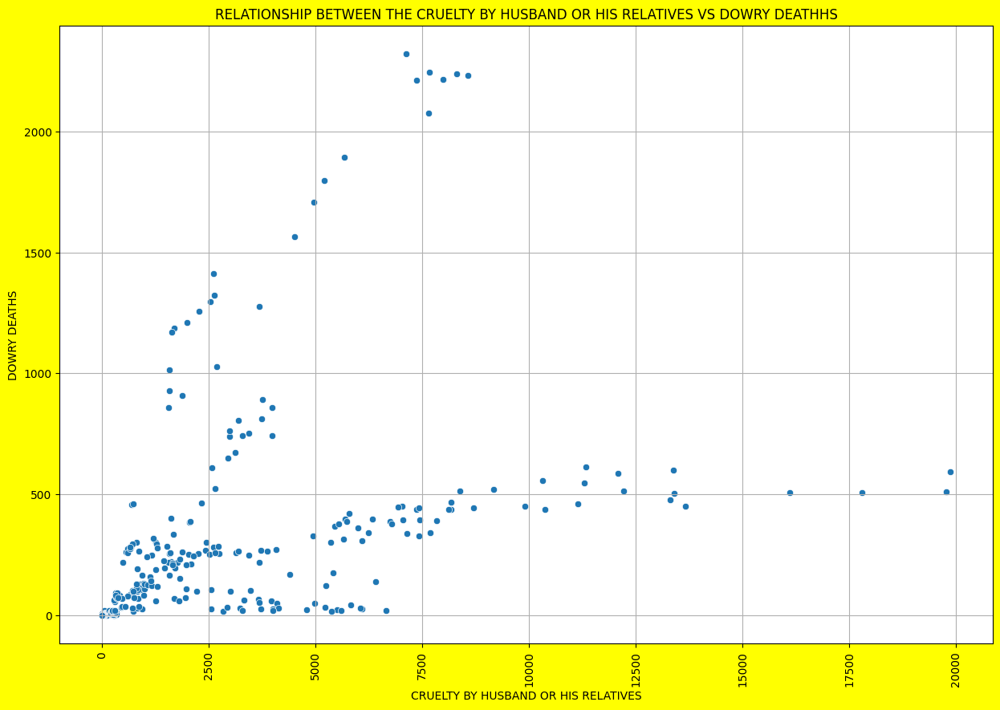

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.scatterplot(x=df5['CRUELTY BY HUSBAND OR HIS RELATIVES'],y=df5['DOWRY DEATHS'])
plt.xlabel("CRUELTY BY HUSBAND OR HIS RELATIVES",fontsize=10)
plt.ylabel("DOWRY DEATHS",fontsize=10)
plt.title("RELATIONSHIP BETWEEN THE CRUELTY BY HUSBAND OR HIS RELATIVES VS DOWRY DEATHHS")
plt.xticks(rotation=90)
plt.grid()
plt.show()

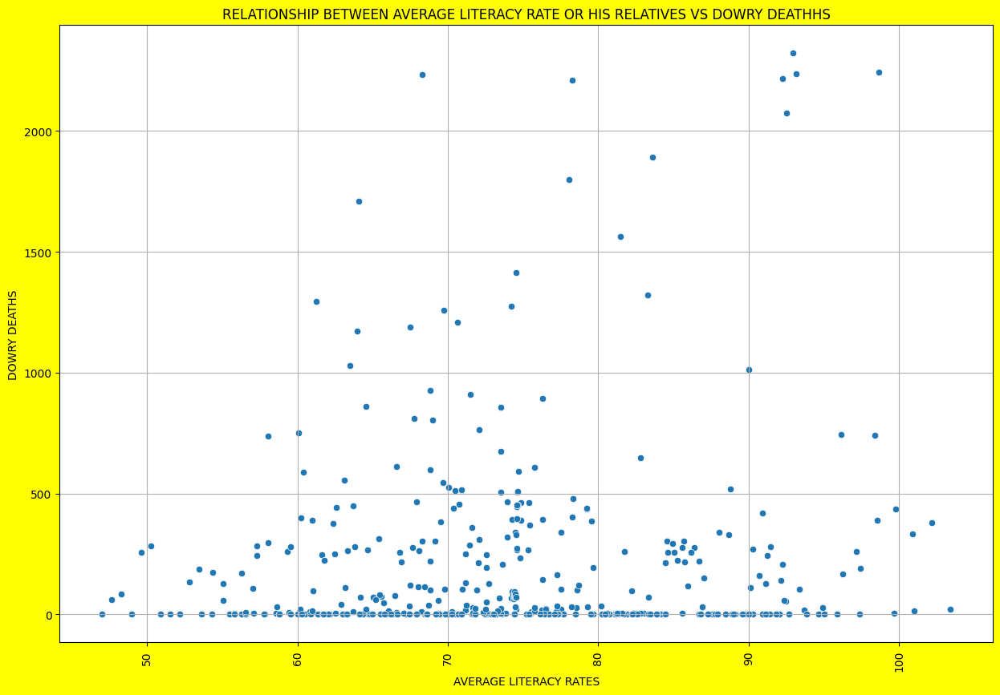

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.scatterplot(x=df5[' LITERACY RATE %  Average'],y=df5['DOWRY DEATHS'])
plt.xlabel("AVERAGE LITERACY RATES",fontsize=10)
plt.ylabel("DOWRY DEATHS",fontsize=10)
plt.title("RELATIONSHIP BETWEEN AVERAGE LITERACY RATE OR HIS RELATIVES VS DOWRY DEATHHS")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
df7 = pd.read_csv(r"C:\Users\pradu\Downloads\humanright.csv")

In [ ]:
df7.columns

Index(['Area_Name', 'Year', 'Group_Name', 'Sub_Group_Name',
       'Cases_Registered_under_Human_Rights_Violations',
       'Policemen_Chargesheeted', 'Policemen_Convicted',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year'],
      dtype='object')

In [ ]:
df7['Group_Name'].unique()

array(['HR_Disappearance of Persons', 'HR_Illegal detention/arrests',
       'HR_Fake encounter killings',
       'HR_Violation against Terrorists/Extremists', 'HR_Extortion',
       'HR_Torture', 'HR_False implication',
       'HR_Failure in taking action', 'HR_Indignity to Women',
       'HR_Atrocities on SC/ST', 'HR_Others Violations by Police',
       'HR_Total Violations by Police'], dtype=object)

In [ ]:
dhr=df7.groupby("Area_Name").sum().reset_index().sort_values(by='Policemen_Chargesheeted',ascending=False)

In [ ]:
dhr

,Area_Name,Year,Group_Name,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
9,Gujarat,240660,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,226.0,166.0,0.0,1734.75,1343.18,1530.54,2054310.0,4.296767e+08,3.937789e+08,9.845742e+08,4.683026e+08,1.849569e+08,31.96,27.12
28,Uttar Pradesh,110290,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,108.0,154.0,0.0,1042.50,780.34,919.09,1117980.0,2.513650e+08,2.316007e+08,4.839003e+08,2.423711e+08,7.835216e+07,19.69,16.74
5,Chhattisgarh,240660,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,624.0,142.0,138.0,1754.56,1345.34,1533.22,1823927.0,4.330448e+08,4.031722e+08,8.374208e+08,4.780515e+08,1.989854e+08,31.96,27.12
0,Andhra Pradesh,240660,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,226.0,110.0,4.0,1771.46,1381.78,1580.25,1722332.0,2.774705e+08,2.655160e+08,7.277952e+08,5.390991e+08,1.886961e+08,32.15,27.17
17,Maharashtra,222606,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,90.0,78.0,0.0,1467.53,1103.15,1280.48,1743529.0,2.790317e+08,2.637876e+08,5.434568e+08,3.925097e+08,1.509550e+08,27.49,23.30
7,Delhi,18049,HR_Fake encounter killingsHR_ExtortionHR_Extor...,03. Fake Encounter Killings05. Extortion05. Ex...,24.0,32.0,0.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
12,Jammu & Kashmir,224628,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,36.0,26.0,0.0,1654.33,1301.76,1472.66,1770248.0,3.794494e+08,3.512691e+08,7.314725e+08,3.784239e+08,1.844254e+08,29.19,24.63
3,Bihar,192528,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,52.0,26.0,16.0,1379.71,1048.62,1178.61,2405185.0,3.480540e+08,3.222976e+08,6.709463e+08,4.804142e+08,1.905544e+08,25.79,21.94
26,Tamil Nadu,114341,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,22.0,18.0,0.0,751.77,595.49,667.47,679645.0,1.236546e+08,1.124187e+08,2.364828e+08,1.832518e+08,5.322820e+07,13.71,11.61
22,Odisha,240660,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,62.0,18.0,0.0,1725.85,1333.80,1525.04,1692078.0,2.841628e+08,2.686957e+08,7.352448e+08,4.903495e+08,2.449101e+08,30.44,25.82


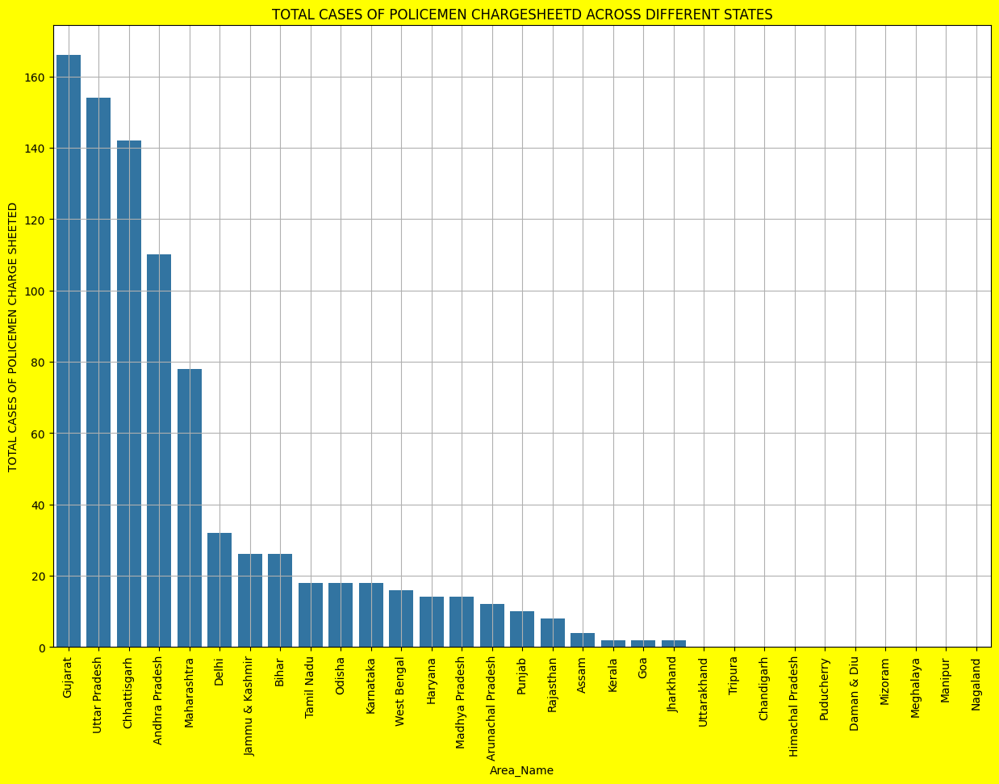

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dhr['Area_Name'],y=dhr['Policemen_Chargesheeted'])
plt.xlabel("Area_Name",fontsize=10)
plt.ylabel("TOTAL CASES OF POLICEMEN CHARGE SHEETED",fontsize=10)
plt.title("TOTAL CASES OF POLICEMEN CHARGESHEETD ACROSS DIFFERENT STATES")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
dhry=df7.groupby("Year").sum().reset_index().sort_values(by='Policemen_Chargesheeted',ascending=False)

In [ ]:
dhry

,Year,Area_Name,Group_Name,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,2001,Andhra PradeshArunachal PradeshAssamBiharChand...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,366.0,270.0,4.0,3937.75,3102.43,3522.16,3260343.0,6.193371e+08,5.768128e+08,1.552667e+09,9.994604e+08,3.819913e+08,74.19,61.61
8,2009,Andhra PradeshArunachal PradeshAssamBiharChand...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,382.0,166.0,116.0,3112.80,2426.21,2779.75,2166752.0,4.602373e+08,4.264196e+08,1.057158e+09,6.490859e+08,2.394573e+08,52.05,45.72
1,2002,Andhra PradeshAssamBiharChandigarhChhattisgarh...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,190.0,118.0,0.0,3152.54,2412.38,2779.04,3456639.0,6.584918e+08,6.159259e+08,1.434295e+09,9.403737e+08,3.363695e+08,62.82,51.51
6,2007,Andhra PradeshArunachal PradeshAssamBiharChhat...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,128.0,74.0,0.0,3751.30,2898.36,3328.33,3429305.0,7.383489e+08,6.846815e+08,1.769639e+09,1.033128e+09,3.918807e+08,66.00,56.21
5,2006,Andhra PradeshArunachal PradeshAssamChandigarh...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,58.0,56.0,0.0,3196.46,2455.95,2825.54,3141274.0,5.468386e+08,5.123284e+08,1.060994e+09,7.487613e+08,3.122373e+08,57.75,48.80
2,2003,Andhra PradeshArunachal PradeshAssamBiharChand...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,170.0,46.0,20.0,3058.28,2401.67,2709.91,3416889.0,5.700156e+08,5.320091e+08,1.277569e+09,7.840037e+08,3.198194e+08,58.43,48.59
3,2004,Andhra PradeshArunachal PradeshBiharChhattisga...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,88.0,44.0,0.0,2970.22,2269.14,2628.90,2787789.0,5.756852e+08,5.377160e+08,1.275435e+09,8.196307e+08,2.954250e+08,56.56,47.14
4,2005,Andhra PradeshArunachal PradeshAssamChandigarh...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,68.0,42.0,0.0,3483.62,2688.95,3069.71,4011260.0,7.721368e+08,7.187892e+08,1.832785e+09,1.088319e+09,4.050607e+08,64.84,54.50
7,2008,Andhra PradeshArunachal PradeshAssamBiharChand...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,506.0,28.0,16.0,2977.91,2295.91,2616.19,3882490.0,7.219325e+08,6.766823e+08,1.581467e+09,1.003358e+09,3.969267e+08,51.17,44.51
9,2010,Andhra PradeshArunachal PradeshBiharChhattisga...,HR_Disappearance of PersonsHR_Disappearance of...,01. Disappearance of Persons01. Disappearance ...,74.0,28.0,8.0,2649.94,2039.84,2323.05,3717892.0,6.776175e+08,6.351356e+08,1.314556e+09,7.953009e+08,3.355902e+08,43.90,39.11


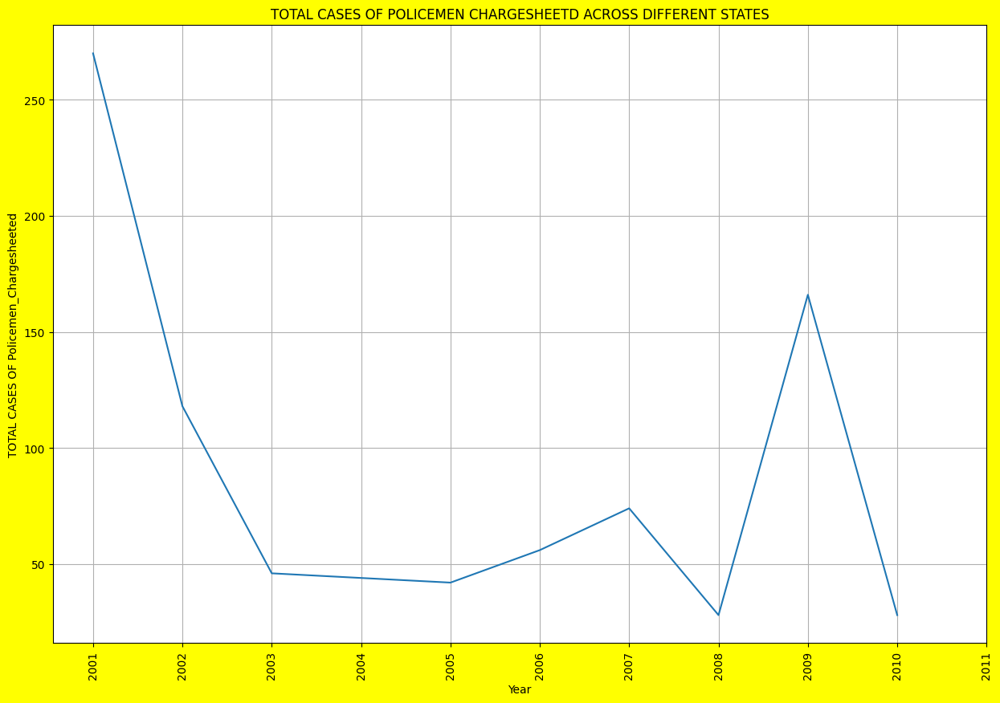

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.lineplot(x=dhry['Year'],y=dhry['Policemen_Chargesheeted'])
plt.xlabel("Year",fontsize=10)
plt.xticks([x for x in range(2001,2012)])
plt.ylabel("TOTAL CASES OF Policemen_Chargesheeted",fontsize=10)
plt.title("TOTAL CASES OF POLICEMEN CHARGESHEETD ACROSS DIFFERENT STATES")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
dtt=pd.pivot_table(data=df7,index=['Area_Name'],columns=['Year'],values=['Policemen_Chargesheeted'],aggfunc='mean').fillna(0)

In [ ]:
dtt['TOTAL']=dtt.sum(axis=1)

In [ ]:
dtt.sort_values(by='TOTAL',ascending=False,inplace=True)

In [ ]:
dtc=pd.pivot_table(data=df7,index=['Area_Name'],columns=['Year'],values=['Policemen_Convicted'],aggfunc='mean').fillna(0)

In [ ]:
dtc.columns

MultiIndex([('Policemen_Convicted', 2001),
            ('Policemen_Convicted', 2002),
            ('Policemen_Convicted', 2003),
            ('Policemen_Convicted', 2004),
            ('Policemen_Convicted', 2005),
            ('Policemen_Convicted', 2006),
            ('Policemen_Convicted', 2007),
            ('Policemen_Convicted', 2008),
            ('Policemen_Convicted', 2009),
            ('Policemen_Convicted', 2010)],
           names=[None, 'Year'])

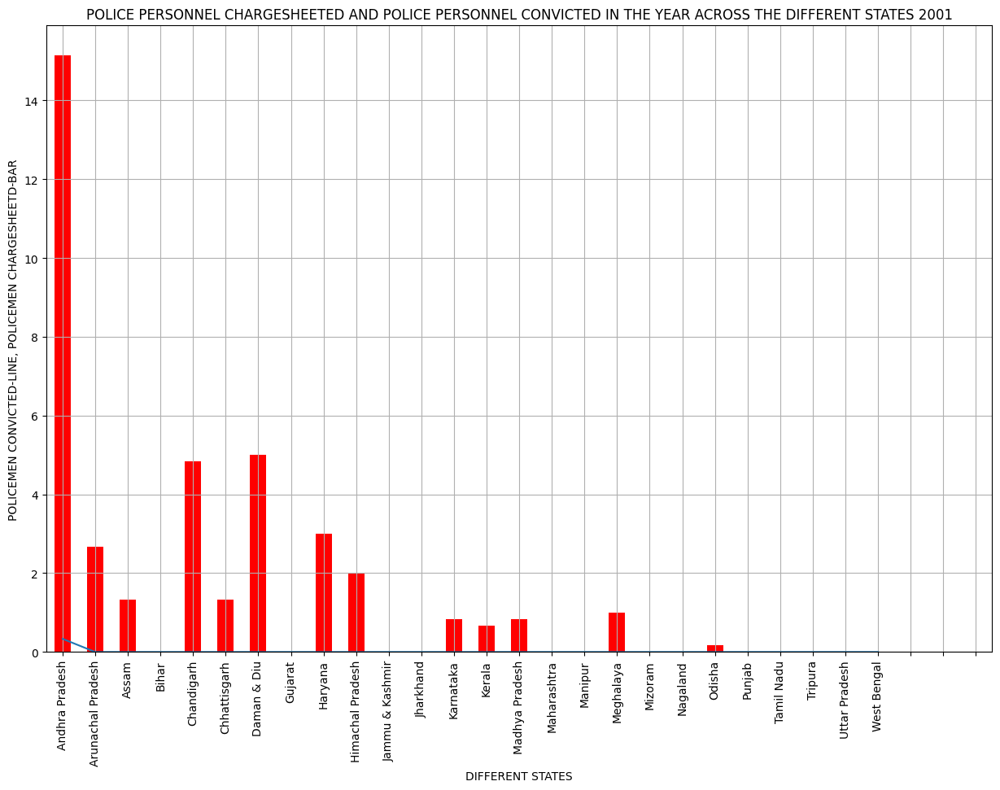

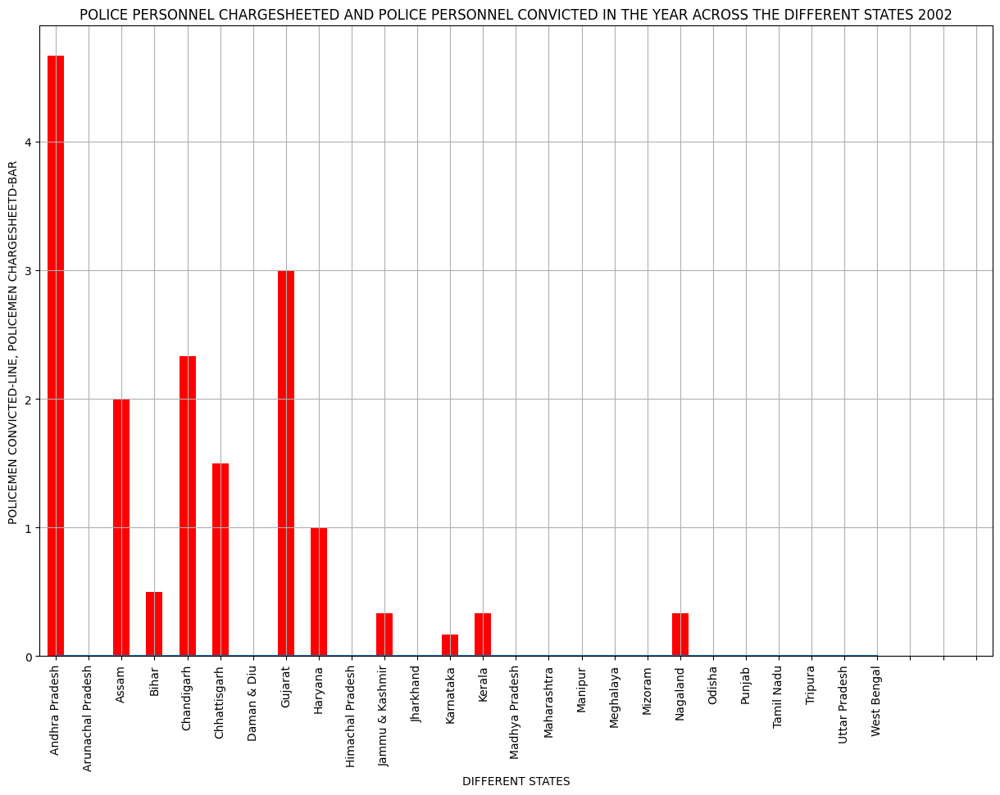

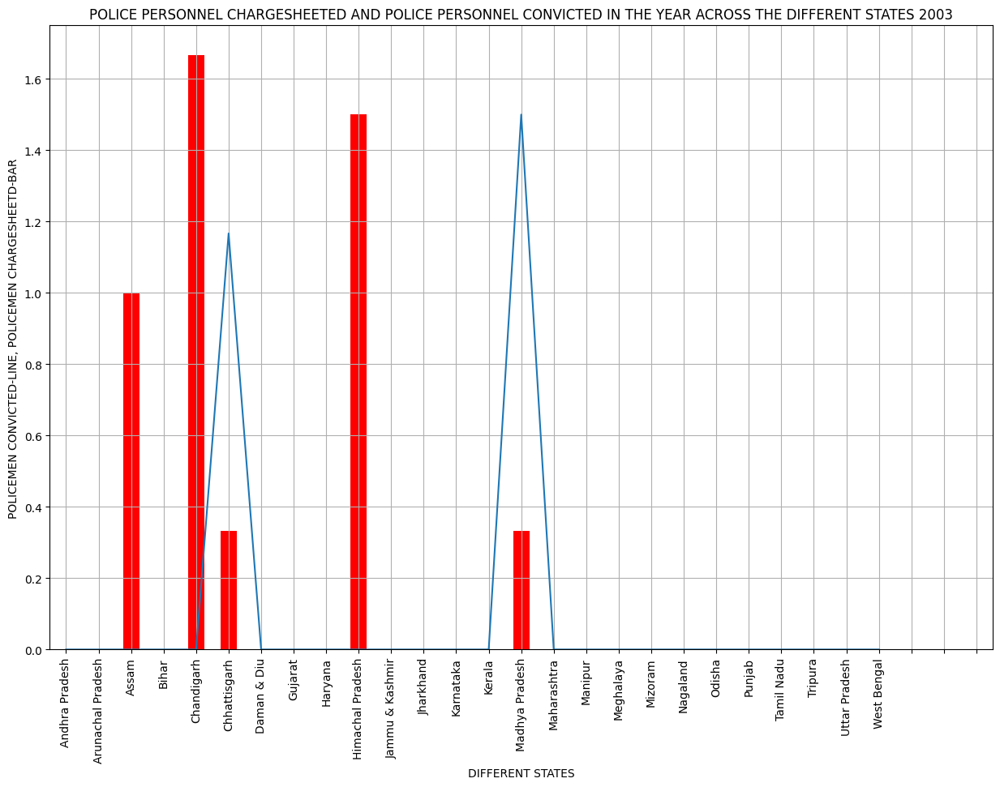

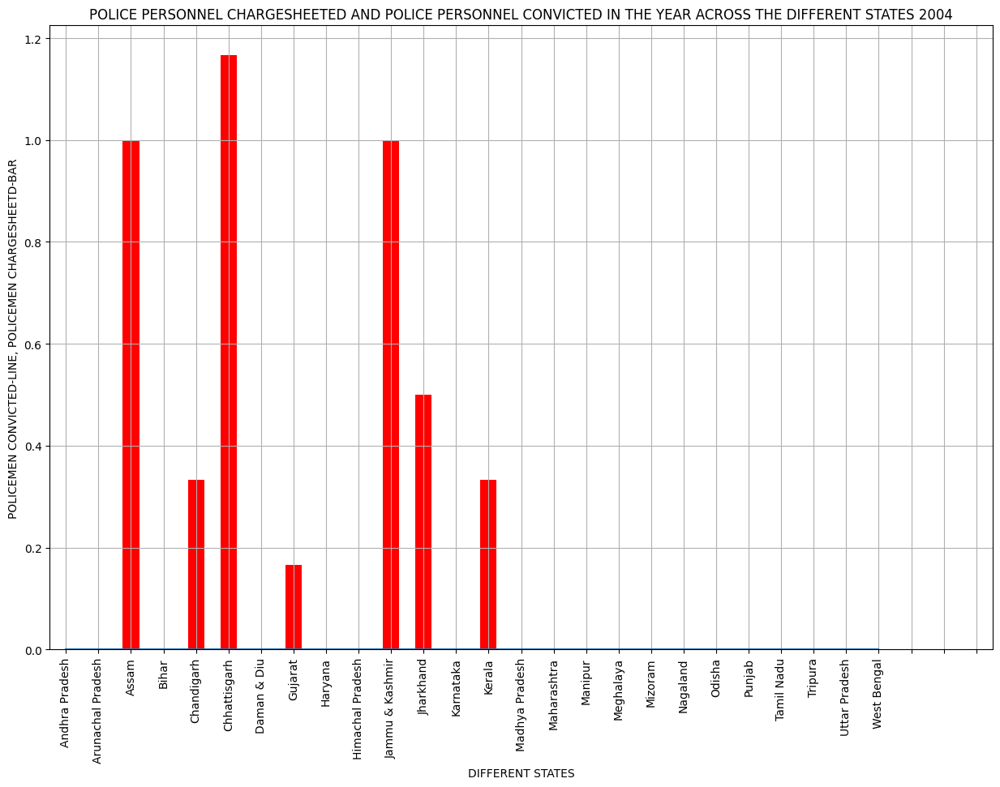

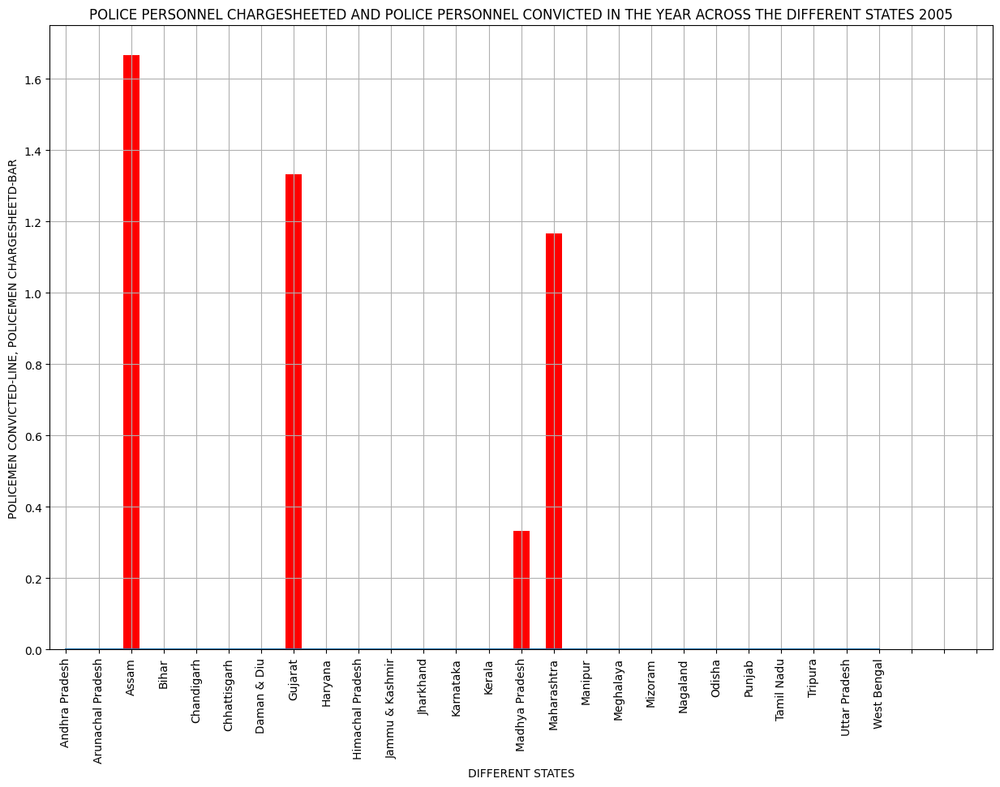

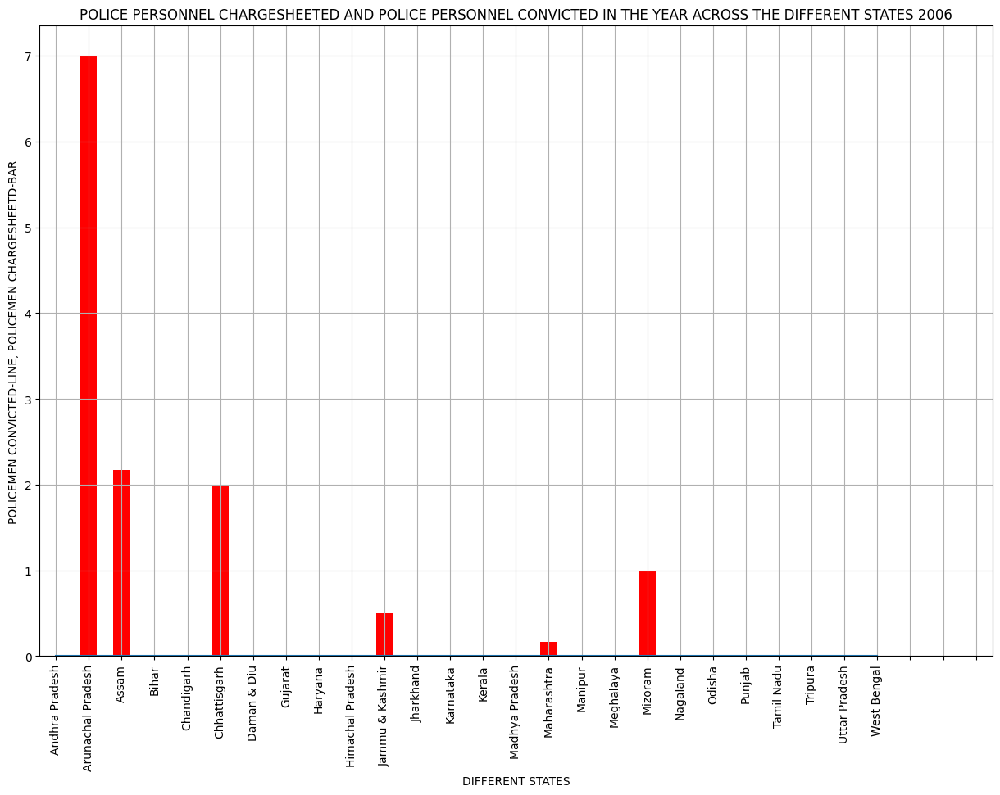

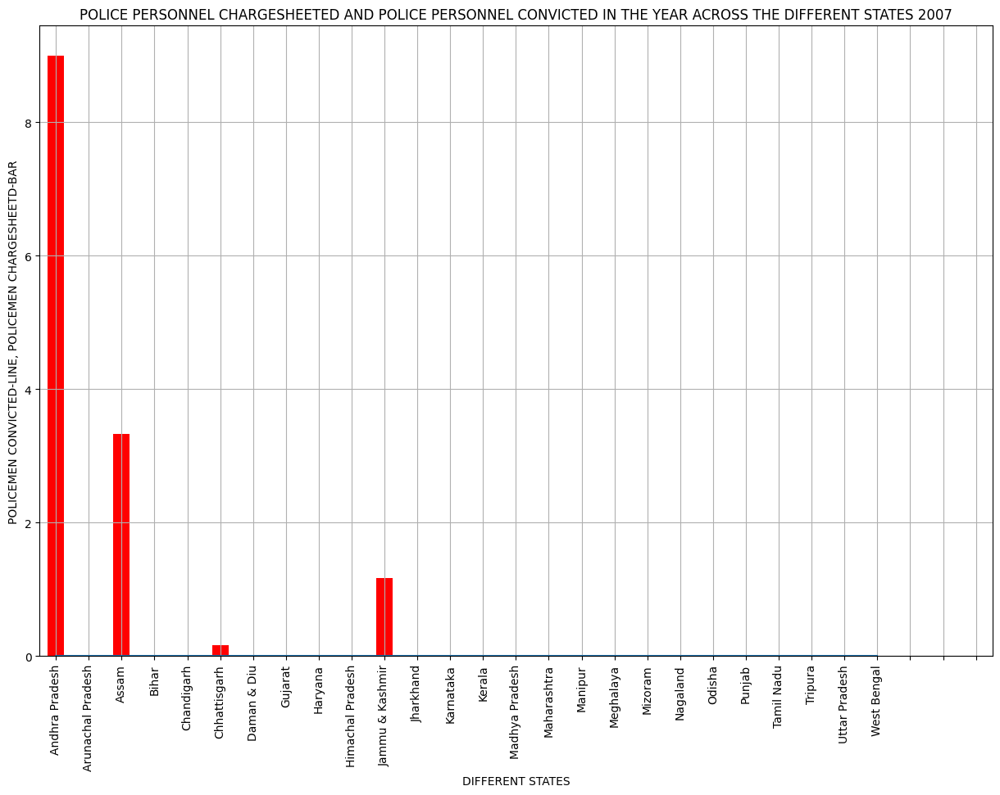

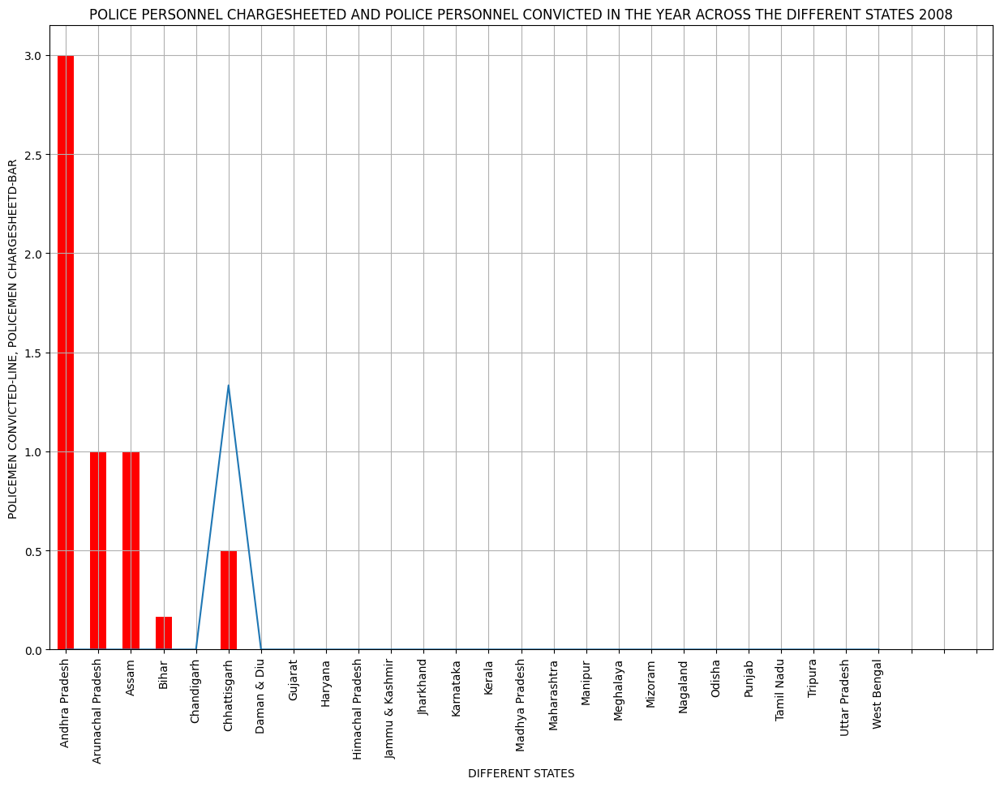

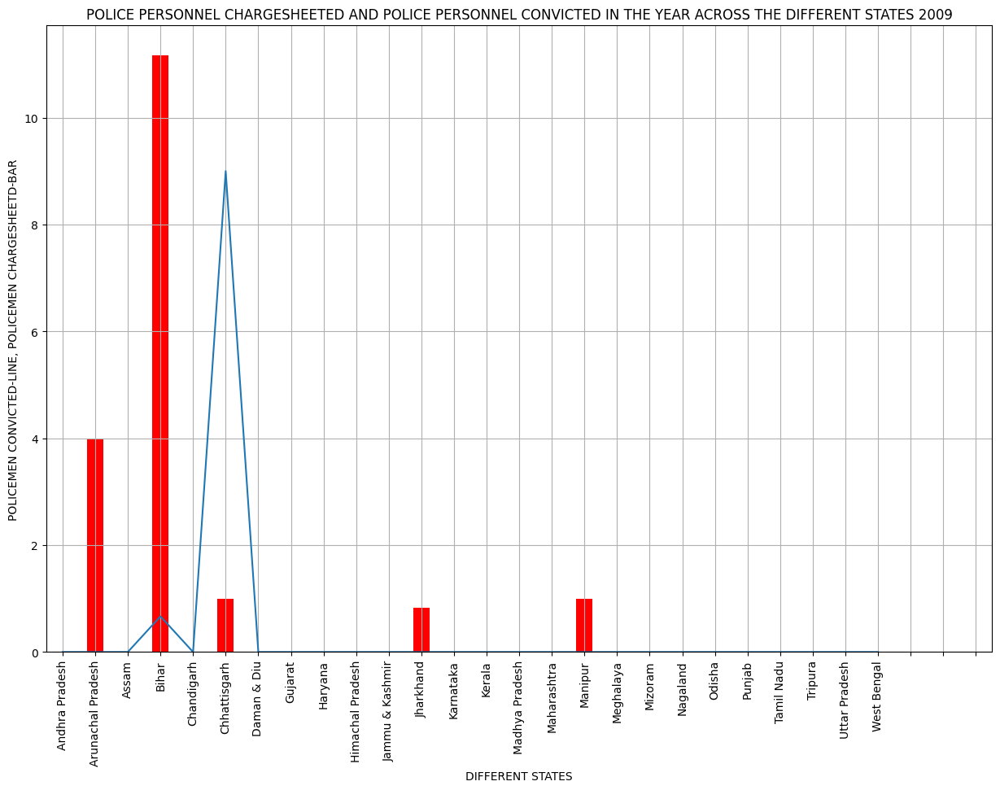

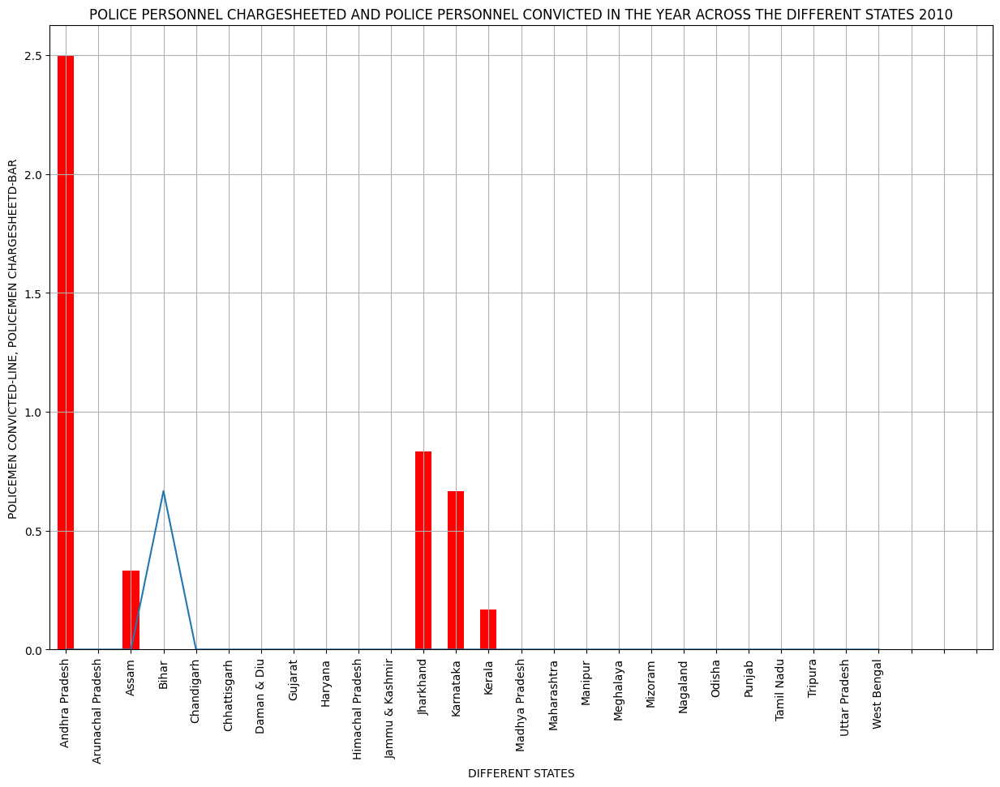

In [ ]:
for i in range(2001,2011):
    dtt['Policemen_Chargesheeted',i].plot(kind='bar',figsize=(15,10),facecolor='Red')
    dtc['Policemen_Convicted',i].plot(kind='line',figsize=(15,10))
    plt.title("POLICE PERSONNEL CHARGESHEETED AND POLICE PERSONNEL CONVICTED IN THE YEAR ACROSS THE DIFFERENT STATES {}".format(i))
    plt.ylabel("POLICEMEN CONVICTED-LINE, POLICEMEN CHARGESHEETD-BAR")
    plt.xlabel("DIFFERENT STATES")
    plt.xticks(rotation=90)
    plt.grid()
    plt.show()

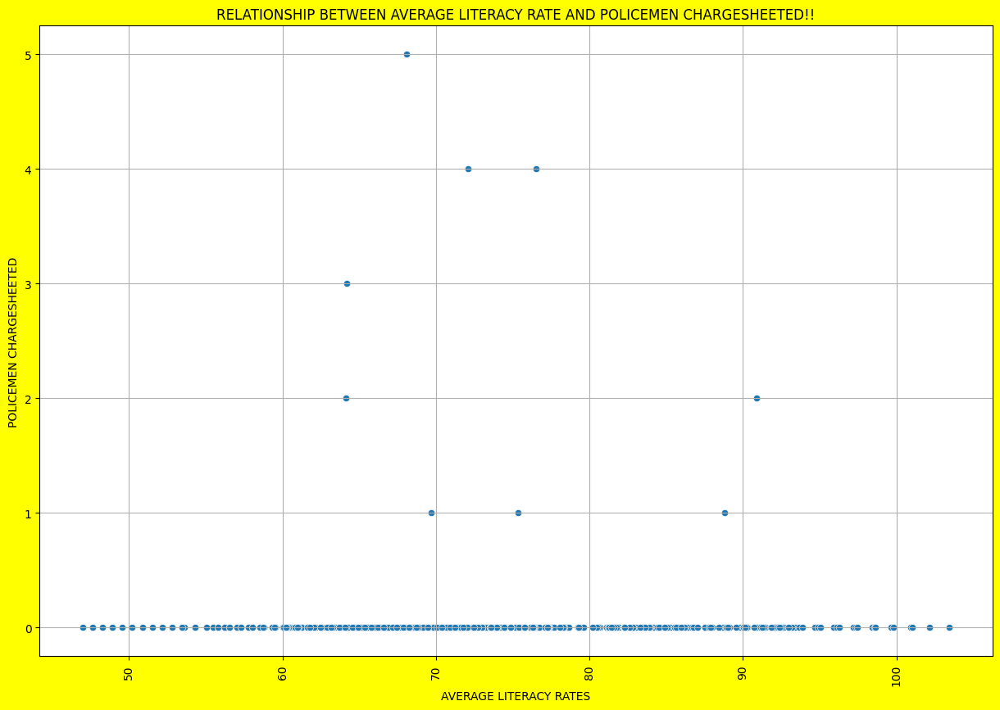

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.scatterplot(x=df7[' LITERACY RATE %  Average'],y=df7['Policemen_Chargesheeted'])
plt.xlabel("AVERAGE LITERACY RATES",fontsize=10)
plt.ylabel("POLICEMEN CHARGESHEETED",fontsize=10)
plt.title("RELATIONSHIP BETWEEN AVERAGE LITERACY RATE AND POLICEMEN CHARGESHEETED!!")
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
df7

,Area_Name,Year,Group_Name,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,Andhra Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,70.3,50.4,60.5,191792.0,38286811.0,37440730.0,76210007.0,55401067.0,20808940.0,1.79,1.37
1,Arunachal Pradesh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,63.8,43.5,54.3,83743.0,573951.0,517166.0,1091117.0,870087.0,227881.0,1.79,1.37
2,Assam,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,71.3,54.6,63.3,78438.0,13787799.0,12850608.0,26655528.0,23216288.0,3439240.0,1.79,1.37
3,Bihar,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,59.7,33.1,47.0,94163.0,43153964.0,39724832.0,82998509.0,74316709.0,8681800.0,1.79,1.37
4,Chandigarh,2001,HR_Disappearance of Persons,01. Disappearance of Persons,0.0,0.0,0.0,77.4,51.9,64.7,135191.0,10452426.0,10343530.0,20833803.0,16648056.0,4185747.0,1.79,1.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2262,Meghalaya,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2263,Nagaland,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2264,Odisha,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),5.0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2265,Uttar Pradesh,2010,HR_Total Violations by Police,12. Total (Sum of 1-11 Above),6.0,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dhrr=df7.groupby("Group_Name").sum().reset_index()

In [ ]:
dhrr.sort_values(by='Cases_Registered_under_Human_Rights_Violations',ascending=False,inplace=True)

In [ ]:
dhrr

,Group_Name,Area_Name,Year,Sub_Group_Name,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
10,HR_Total Violations by Police,Andhra PradeshArunachal PradeshAssamBiharChand...,429158,12. Total (Sum of 1-11 Above)12. Total (Sum of...,1015.0,436.0,82.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
8,HR_Others Violations by Police,Andhra PradeshArunachal PradeshAssamBiharChand...,389040,11. Others11. Others11. Others11. Others11. Ot...,496.0,214.0,62.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
0,HR_Atrocities on SC/ST,Andhra PradeshArunachal PradeshAssamBiharChand...,377000,10. Atrocities on SC/ST10. Atrocities on SC/ST...,143.0,61.0,3.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
9,HR_Torture,Andhra PradeshArunachal PradeshAssamBiharChand...,381034,06. Torture06. Torture06. Torture06. Torture06...,96.0,38.0,3.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
2,HR_Extortion,Andhra PradeshArunachal PradeshAssamBiharChand...,381046,05. Extortion05. Extortion05. Extortion05. Ext...,78.0,23.0,5.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
6,HR_Illegal detention/arrests,Andhra PradeshArunachal PradeshAssamBiharChand...,373003,02. Illegal Detention/Arrests02. Illegal Deten...,50.0,11.0,0.0,16092.76,12491.46,14252.09,16142307.0,3.210248e+09,2.993791e+09,7.094465e+09,4.348524e+09,1.681200e+09,260.09,232.78
3,HR_Failure in taking action,Andhra PradeshArunachal PradeshAssamBiharChand...,362981,08. Failure in Taking Action08. Failure in Tak...,40.0,7.0,7.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
7,HR_Indignity to Women,Andhra PradeshArunachal PradeshAssamBiharChand...,370998,09. Indignity to Women09. Indignity to Women09...,38.0,25.0,1.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
5,HR_False implication,Andhra PradeshArunachal PradeshAssamBiharChand...,364987,07. False Implication07. False Implication07. ...,29.0,2.0,1.0,0.00,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.00
4,HR_Fake encounter killings,Andhra PradeshArunachal PradeshAssamBiharChand...,371005,03. Fake Encounter Killings03. Fake Encounter ...,16.0,37.0,0.0,867.90,697.90,789.72,153803.0,6.388907e+07,5.868706e+07,3.064526e+08,2.230121e+08,8.344051e+07,12.06,11.07


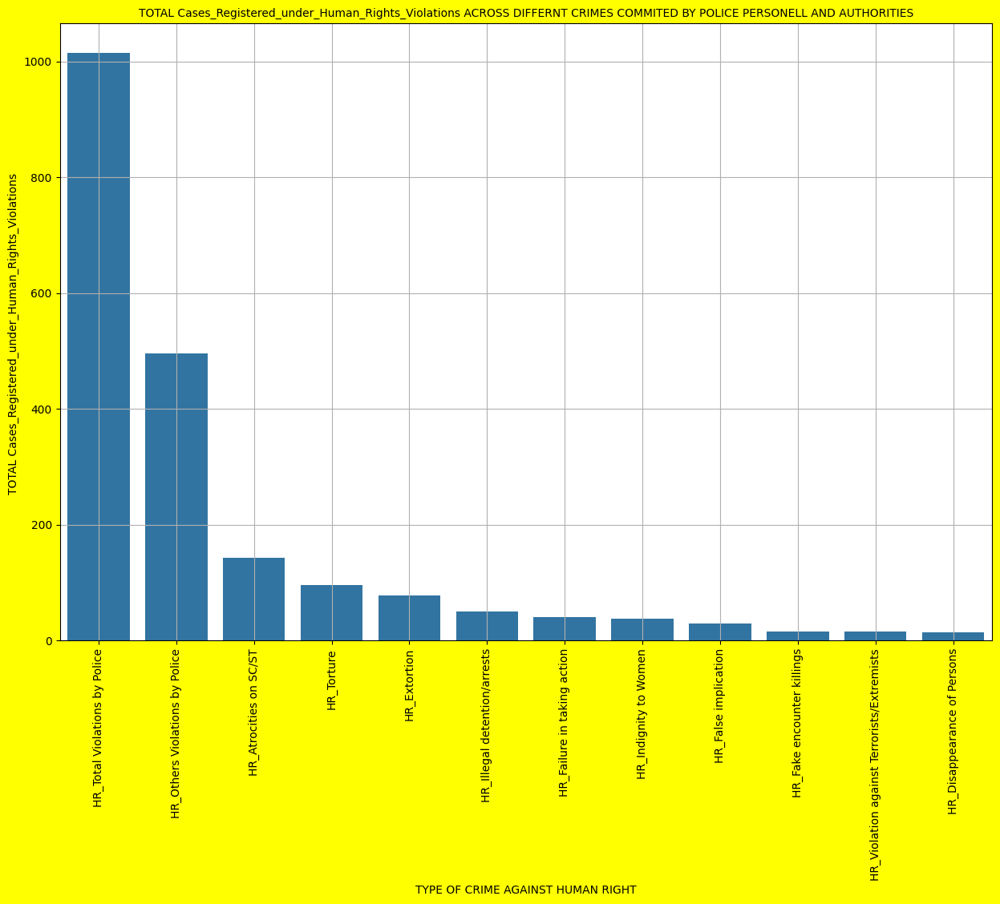

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.barplot(x=dhrr['Group_Name'],y=dhrr['Cases_Registered_under_Human_Rights_Violations'])
plt.xlabel("TYPE OF CRIME AGAINST HUMAN RIGHT",fontsize=10)
plt.ylabel("TOTAL Cases_Registered_under_Human_Rights_Violations ",fontsize=10)
plt.title("TOTAL Cases_Registered_under_Human_Rights_Violations ACROSS DIFFERNT CRIMES COMMITED BY POLICE PERSONELL AND AUTHORITIES",fontsize=10)
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [ ]:
df8 = pd.read_csv(r"C:\Users\pradu\Downloads\juvenile.csv")

In [ ]:
df8

,STATE/UT,Year,CRIME,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,Andhra Pradesh,2001,Murder,3,0,7,0,5,0,15,...,50.4,60.5,191792.0,38286811.0,37440730.0,76210007.0,55401067.0,20808940.0,1.79,1.37
1,Andhra Pradesh,2001,Attempt to Commit Murder,2,0,0,0,11,0,13,...,43.5,54.3,83743.0,573951.0,517166.0,1091117.0,870087.0,227881.0,1.79,1.37
2,Andhra Pradesh,2001,C H Not amounting to Murder,0,0,0,0,0,0,0,...,54.6,63.3,78438.0,13787799.0,12850608.0,26655528.0,23216288.0,3439240.0,1.79,1.37
3,Andhra Pradesh,2001,Rape,2,0,15,0,2,1,19,...,33.1,47.0,94163.0,43153964.0,39724832.0,82998509.0,74316709.0,8681800.0,1.79,1.37
4,Andhra Pradesh,2001,Custodial Rape,0,0,0,0,0,0,0,...,51.9,64.7,135191.0,10452426.0,10343530.0,20833803.0,16648056.0,4185747.0,1.79,1.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10495,Puducherry,2010,Cruelty by Husband or Relatives,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10496,Puducherry,2010,Importation of girls from Foreign Countr,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10497,Puducherry,2010,Causing death by negligence,0,0,0,0,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10498,Puducherry,2010,Other IPC Crimes,0,0,1,0,2,3,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dfj=df8.groupby("Year").sum().reset_index()

In [ ]:
dfj

,Year,STATE/UT,CRIME,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,2001,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,3532,198,19026,1189,25725,2644,48283,...,3800.16,4362.55,5807878.0,1.104637e+09,1.030722e+09,2.475095e+09,1.547753e+09,5.910878e+08,95.10,78.15
1,2002,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2647,168,21019,1088,28440,2049,52106,...,3890.63,4450.51,4731351.0,8.589724e+08,8.023834e+08,1.845611e+09,1.207186e+09,4.572471e+08,93.25,77.75
2,2003,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2754,223,20307,1184,28037,2421,51098,...,3662.20,4169.37,4583786.0,9.104025e+08,8.483368e+08,2.104854e+09,1.260742e+09,5.000604e+08,84.70,71.15
3,2004,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,3073,229,22535,1413,27143,1898,52751,...,1867.71,2150.22,2786480.0,5.319994e+08,4.956183e+08,1.192573e+09,7.379682e+08,2.914375e+08,49.65,39.90
4,2005,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2439,201,22326,1304,29722,2005,54487,...,1907.06,2183.36,2098274.0,4.167993e+08,3.869325e+08,9.710961e+08,5.967560e+08,2.084125e+08,47.80,39.50
5,2006,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2560,143,23924,1241,31700,1829,58184,...,1939.67,2198.48,2682751.0,5.202866e+08,4.867832e+08,1.177175e+09,7.325972e+08,2.759619e+08,45.96,39.20
6,2007,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2589,200,23623,1128,38618,2054,64830,...,2022.31,2288.66,2441276.0,4.618522e+08,4.290778e+08,1.063161e+09,6.216081e+08,2.703336e+08,44.40,38.70
7,2008,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2328,275,24383,1138,40538,1824,67249,...,1930.38,2208.95,3021398.0,5.767279e+08,5.390920e+08,1.291250e+09,8.170711e+08,3.004327e+08,42.90,38.10
8,2009,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,2082,190,20634,1291,39277,2367,61993,...,1982.45,2265.61,2633077.0,4.442830e+08,4.179007e+08,8.638396e+08,6.112094e+08,2.526351e+08,42.15,37.85
9,2010,Andhra PradeshAndhra PradeshAndhra PradeshAndh...,MurderAttempt to Commit MurderC H Not amountin...,1600,174,20354,1045,37677,1682,59631,...,1988.27,2304.87,2484362.0,5.146811e+08,4.796535e+08,1.171910e+09,7.285303e+08,2.671493e+08,41.80,37.40


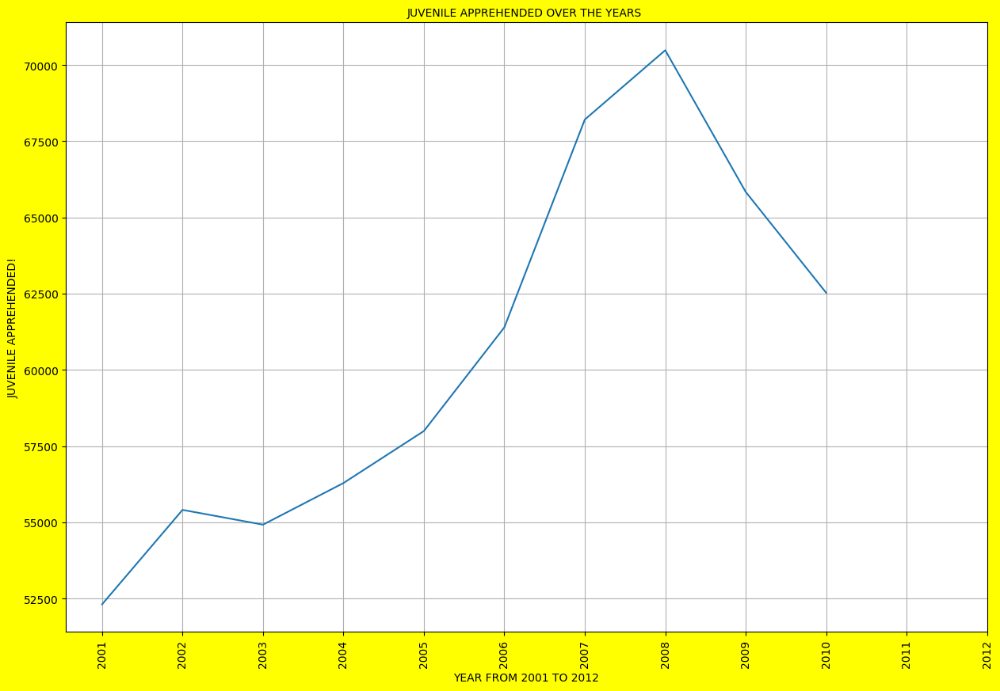

In [ ]:
plt.figure(figsize=(15,10),facecolor='Yellow')
sns.lineplot(x=dfj['Year'],y=dfj['Grand total'])
plt.xlabel("YEAR FROM 2001 TO 2012",fontsize=10)
plt.ylabel("JUVENILE APPREHENDED!",fontsize=10)
plt.title("JUVENILE APPREHENDED OVER THE YEARS ",fontsize=10)
plt.xticks([x for x in range(2001,2013)],rotation=90)
plt.grid()
plt.show()

In [ ]:
dfjs=df8.groupby("STATE/UT").sum().reset_index().sort_values(by='Grand total',ascending=False)

In [ ]:
dfjs

,STATE/UT,Year,CRIME,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
19,Madhya Pradesh,601650,MurderAttempt to Commit MurderC H Not amountin...,5836,406,47670,2866,71304,4291,124810,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
20,Maharashtra,601650,MurderAttempt to Commit MurderC H Not amountin...,4967,382,45491,2757,68849,4295,119307,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
11,Gujarat,601650,MurderAttempt to Commit MurderC H Not amountin...,1470,200,14845,1379,26031,2598,42346,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
28,Rajasthan,601650,MurderAttempt to Commit MurderC H Not amountin...,1090,76,15543,597,25891,2189,42524,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
6,Chhattisgarh,601650,MurderAttempt to Commit MurderC H Not amountin...,1773,199,20332,748,16606,550,38711,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
1,Andhra Pradesh,601650,MurderAttempt to Commit MurderC H Not amountin...,1771,57,13683,455,21022,1381,36476,...,19093.10,21867.43,26286455.0,4.863321e+09,4.541679e+09,1.075652e+10,6.807366e+09,2.612314e+09,472.01,393.0
12,Haryana,601650,MurderAttempt to Commit MurderC H Not amountin...,353,21,7409,221,20176,1036,27938,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
30,Tamil Nadu,601650,MurderAttempt to Commit MurderC H Not amountin...,738,158,7379,523,12221,748,20338,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
9,Delhi UT,601650,MurderAttempt to Commit MurderC H Not amountin...,683,53,7106,178,11870,354,19659,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0
4,Bihar,601650,MurderAttempt to Commit MurderC H Not amountin...,133,7,3356,96,10457,427,13946,...,0.00,0.00,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.00,0.0


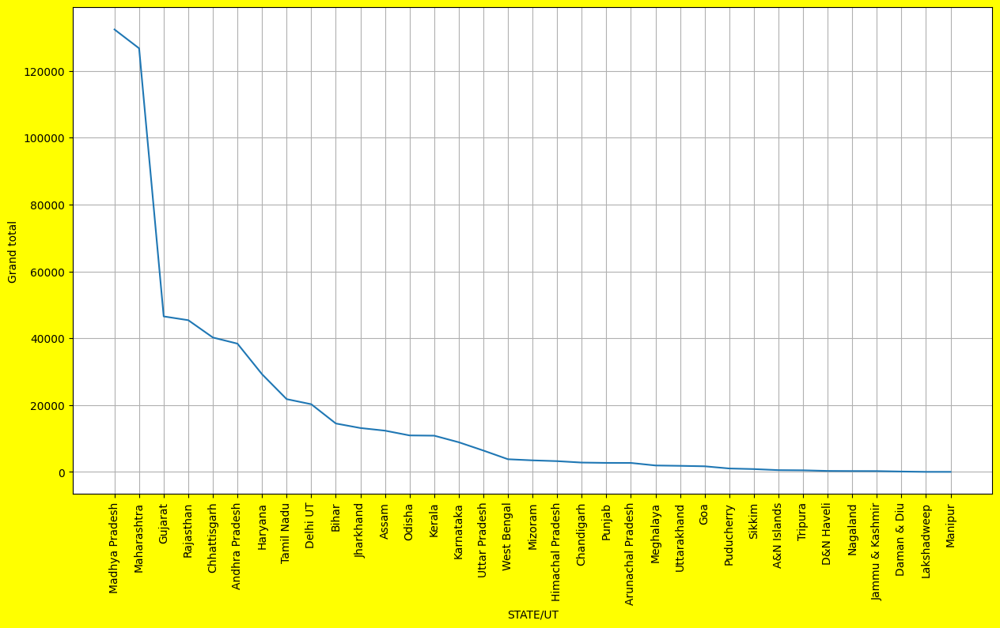

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Grand total'])
plt.xticks(rotation=90)
plt.grid()
plt.show()

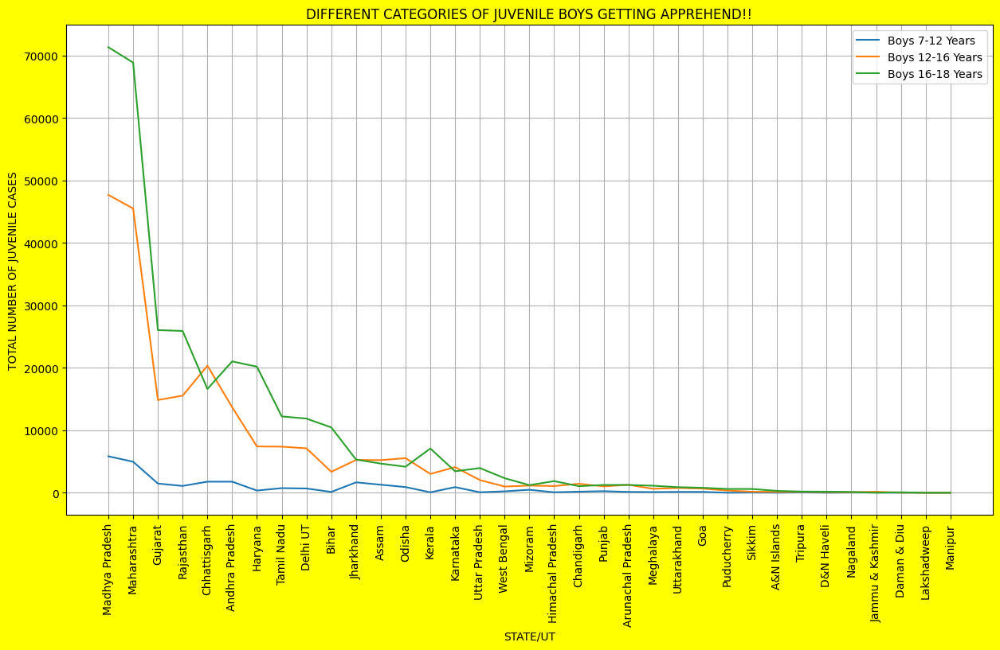

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Boys 7-12 Years'],label="Boys 7-12 Years")
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Boys 12-16 Years'],label="Boys 12-16 Years")
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Boys 16-18 Years'],label="Boys 16-18 Years")
plt.xlabel("STATE/UT")
plt.xticks(rotation=90)
plt.ylabel("TOTAL NUMBER OF JUVENILE CASES")
plt.title("DIFFERENT CATEGORIES OF JUVENILE BOYS GETTING APPREHEND!!")
plt.grid()
plt.legend()
plt.show()

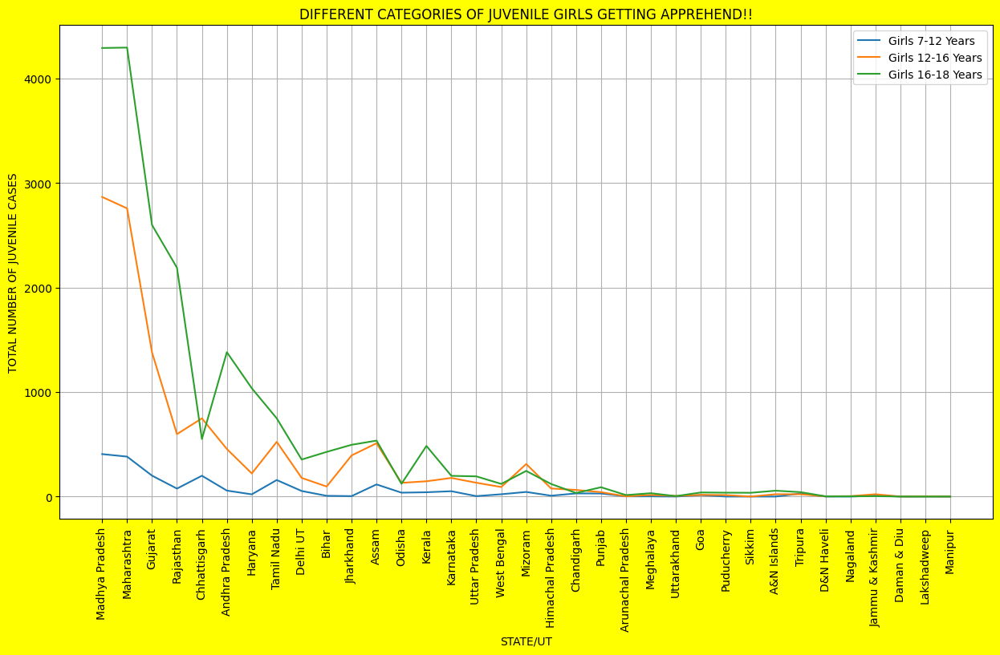

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Girls 7-12 Years'],label="Girls 7-12 Years")
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Girls 12-16 Years'],label="Girls 12-16 Years")
sns.lineplot(x=dfjs['STATE/UT'],y=dfjs['Girls 16-18 Years'],label="Girls 16-18 Years")
plt.xlabel("STATE/UT")
plt.xticks(rotation=90)
plt.ylabel("TOTAL NUMBER OF JUVENILE CASES")
plt.title("DIFFERENT CATEGORIES OF JUVENILE GIRLS GETTING APPREHEND!!")
plt.grid()
plt.legend()
plt.show()

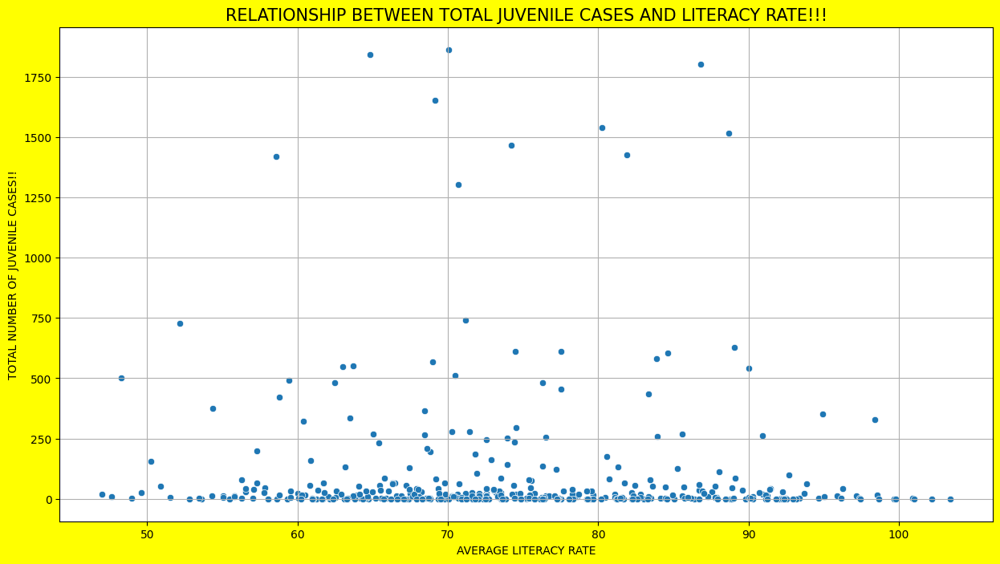

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.scatterplot(x=df8[' LITERACY RATE %  Average'],y=df8['Grand total'])
plt.title("RELATIONSHIP BETWEEN TOTAL JUVENILE CASES AND LITERACY RATE!!!",fontsize=15)
plt.xlabel("AVERAGE LITERACY RATE",fontsize=10)
plt.ylabel("TOTAL NUMBER OF JUVENILE CASES!!",fontsize=10)
plt.grid()
plt.show()

In [ ]:
df9 = pd.read_csv(r"C:\Users\pradu\Downloads\police.csv")

In [ ]:
df9

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,Andaman & Nicobar Islands,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,50.4,60.5,191792.0,38286811.0,37440730.0,76210007.0,55401067.0,20808940.0,1.79,1.37
1,Andhra Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,3,4,1,3,0,...,43.5,54.3,83743.0,573951.0,517166.0,1091117.0,870087.0,227881.0,1.79,1.37
2,Arunachal Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,54.6,63.3,78438.0,13787799.0,12850608.0,26655528.0,23216288.0,3439240.0,1.79,1.37
3,Assam,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,1,0,...,33.1,47.0,94163.0,43153964.0,39724832.0,82998509.0,74316709.0,8681800.0,1.79,1.37
4,Bihar,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,1,0,0,0,2,0,...,51.9,64.7,135191.0,10452426.0,10343530.0,20833803.0,16648056.0,4185747.0,1.79,1.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,Tamil Nadu,2010,Police - Total,7. Total Police Killed or Injured,10,26,142,4,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2446,Tripura,2010,Police - Total,7. Total Police Killed or Injured,0,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2447,Uttar Pradesh,2010,Police - Total,7. Total Police Killed or Injured,6,10,9,10,0,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2448,Uttarakhand,2010,Police - Total,7. Total Police Killed or Injured,0,0,5,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
dfpa=df9.groupby("Area_Name").sum().reset_index()

In [ ]:
dfpa

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,Andaman & Nicobar Islands,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,22,0,0,0,0,0,...,535.22,642.48,1917920.0,4.124047e+08,4.032911e+08,8.208926e+08,5.967501e+08,2.241426e+08,15.51,12.99
1,Andhra Pradesh,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,244,1328,1854,100,252,2,...,461.93,576.63,837430.0,6.180758e+06,5.569253e+06,1.175001e+07,9.369785e+06,2.454003e+06,15.45,12.99
2,Arunachal Pradesh,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,10,38,0,30,2,0,...,579.82,672.21,784380.0,1.484779e+08,1.383855e+08,2.870478e+08,2.500114e+08,3.703646e+07,15.45,12.99
3,Assam,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,50,114,44,14,208,34,...,351.50,499.10,941630.0,4.647160e+08,4.277884e+08,8.937936e+08,8.003011e+08,9.349249e+07,15.45,12.99
4,Bihar,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,126,136,138,56,142,26,...,551.14,687.07,1351910.0,1.125600e+08,1.113873e+08,2.243549e+08,1.792794e+08,4.507543e+07,15.45,12.99
5,Chandigarh,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,114,312,140,0,0,0,...,800.70,861.22,37020.0,7.383266e+06,7.089967e+06,1.451275e+07,7.291451e+06,7.221304e+06,15.45,12.99
6,Chhattisgarh,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,88,124,58,16,536,20,...,622.29,743.35,1960240.0,2.836936e+08,2.611748e+08,5.456656e+08,3.418097e+08,2.038559e+08,15.45,12.99
7,Dadra & Nagar Haveli,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,0,0,0,0,0,0,...,485.31,721.05,442120.0,1.219852e+08,1.050531e+08,2.277014e+08,1.618470e+08,6.585443e+07,15.45,12.99
8,Daman & Diu,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,0,0,0,0,0,0,...,715.74,812.38,556730.0,3.322448e+07,3.222014e+07,6.545163e+07,5.903795e+07,6.413687e+06,15.45,12.99
9,Delhi,140385,Police - Assistant Sub-InspectorsPolice - Assi...,3. Assistant Sub-Inspectos3. Assistant Sub-Ins...,410,1144,608,60,40,4,...,456.62,589.37,422410.0,5.708077e+07,5.136006e+07,1.092354e+08,8.213424e+07,2.710115e+07,15.45,12.99


In [ ]:
dfpa.columns

Index(['Area_Name', 'Year', 'Group_Name', 'Sub_Group_Name',
       'Police_Injured_By_Criminals', 'Police_Injured_By_Riotous_Mobs',
       'Police_Injured_In_Accidents',
       'Police_Injured_In_Dacoity_OperationsOther_raids',
       'Police_Injured_In_TerroristsExtremists_Operations',
       'Police_Injured_On_Border_Duties', 'Police_Injured_Total_Policemen',
       'Police_Killed_By_Criminals', 'Police_Killed_By_Riotous_Mobs',
       'Police_Killed_In_Accidents',
       'Police_Killed_In_Dacoity_OperationsOther_raids',
       'Police_Killed_In_TerroristsExtremists_Operations',
       'Police_Killed_On_Border_Duties', 'Police_Killed_Total_Policemen',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year'],
      dtype='object')

In [ ]:
dfpa.sort_values(by='Police_Killed_Total_Policemen',ascending=False,inplace=True)

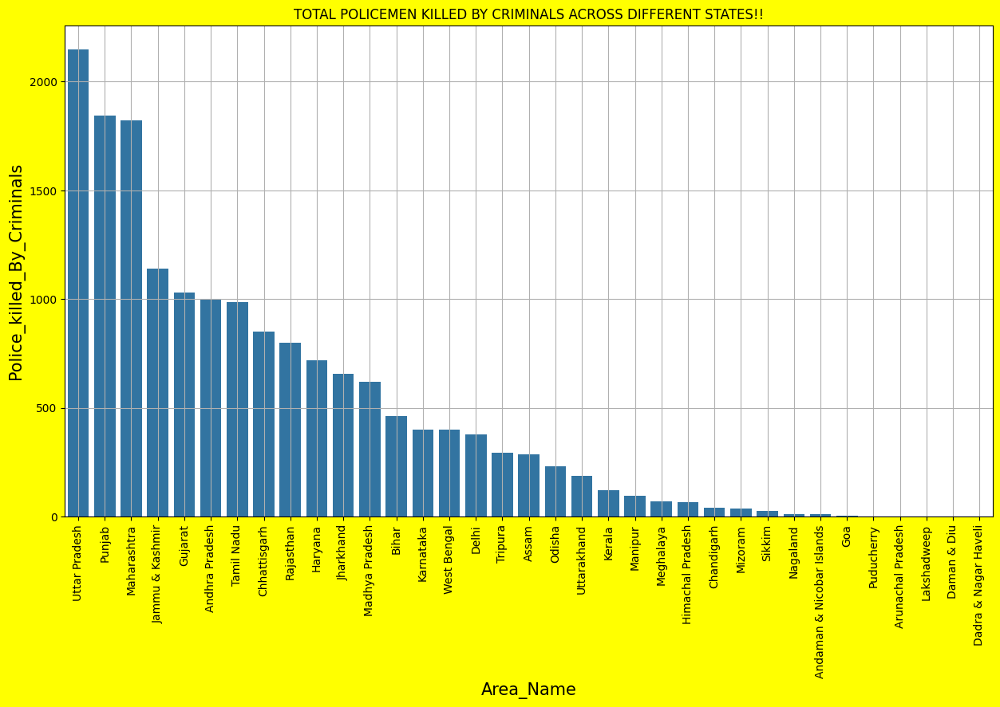

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dfpa['Area_Name'],y=dfpa['Police_Killed_Total_Policemen'])
plt.xlabel("Area_Name",fontsize=15)
plt.xticks(rotation=90)
plt.ylabel("Police_killed_By_Criminals",fontsize=15)
plt.title("TOTAL POLICEMEN KILLED BY CRIMINALS ACROSS DIFFERENT STATES!!")
plt.grid(True)
plt.show()

In [ ]:
dfpy=df9.groupby("Year").sum().reset_index().sort_values(by='Police_Killed_Total_Policemen',ascending=False)

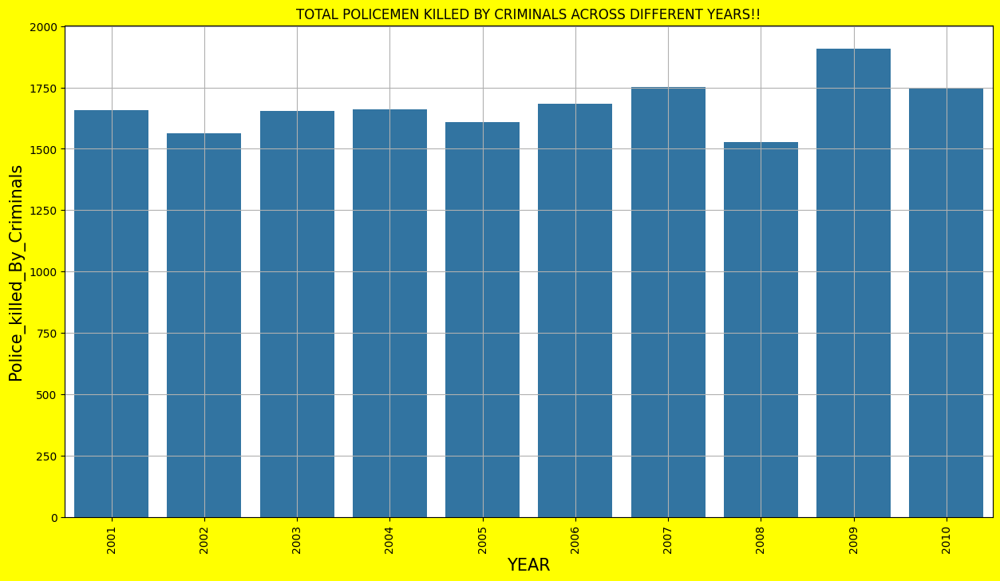

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dfpy['Year'],y=dfpy['Police_Killed_Total_Policemen'])
plt.xlabel("YEAR",fontsize=15)
plt.xticks(rotation=90)
plt.ylabel("Police_killed_By_Criminals",fontsize=15)
plt.title("TOTAL POLICEMEN KILLED BY CRIMINALS ACROSS DIFFERENT YEARS!!")
plt.grid(True)
plt.show()

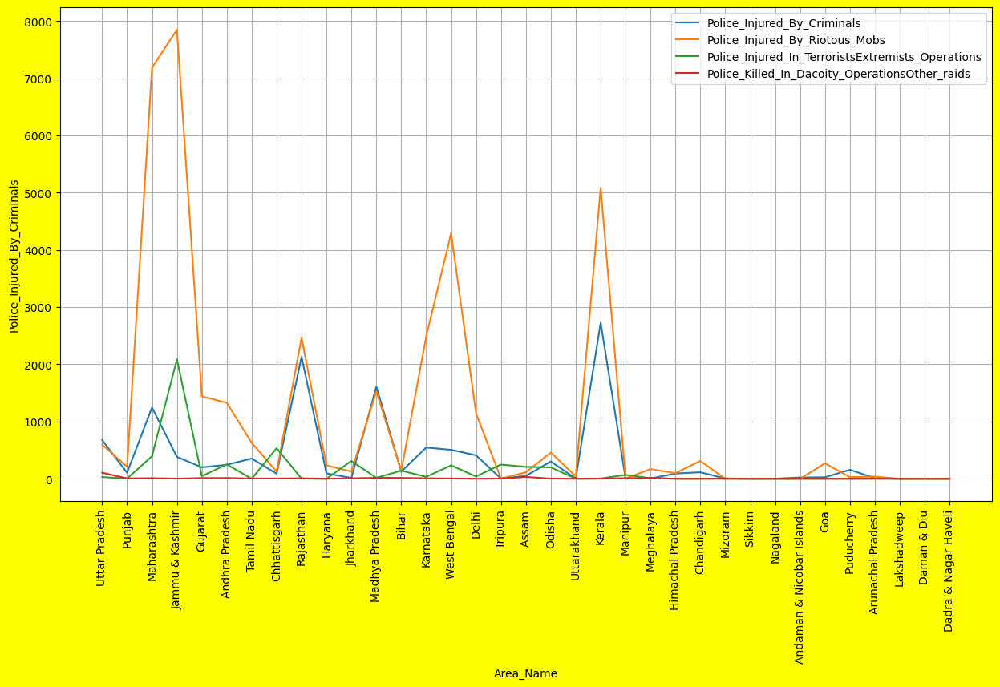

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfpa['Area_Name'],y=dfpa['Police_Injured_By_Criminals'],label="Police_Injured_By_Criminals")
sns.lineplot(x=dfpa['Area_Name'],y=dfpa['Police_Injured_By_Riotous_Mobs'],label="Police_Injured_By_Riotous_Mobs")
sns.lineplot(x=dfpa['Area_Name'],y=dfpa['Police_Injured_In_TerroristsExtremists_Operations'],label="Police_Injured_In_TerroristsExtremists_Operations")
sns.lineplot(x=dfpa['Area_Name'],y=dfpa['Police_Killed_In_Dacoity_OperationsOther_raids'],label="Police_Killed_In_Dacoity_OperationsOther_raids")
plt.xticks(rotation=90)
plt.grid()
plt.show()

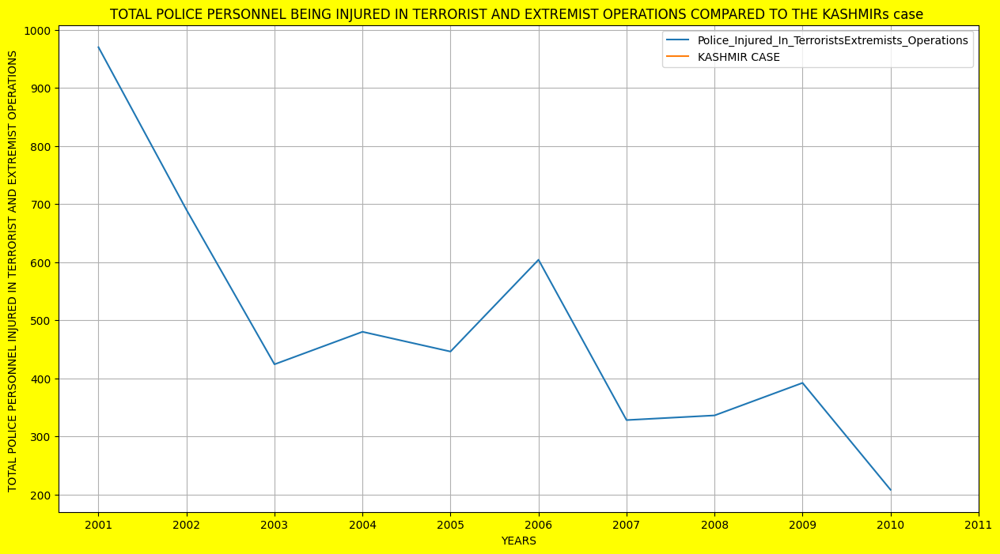

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfpy['Year'],y=dfpy['Police_Injured_In_TerroristsExtremists_Operations'],label="Police_Injured_In_TerroristsExtremists_Operations")
df9[df9['Area_Name']=='JAMMU & KASHMIR'].groupby("Year").sum()['Police_Injured_In_TerroristsExtremists_Operations'].plot(kind='line',label='KASHMIR CASE')
plt.xticks([x for x in range(2001,2012)])
plt.ylabel("TOTAL POLICE PERSONNEL INJURED IN TERRORIST AND EXTREMIST OPERATIONS ")
plt.title("TOTAL POLICE PERSONNEL BEING INJURED IN TERRORIST AND EXTREMIST OPERATIONS COMPARED TO THE KASHMIRs case ")
plt.xlabel("YEARS")
plt.legend()
plt.grid()
plt.show()

In [ ]:
df10 = pd.read_csv(r"C:\Users\pradu\Downloads\sc.csv")

In [ ]:
df10

,STATE/UT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,ANDHRA PRADESH,2001,45,69,22,3,2,6,518,950,...,50.400000,60.500000,191792.000000,3.828681e+07,3.744073e+07,7.621001e+07,5.540107e+07,2.080894e+07,1.790000,1.370000
1,ARUNACHAL PRADESH,2001,0,0,0,0,0,0,0,0,...,43.500000,54.300000,83743.000000,5.739510e+05,5.171660e+05,1.091117e+06,8.700870e+05,2.278810e+05,1.790000,1.370000
2,ASSAM,2001,0,0,0,0,1,1,4,0,...,54.600000,63.300000,78438.000000,1.378780e+07,1.285061e+07,2.665553e+07,2.321629e+07,3.439240e+06,1.790000,1.370000
3,BIHAR,2001,28,35,8,2,1,17,378,513,...,33.100000,47.000000,94163.000000,4.315396e+07,3.972483e+07,8.299851e+07,7.431671e+07,8.681800e+06,1.790000,1.370000
4,CHHATTISGARH,2001,8,52,8,0,1,0,101,164,...,51.900000,64.700000,135191.000000,1.045243e+07,1.034353e+07,2.083380e+07,1.664806e+07,4.185747e+06,1.790000,1.370000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,D & N HAVELI,2012,0,0,0,0,0,0,0,0,...,65.191026,74.467053,86045.091412,1.643618e+07,1.533490e+07,3.680837e+07,2.292956e+07,8.889910e+06,1.520868,1.291070
417,DAMAN & DIU,2012,0,0,0,0,0,0,0,0,...,65.185612,74.462070,86119.532812,1.646890e+07,1.536515e+07,3.688369e+07,2.297232e+07,8.910240e+06,1.520208,1.290876
418,DELHI,2012,0,0,0,0,0,0,0,38,...,65.239988,74.508546,86227.078236,1.649628e+07,1.539112e+07,3.694923e+07,2.300993e+07,8.925910e+06,1.519547,1.290682
419,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,...,65.304547,74.559792,86243.036761,1.650273e+07,1.539686e+07,3.697374e+07,2.301497e+07,8.933097e+06,1.518884,1.290488


In [ ]:
df10.columns

Index(['STATE/UT', 'Year', 'Murder', 'Rape', 'Kidnapping and Abduction',
       'Dacoity', 'Robbery', 'Arson', 'Hurt',
       'Prevention of atrocities (POA) Act',
       'Protection of Civil Rights (PCR) Act', 'Other Crimes Against SCs',
       ' LITERACY RATE %   (Male)', ' LITERACY RATE % Female',
       ' LITERACY RATE %  Average', 'Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year'],
      dtype='object')

In [ ]:
lis=df10.iloc[:,2:12].columns.tolist()

In [ ]:
df10['TOTAL CRIMES AGAINST SC']=df10[lis].sum(axis=1)

In [ ]:
dfss=df10.groupby(['STATE/UT']).sum().sort_values(by="TOTAL CRIMES AGAINST SC",ascending=False).reset_index()

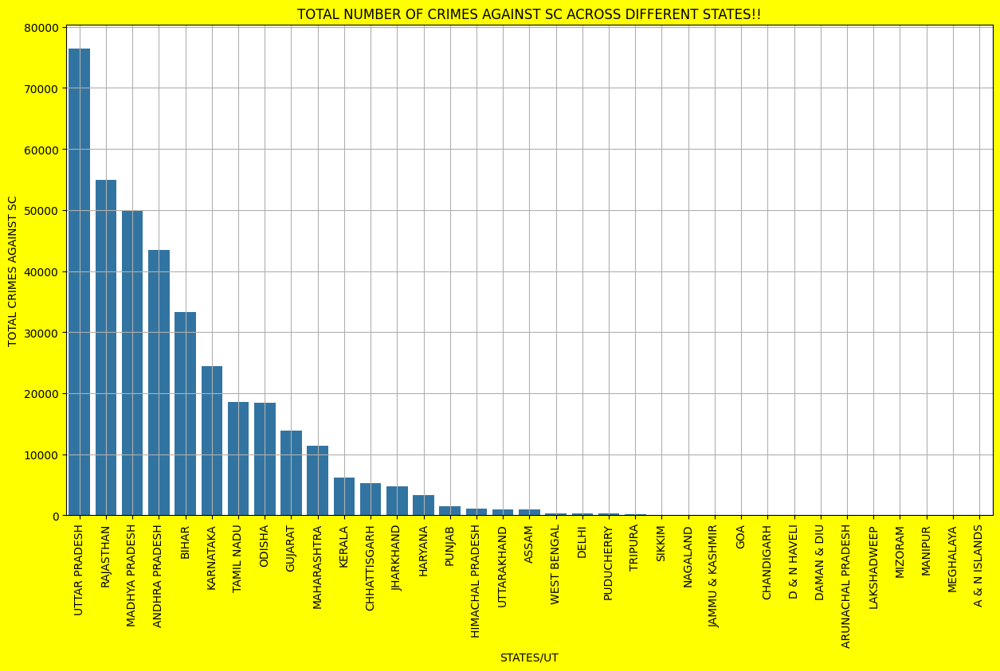

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.barplot(x=dfss['STATE/UT'],y=dfss['TOTAL CRIMES AGAINST SC'])
plt.xticks(rotation=90)
plt.xlabel("STATES/UT")
plt.ylabel("TOTAL CRIMES AGAINST SC")
plt.title("TOTAL NUMBER OF CRIMES AGAINST SC ACROSS DIFFERENT STATES!!")
plt.grid()
plt.show()

In [ ]:
dfsy=df10.groupby(['Year']).sum().sort_values(by="TOTAL CRIMES AGAINST SC",ascending=False).reset_index()

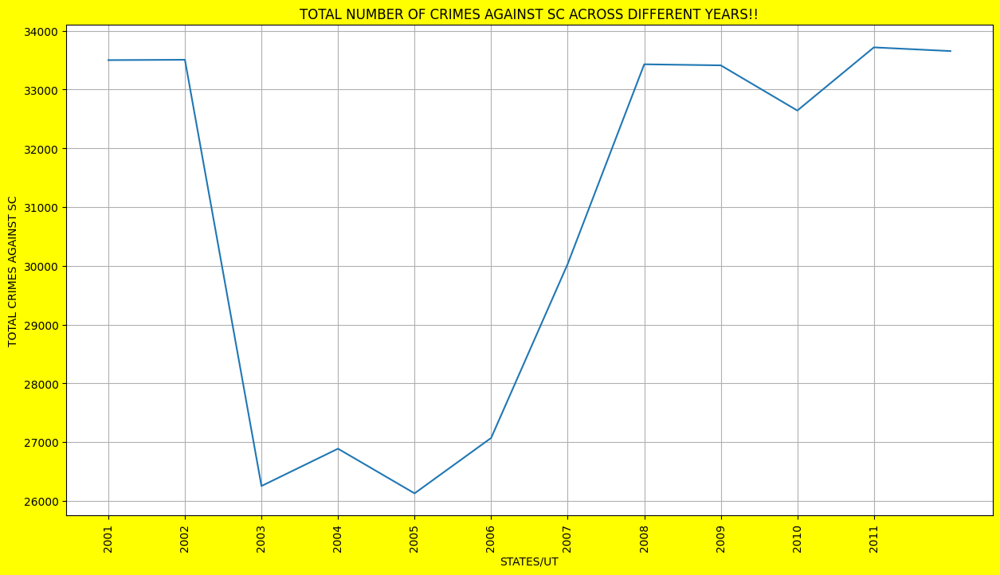

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfsy['Year'],y=dfsy['TOTAL CRIMES AGAINST SC'])
plt.xticks(rotation=90)
plt.xlabel("STATES/UT")
plt.ylabel("TOTAL CRIMES AGAINST SC")
plt.title("TOTAL NUMBER OF CRIMES AGAINST SC ACROSS DIFFERENT YEARS!!")
plt.xticks([x for x in range(2001,2012)])
plt.grid()
plt.show()

In [ ]:
lis

['Murder',
 'Rape',
 'Kidnapping and Abduction',
 'Dacoity',
 'Robbery',
 'Arson',
 'Hurt',
 'Prevention of atrocities (POA) Act',
 'Protection of Civil Rights (PCR) Act',
 'Other Crimes Against SCs']

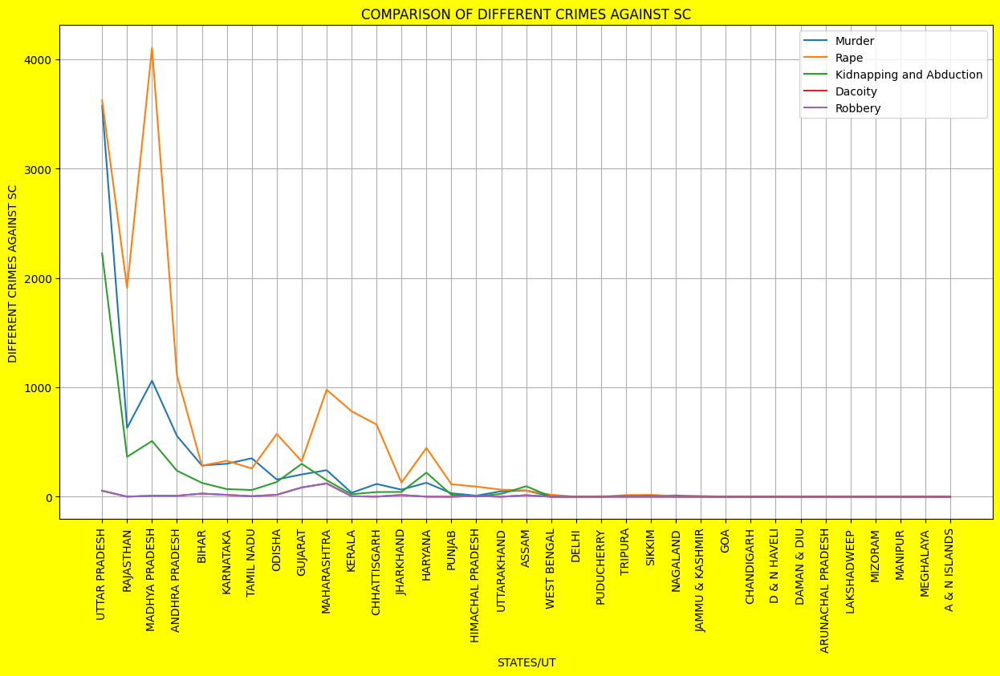

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.lineplot(x=dfss['STATE/UT'],y=dfss['Murder'],label="Murder")
sns.lineplot(x=dfss['STATE/UT'],y=dfss['Rape'],label="Rape")
sns.lineplot(x=dfss['STATE/UT'],y=dfss['Kidnapping and Abduction'],label="Kidnapping and Abduction")
sns.lineplot(x=dfss['STATE/UT'],y=dfss['Dacoity'],label="Dacoity")
sns.lineplot(x=dfss['STATE/UT'],y=dfss['Dacoity'],label="Robbery")
plt.xticks(rotation=90)
plt.xlabel("STATES/UT")
plt.ylabel("DIFFERENT CRIMES AGAINST SC")
plt.title("COMPARISON OF DIFFERENT CRIMES AGAINST SC")
plt.grid()
plt.show()

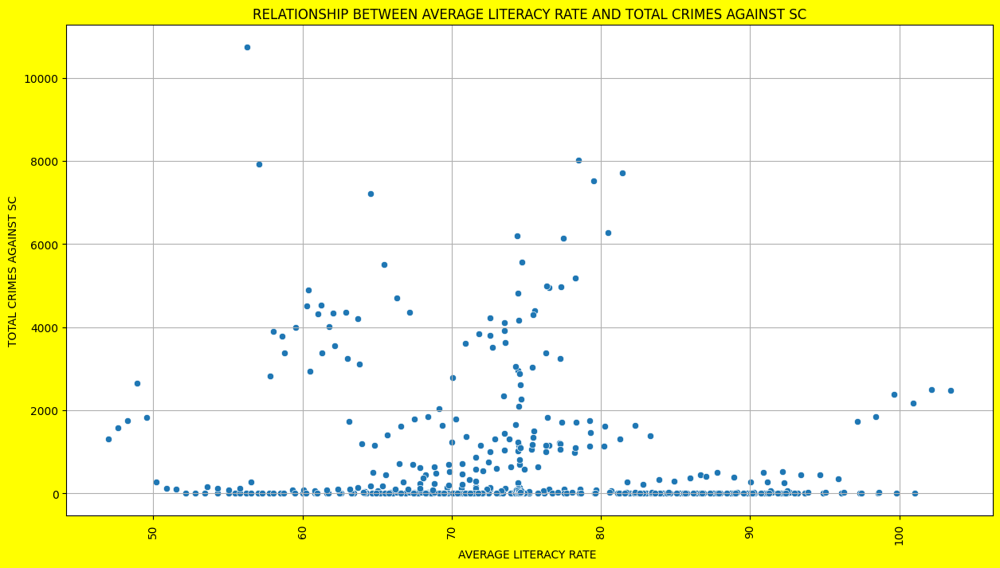

In [ ]:
plt.figure(figsize=(15,8),facecolor='Yellow')
sns.scatterplot(y=df10['TOTAL CRIMES AGAINST SC'],x=df10[' LITERACY RATE %  Average'])
plt.xticks(rotation=90)
plt.xlabel("AVERAGE LITERACY RATE ")
plt.ylabel("TOTAL CRIMES AGAINST SC")
plt.title("RELATIONSHIP BETWEEN AVERAGE LITERACY RATE AND TOTAL CRIMES AGAINST SC")
plt.grid()
plt.show()


In [360]:
dist=pd.read_csv(r"C:\Users\pradu\Downloads\district.csv")

In [361]:
dist.drop(['DISTRICT',' LITERACY RATE % Female',' LITERACY RATE %   (Male)','predicted population increase rate  for next year','predicted literacy increase rate for next year'],axis=1,inplace=True)

In [362]:
dist

,STATE/UT,Year,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS,...,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban
0,ANDHRA PRADESH,2001,2602,1555,136,871,0,871,1182,765,...,7400,34344,130089,60.500000,191792.000000,3.828681e+07,3.744073e+07,7.621001e+07,5.540107e+07,2.080894e+07
1,ARUNACHAL PRADESH,2001,83,53,3,33,0,33,83,55,...,0,618,2342,54.300000,83743.000000,5.739510e+05,5.171660e+05,1.091117e+06,8.700870e+05,2.278810e+05
2,ASSAM,2001,1356,481,40,817,0,817,1480,1070,...,2010,9315,36877,63.300000,78438.000000,1.378780e+07,1.285061e+07,2.665553e+07,2.321629e+07,3.439240e+06
3,BIHAR,2001,3643,3419,250,888,0,888,2159,518,...,2406,36667,88432,47.000000,94163.000000,4.315396e+07,3.972483e+07,8.299851e+07,7.431671e+07,8.681800e+06
4,CHHATTISGARH,2001,880,529,45,959,0,959,207,171,...,689,15790,38460,64.700000,135191.000000,1.045243e+07,1.034353e+07,2.083380e+07,1.664806e+07,4.185747e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
403,CHANDIGARH,2012,21,44,5,27,0,27,87,66,...,3,1042,3606,74.591521,85455.246627,1.647477e+07,1.536594e+07,3.700765e+07,2.301288e+07,8.877176e+06
404,D & N HAVELI,2012,7,2,0,3,0,3,13,9,...,23,112,318,74.612278,85634.145969,1.651486e+07,1.540339e+07,3.709861e+07,2.306838e+07,8.899343e+06
405,DAMAN & DIU,2012,3,5,0,5,0,5,3,0,...,38,46,239,74.642180,85452.138556,1.650941e+07,1.539640e+07,3.709937e+07,2.304703e+07,8.908128e+06
406,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,...,0,32,60,74.655017,85543.281773,1.651862e+07,1.540697e+07,3.713246e+07,2.306508e+07,8.909805e+06


In [363]:
child=pd.read_csv(r"C:\Users\pradu\Downloads\children_crime_case.csv")

In [364]:
child.rename(columns = {'Total':'TOTAL CRIMES AGAINST CHILDREN'}, inplace = True)

In [365]:
child

,STATE/UT,Year,Murder,Rape,Kidnapping and Abduction,Foeticide,Abetment of suicide,Exposure and abandonment,Procuration of minor girls,Buying of girls for prostitution,...,TOTAL CRIMES AGAINST CHILDREN,LITERACY RATE % (Male),LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban
0,ANDHRA PRADESH,2001,35,84,57,0,7,22,12,0,...,270,70.300000,50.400000,60.500000,191792.000000,3.828681e+07,3.744073e+07,7.621001e+07,5.540107e+07,2.080894e+07
1,ANDHRA PRADESH,2002,43,137,86,0,13,5,9,1,...,333,63.800000,43.500000,54.300000,83743.000000,5.739510e+05,5.171660e+05,1.091117e+06,8.700870e+05,2.278810e+05
2,ANDHRA PRADESH,2003,119,383,373,0,3,36,46,0,...,1463,71.300000,54.600000,63.300000,78438.000000,1.378780e+07,1.285061e+07,2.665553e+07,2.321629e+07,3.439240e+06
3,ANDHRA PRADESH,2004,71,363,396,0,2,26,60,0,...,1328,59.700000,33.100000,47.000000,94163.000000,4.315396e+07,3.972483e+07,8.299851e+07,7.431671e+07,8.681800e+06
4,ANDHRA PRADESH,2005,57,315,332,1,4,99,48,9,...,950,77.400000,51.900000,64.700000,135191.000000,1.045243e+07,1.034353e+07,2.083380e+07,1.664806e+07,4.185747e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
407,WEST BENGAL,2008,19,129,196,1,0,1,53,2,...,513,78.609286,60.885061,69.630584,84876.539647,1.511960e+07,1.410235e+07,3.403327e+07,2.110402e+07,8.163175e+06
408,WEST BENGAL,2009,20,109,199,0,0,0,41,2,...,484,78.616063,60.886321,69.632741,85078.567023,1.515813e+07,1.413832e+07,3.412026e+07,2.115758e+07,8.184223e+06
409,WEST BENGAL,2010,16,73,332,0,3,0,200,48,...,880,78.606235,60.877194,69.622696,84961.737327,1.511628e+07,1.409494e+07,3.404680e+07,2.112183e+07,8.134093e+06
410,WEST BENGAL,2011,46,252,660,0,3,1,298,0,...,1450,78.600017,60.868044,69.613405,85155.180801,1.515130e+07,1.412751e+07,3.412692e+07,2.116980e+07,8.153803e+06


In [366]:
place_crime=pd.read_csv(r"C:\Users\pradu\Downloads\places.csv")

In [367]:
place_crime.drop(['Population Male','Population Female',' LITERACY RATE % Female',' LITERACY RATE %   (Male)','Population Total','Rural','Urban','predicted population increase rate  for next year','predicted literacy increase rate for next year','Area(km2)'],axis=1,inplace=True)

In [368]:
place_crime

,STATE/UT,Year,RESIDENTIAL PREMISES - Dacoity,RESIDENTIAL PREMISES - Robbery,RESIDENTIAL PREMISES - Burglary,RESIDENTIAL PREMISES - Theft,HIGHWAYS - Dacoity,HIGHWAYS - Robbery,HIGHWAYS - Burglary,HIGHWAYS - Theft,...,COMMERCIAL ESTABLISHMENTS - Theft,OTHER PLACES - Dacoity,OTHER PLACES - Robbery,OTHER PLACES - Burglary,OTHER PLACES - Theft,TOTAL - Dacoity,TOTAL - Robbery,TOTAL - Burglary,TOTAL - Theft,LITERACY RATE % Average
0,ANDHRA PRADESH,2001,100,177,5158,4257,57,172,31,74,...,2502,37,232,862,8849,214,629,7220,16751,60.5
1,ARUNACHAL PRADESH,2001,9,26,99,131,0,0,0,8,...,54,8,40,65,249,22,84,248,443,54.3
2,ASSAM,2001,381,191,1695,2901,46,136,7,87,...,967,77,261,271,1342,532,687,2423,5367,63.3
3,BIHAR,2001,818,326,2486,4741,162,826,0,257,...,686,210,880,505,2582,1291,2203,3233,9701,47.0
4,CHHATTISGARH,2001,54,42,3336,1417,10,38,12,72,...,299,15,239,420,2835,87,338,4144,4812,64.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451,DELHI,2012,10,101,1249,7076,1,32,0,189,...,1370,17,431,178,12749,28,608,1715,22032,NaN
452,LAKSHADWEEP,2012,0,0,3,7,0,0,0,0,...,0,0,0,0,0,0,0,3,7,NaN
453,PUDUCHERRY,2012,1,4,47,42,0,0,0,0,...,20,2,8,4,596,5,16,77,658,NaN
454,TOTAL (UTs),2012,11,123,1515,7974,1,32,0,199,...,2042,28,468,217,13554,44,694,2149,24440,NaN


In [369]:
juvenile=pd.read_csv(r"C:\Users\pradu\Downloads\juvenile.csv")

In [370]:
juvenile=juvenile[juvenile['CRIME']=='Total IPC Crimes'].reset_index()

In [371]:
juvenile.drop(['CRIME',' LITERACY RATE %   (Male)',' LITERACY RATE % Female','Area(km2)','Population Male','Population Female','Population Total','Rural','Urban','predicted population increase rate  for next year','predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [372]:
juvenile.rename(columns={"Grand total":"TOTAL JUVENILE CRIMES"},inplace=True)

In [373]:
juvenile.drop(['index'],axis=1,inplace=True)

In [374]:
juvenile

,STATE/UT,Year,Boys 7-12 Years,Girls 7-12 Years,Boys 12-16 Years,Girls 12-16 Years,Boys 16-18 Years,Girls 16-18 Years,Total for boys all Age Groups,Total for girls all Age Groups,TOTAL JUVENILE CRIMES
0,Andhra Pradesh,2001,112,4,567,5,669,68,1348,77,1425
1,Andhra Pradesh,2002,112,5,543,37,640,129,1295,171,1466
2,Andhra Pradesh,2003,46,0,442,30,1216,108,1704,138,1842
3,Andhra Pradesh,2004,54,2,443,30,731,44,1228,76,1304
4,Andhra Pradesh,2005,73,1,547,16,721,61,1341,78,1419
...,...,...,...,...,...,...,...,...,...,...,...
345,Puducherry,2006,0,0,17,0,18,1,35,1,36
346,Puducherry,2007,0,0,19,0,39,4,58,4,62
347,Puducherry,2008,0,0,12,0,39,0,51,0,51
348,Puducherry,2009,0,0,35,3,40,1,75,4,79


In [375]:
human_right=pd.read_csv(r"C:\Users\pradu\Downloads\humanright.csv")

In [376]:
human_right.drop(['Group_Name','Sub_Group_Name',' LITERACY RATE %   (Male)',' LITERACY RATE % Female','Area(km2)','Population Male','Population Female','Population Total','Rural','Urban','predicted population increase rate  for next year','predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [377]:
human_right

,Area_Name,Year,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted
0,Andhra Pradesh,2001,0.0,0.0,0.0
1,Arunachal Pradesh,2001,0.0,0.0,0.0
2,Assam,2001,0.0,0.0,0.0
3,Bihar,2001,0.0,0.0,0.0
4,Chandigarh,2001,0.0,0.0,0.0
...,...,...,...,...,...
2262,Meghalaya,2010,0.0,0.0,0.0
2263,Nagaland,2010,0.0,0.0,0.0
2264,Odisha,2010,5.0,1.0,0.0
2265,Uttar Pradesh,2010,6.0,5.0,0.0


In [378]:
uni=human_right['Area_Name'].unique().tolist()
ye=human_right['Year'].unique().tolist()

In [379]:
state=[]
year=[]
cases=[]
police_charge=[]
police_convict=[]
for i in uni:
    for j in ye:
        temp=human_right[(human_right['Area_Name']==i)&(human_right['Year']==j)].groupby(by='Year').sum().reset_index()
        if len(temp)==1:
            state.append(i)
            year.append(temp['Year'][0])
            cases.append(temp['Cases_Registered_under_Human_Rights_Violations'][0])
            police_charge.append(temp['Policemen_Chargesheeted'][0])
            police_convict.append(temp['Policemen_Convicted'][0])
        else:
            state.append(i)
            year.append(j)
            cases.append(0)
            police_charge.append(0)
            police_convict.append(0)

In [380]:
mod_human=pd.DataFrame({"STATE/UT":state,"Year":year,"Cases_Registered_under_Human_Rights_Violations":cases,"Policemen_Chargesheeted":police_charge,"Policemen_Convicted":police_convict})

In [381]:
mod_human.head(60)

,STATE/UT,Year,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted
0,Andhra Pradesh,2001,90.0,58.0,4.0
1,Andhra Pradesh,2002,52.0,28.0,0.0
2,Andhra Pradesh,2003,44.0,20.0,0.0
3,Andhra Pradesh,2004,40.0,4.0,0.0
4,Andhra Pradesh,2005,0.0,0.0,0.0
5,Andhra Pradesh,2006,0.0,0.0,0.0
6,Andhra Pradesh,2007,0.0,0.0,0.0
7,Andhra Pradesh,2008,0.0,0.0,0.0
8,Andhra Pradesh,2009,0.0,0.0,0.0
9,Andhra Pradesh,2010,0.0,0.0,0.0


In [382]:
mod_human['TOTAL CASES AGAINST HUMAN RIGHT VIOLATION']=mod_human[mod_human.iloc[:,2:].columns.tolist()].sum(axis=1)

In [383]:
mod_human

,STATE/UT,Year,Cases_Registered_under_Human_Rights_Violations,Policemen_Chargesheeted,Policemen_Convicted,TOTAL CASES AGAINST HUMAN RIGHT VIOLATION
0,Andhra Pradesh,2001,90.0,58.0,4.0,152.0
1,Andhra Pradesh,2002,52.0,28.0,0.0,80.0
2,Andhra Pradesh,2003,44.0,20.0,0.0,64.0
3,Andhra Pradesh,2004,40.0,4.0,0.0,44.0
4,Andhra Pradesh,2005,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...
305,Puducherry,2006,0.0,0.0,0.0,0.0
306,Puducherry,2007,0.0,0.0,0.0,0.0
307,Puducherry,2008,0.0,0.0,0.0,0.0
308,Puducherry,2009,0.0,0.0,0.0,0.0


In [384]:
police_affected=pd.read_csv(r"C:\Users\pradu\Downloads\police.csv")

In [385]:
police_affected

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,...,LITERACY RATE % Female,LITERACY RATE % Average,Area(km2),Population Male,Population Female,Population Total,Rural,Urban,predicted population increase rate for next year,predicted literacy increase rate for next year
0,Andaman & Nicobar Islands,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,50.4,60.5,191792.0,38286811.0,37440730.0,76210007.0,55401067.0,20808940.0,1.79,1.37
1,Andhra Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,3,4,1,3,0,...,43.5,54.3,83743.0,573951.0,517166.0,1091117.0,870087.0,227881.0,1.79,1.37
2,Arunachal Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,...,54.6,63.3,78438.0,13787799.0,12850608.0,26655528.0,23216288.0,3439240.0,1.79,1.37
3,Assam,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,1,0,...,33.1,47.0,94163.0,43153964.0,39724832.0,82998509.0,74316709.0,8681800.0,1.79,1.37
4,Bihar,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,1,0,0,0,2,0,...,51.9,64.7,135191.0,10452426.0,10343530.0,20833803.0,16648056.0,4185747.0,1.79,1.37
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,Tamil Nadu,2010,Police - Total,7. Total Police Killed or Injured,10,26,142,4,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2446,Tripura,2010,Police - Total,7. Total Police Killed or Injured,0,0,0,0,2,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2447,Uttar Pradesh,2010,Police - Total,7. Total Police Killed or Injured,6,10,9,10,0,8,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2448,Uttarakhand,2010,Police - Total,7. Total Police Killed or Injured,0,0,5,0,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [386]:
police_affected.drop([' LITERACY RATE %   (Male)',' LITERACY RATE % Female','Area(km2)','Population Male','Population Female','Population Total','Rural','Urban','predicted population increase rate  for next year','predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [387]:
police_affected

,Area_Name,Year,Group_Name,Sub_Group_Name,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,Police_Injured_Total_Policemen,Police_Killed_By_Criminals,Police_Killed_By_Riotous_Mobs,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen
0,Andaman & Nicobar Islands,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Andhra Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,3,4,1,3,0,11,0,0,2,0,3,0,5
2,Arunachal Pradesh,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Assam,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,0,0,0,0,1,0,1,0,0,1,0,0,0,1
4,Bihar,2001,Police - Assistant Sub-Inspectors,3. Assistant Sub-Inspectos,1,0,0,0,2,0,3,0,0,0,0,2,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2445,Tamil Nadu,2010,Police - Total,7. Total Police Killed or Injured,10,26,142,4,0,0,182,2,0,65,0,0,0,67
2446,Tripura,2010,Police - Total,7. Total Police Killed or Injured,0,0,0,0,2,0,2,0,0,0,0,0,2,2
2447,Uttar Pradesh,2010,Police - Total,7. Total Police Killed or Injured,6,10,9,10,0,8,43,2,1,101,0,0,1,105
2448,Uttarakhand,2010,Police - Total,7. Total Police Killed or Injured,0,0,5,0,0,0,5,0,0,15,0,0,0,15


In [388]:
police_affected.drop(['Group_Name','Sub_Group_Name'],axis=1,inplace=True)

In [389]:
uni=police_affected['Area_Name'].unique().tolist()
ye=police_affected['Year'].unique().tolist()

police_affected.columns

state=[]
year=[]
Police_Injured_By_Criminals=[]
Police_Injured_By_Riotous_Mobs=[]
Police_Injured_In_Accidents=[]
Police_Injured_In_Dacoity_OperationsOther_raids=[]
Police_Injured_In_TerroristsExtremists_Operations=[]
Police_Injured_On_Border_Duties=[]
Police_Injured_Total_Policemen=[]
Police_Killed_By_Criminals=[]
Police_Killed_By_Riotous_Mobs=[]
Police_Killed_In_Accidents=[]
Police_Killed_In_Dacoity_OperationsOther_raids=[]
Police_Killed_In_TerroristsExtremists_Operations=[]
Police_Killed_On_Border_Duties=[]
Police_Killed_Total_Policemen=[]
for i in uni:
    for j in ye:
        temp=police_affected[(police_affected['Area_Name']==i)&(police_affected['Year']==j)].groupby(by='Year').sum().reset_index()
        if len(temp)==1:
            state.append(i)
            year.append(temp['Year'][0])
            Police_Injured_By_Criminals.append(temp['Police_Injured_By_Criminals'][0])
            Police_Injured_By_Riotous_Mobs.append(temp['Police_Injured_By_Riotous_Mobs'][0])
            Police_Injured_In_Accidents.append(temp['Police_Injured_In_Accidents'][0])
            Police_Injured_In_Dacoity_OperationsOther_raids.append(temp['Police_Injured_In_Dacoity_OperationsOther_raids'][0])
            Police_Injured_In_TerroristsExtremists_Operations.append(temp['Police_Injured_In_TerroristsExtremists_Operations'][0])
            Police_Injured_On_Border_Duties.append(temp['Police_Injured_On_Border_Duties'][0])
            Police_Injured_Total_Policemen.append(temp['Police_Injured_Total_Policemen'][0])
            Police_Killed_By_Criminals.append(temp['Police_Killed_By_Criminals'][0])
            Police_Killed_By_Riotous_Mobs.append(temp['Police_Killed_By_Riotous_Mobs'][0])
            Police_Killed_In_Accidents.append(temp['Police_Killed_In_Accidents'][0])
            Police_Killed_In_Dacoity_OperationsOther_raids.append(temp['Police_Killed_In_Dacoity_OperationsOther_raids'][0])
            Police_Killed_In_TerroristsExtremists_Operations.append(temp['Police_Killed_In_TerroristsExtremists_Operations'][0])
            Police_Killed_On_Border_Duties.append(temp['Police_Killed_On_Border_Duties'][0])
            Police_Killed_Total_Policemen.append(temp['Police_Killed_Total_Policemen'][0])
        else:
            state.append(i)
            year.append(j)
            Police_Injured_By_Criminals.append(0)
            Police_Injured_By_Riotous_Mobs.append(0)
            Police_Injured_In_Accidents.append(0)
            Police_Injured_In_Dacoity_OperationsOther_raids.append(0)
            Police_Injured_In_TerroristsExtremists_Operations.append(0)
            Police_Injured_On_Border_Duties.append(0)
            Police_Injured_Total_Policemen.append(0)
            Police_Killed_By_Criminals.append(0)
            Police_Killed_By_Riotous_Mobs.append(0)
            Police_Killed_In_Accidents.append(0)
            Police_Killed_In_Dacoity_OperationsOther_raids.append(0)
            Police_Killed_In_TerroristsExtremists_Operations.append(0)
            Police_Killed_On_Border_Duties.append(0)
            Police_Killed_Total_Policemen.append(0)

In [390]:
police_affected.columns

Index(['Area_Name', 'Year', 'Police_Injured_By_Criminals',
       'Police_Injured_By_Riotous_Mobs', 'Police_Injured_In_Accidents',
       'Police_Injured_In_Dacoity_OperationsOther_raids',
       'Police_Injured_In_TerroristsExtremists_Operations',
       'Police_Injured_On_Border_Duties', 'Police_Injured_Total_Policemen',
       'Police_Killed_By_Criminals', 'Police_Killed_By_Riotous_Mobs',
       'Police_Killed_In_Accidents',
       'Police_Killed_In_Dacoity_OperationsOther_raids',
       'Police_Killed_In_TerroristsExtremists_Operations',
       'Police_Killed_On_Border_Duties', 'Police_Killed_Total_Policemen'],
      dtype='object')

In [391]:
police_aff=pd.DataFrame({"STATE/UT":state,"Year":year,"Police_Injured_By_Criminals":Police_Injured_By_Criminals,"Police_Injured_By_Riotous_Mobs":Police_Injured_By_Riotous_Mobs,"Police_Injured_In_Accidents":Police_Injured_In_Accidents,"Police_Injured_In_Dacoity_OperationsOther_raids":Police_Injured_In_Dacoity_OperationsOther_raids,"Police_Injured_In_TerroristsExtremists_Operations":Police_Injured_In_TerroristsExtremists_Operations,"Police_Injured_On_Border_Duties":Police_Injured_On_Border_Duties,"Police_Injured_Total_Policemen":Police_Injured_Total_Policemen,"Police_Killed_By_Criminals":Police_Killed_By_Criminals,"Police_Killed_By_Riotous_Mobs":Police_Killed_By_Riotous_Mobs,"Police_Killed_In_Accidents":Police_Killed_In_Accidents,"Police_Killed_In_Dacoity_OperationsOther_raids":Police_Killed_In_Dacoity_OperationsOther_raids,"Police_Killed_In_TerroristsExtremists_Operations":Police_Killed_In_TerroristsExtremists_Operations,"Police_Killed_On_Border_Duties":Police_Killed_On_Border_Duties,"Police_Killed_Total_Policemen":Police_Killed_Total_Policemen})

police_aff

,STATE/UT,Year,Police_Injured_By_Criminals,Police_Injured_By_Riotous_Mobs,Police_Injured_In_Accidents,Police_Injured_In_Dacoity_OperationsOther_raids,Police_Injured_In_TerroristsExtremists_Operations,Police_Injured_On_Border_Duties,Police_Injured_Total_Policemen,Police_Killed_By_Criminals,Police_Killed_By_Riotous_Mobs,Police_Killed_In_Accidents,Police_Killed_In_Dacoity_OperationsOther_raids,Police_Killed_In_TerroristsExtremists_Operations,Police_Killed_On_Border_Duties,Police_Killed_Total_Policemen
0,Andaman & Nicobar Islands,2001,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Andaman & Nicobar Islands,2002,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Andaman & Nicobar Islands,2003,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Andaman & Nicobar Islands,2004,0,0,0,0,0,0,0,0,0,6,0,0,0,6
4,Andaman & Nicobar Islands,2005,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,West Bengal,2006,76,340,258,38,0,0,712,6,0,42,2,0,0,50
346,West Bengal,2007,72,796,104,28,0,0,1000,0,2,20,0,0,0,22
347,West Bengal,2008,58,490,274,6,0,0,828,2,0,30,0,0,0,32
348,West Bengal,2009,8,466,310,0,64,0,848,4,0,26,0,14,0,44


In [392]:
sc=pd.read_csv(r"C:\Users\pradu\Downloads\sc.csv")

In [393]:
sc.drop([' LITERACY RATE %   (Male)', ' LITERACY RATE % Female','Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [394]:
sc['TOTAL CRIMES AGAINST SC']=sc[sc.iloc[:,2:12].columns.tolist()].sum(axis=1)

In [395]:
sc

,STATE/UT,Year,Murder,Rape,Kidnapping and Abduction,Dacoity,Robbery,Arson,Hurt,Prevention of atrocities (POA) Act,Protection of Civil Rights (PCR) Act,Other Crimes Against SCs,TOTAL CRIMES AGAINST SC
0,ANDHRA PRADESH,2001,45,69,22,3,2,6,518,950,312,1006,2933
1,ARUNACHAL PRADESH,2001,0,0,0,0,0,0,0,0,0,0,0
2,ASSAM,2001,0,0,0,0,1,1,4,0,0,0,6
3,BIHAR,2001,28,35,8,2,1,17,378,513,81,240,1303
4,CHHATTISGARH,2001,8,52,8,0,1,0,101,164,1,166,501
...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,D & N HAVELI,2012,0,0,0,0,0,0,0,0,0,0,0
417,DAMAN & DIU,2012,0,0,0,0,0,0,0,0,0,0,0
418,DELHI,2012,0,0,0,0,0,0,0,38,0,6,44
419,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0,0


In [396]:
st=pd.read_csv(r"C:\Users\pradu\Downloads\st.csv")

In [397]:
st.drop(['DISTRICT', ' LITERACY RATE % Female','Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [398]:
st['TOTAL CRIMES AGAINST ST']=st[st.iloc[:,2:12].columns.tolist()].sum(axis=1)

In [399]:
st

,STATE/UT,Year,Murder,Rape,Kidnapping Abduction,Dacoity,Robbery,Arson,Hurt,Protection of Civil Rights (PCR) Act,Prevention of atrocities (POA) Act,Other Crimes Against STs,TOTAL CRIMES AGAINST ST
0,ANDHRA PRADESH,2001,4,21,5,0,0,1,106,26,129,220,512
1,ARUNACHAL PRADESH,2001,4,5,7,0,0,1,18,0,0,37,72
2,ASSAM,2001,0,0,0,0,0,0,0,0,0,0,0
3,BIHAR,2001,1,4,1,0,0,0,5,8,10,18,47
4,CHHATTISGARH,2001,18,87,5,1,7,1,63,2,6,296,486
...,...,...,...,...,...,...,...,...,...,...,...,...,...
416,D & N HAVELI,2012,0,0,0,0,0,0,0,0,1,3,4
417,DAMAN & DIU,2012,0,0,0,0,0,0,0,0,0,0,0
418,DELHI,2012,0,0,0,0,0,0,0,0,0,0,0
419,LAKSHADWEEP,2012,0,0,0,0,0,0,0,0,0,0,0


In [400]:
women=pd.read_csv(r"C:\Users\pradu\Downloads\women.csv")

In [401]:
women.drop(['DISTRICT',' LITERACY RATE %   (Male)', ' LITERACY RATE % Female','Area(km2)', 'Population Male',
       'Population Female', 'Population Total', 'Rural', 'Urban',
       'predicted population increase rate  for next year',
       'predicted literacy increase rate for next year',' LITERACY RATE %  Average'],axis=1,inplace=True)

In [402]:
women['TOTAL CRIMES AGAINST WOMEN']=women[women.iloc[:,2:].columns.tolist()].sum(axis=1)

In [403]:
women

,STATE/UT,Year,Rape,Kidnapping and Abduction,Dowry Deaths,Assault on women with intent to outrage her modesty,Insult to modesty of Women,Cruelty by Husband or his Relatives,Importation of Girls,TOTAL CRIMES AGAINST WOMEN
0,ANDHRA PRADESH,2001,871,765,420,3544,2271,5791,7,13669
1,ARUNACHAL PRADESH,2001,33,55,0,78,3,11,0,180
2,ASSAM,2001,817,1070,59,850,4,1248,0,4048
3,BIHAR,2001,888,518,859,562,21,1558,83,4489
4,CHHATTISGARH,2001,959,171,70,1763,161,840,0,3964
...,...,...,...,...,...,...,...,...,...,...
403,CHANDIGARH,2012,27,66,5,45,25,73,0,241
404,D & N HAVELI,2012,3,9,0,2,0,0,0,14
405,DAMAN & DIU,2012,5,0,0,0,0,3,0,8
406,LAKSHADWEEP,2012,0,0,0,1,0,1,0,2


In [404]:
def ff(data):
    name=[x for x in globals() if globals()[x] is data][0]
    unwanted=['STATE/UT','Year']
    col=data.columns.tolist()
    col=[i for i in col if i not in unwanted]
    new_col={i:i+'_'+str(name).upper() for i in col}
    data.rename(columns=new_col,inplace=True)